In [1]:
%load_ext autoreload
%autoreload 2

In [15]:
import numpy as np
import pandas as pd
import cv2
import matplotlib.pyplot as plt

In [16]:
import display
import dataloader
from dataloader import ThermalData
import clustering
import anomaly_detection

In [17]:
import module_extraction
from module_extraction import Filters, Modules

In [18]:
thermal_npdat_path = "../ModuleExtraction/hokuto/thermal"
input_img_path = '../ModuleExtraction/hokuto/thermal/DJI_0123_R.JPG'

画像データの取得

In [40]:
thermal_img_files = dataloader.get_img_files(dir_path="./images/modules",gray=False)
thermal_img_files_gray = dataloader.get_img_files(dir_path="./images/modules",gray=True)

In [20]:
type(thermal_img_files), len(thermal_img_files)

(dict, 158)

各モジュールの位置情報を取得

In [21]:
filters = Filters(thermal_npdat_path)
img_org = cv2.imread(input_img_path, 0)
img_filtered = filters.apply_all_filters(img_org)

In [22]:
modules = Modules(img_filtered)
img_con = modules.get_img_contours(img_org, index=True)

/Users/tnozawa/afterFIT/work/rule_based_anomaly_detection/module_extraction.py:58: UserWarning: Matplotlib is currently using module://ipykernel.pylab.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()


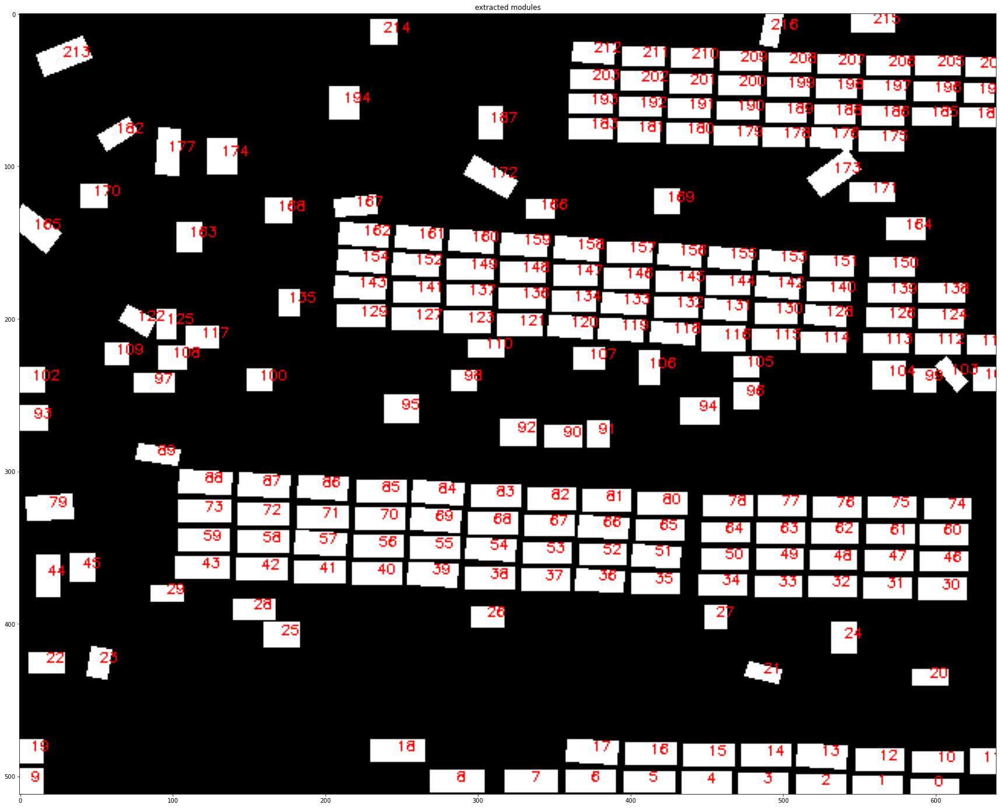

In [23]:
module_extraction.show_img({"extracted modules":img_con},cmap="gray",figsize=(30,30))

In [24]:
module_indices = list(map(lambda x: np.int(x.split(".")[0]), thermal_img_files.keys()))
module_contours = [modules.panel_contours[idx] for idx in module_indices]
module_labels = modules.get_string_anomaly_labels(module_contours)

(512.0, 0.0)

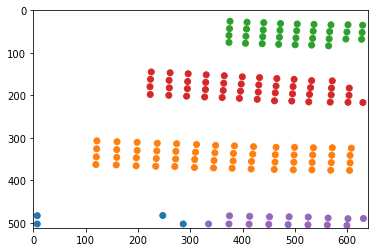

In [25]:
fig, ax = plt.subplots(facecolor="w")
cmap = plt.get_cmap("tab10")
module_centers = np.array( [c.mean(axis=0) for c in module_contours] )
plt.scatter(module_centers[:, 0], module_centers[:, 1], color=cmap(module_labels+1))
ax.set_xlim([0, img_con.shape[1]])
ax.set_ylim([img_con.shape[0], 0])

温度データの取得

In [26]:
#data = ThermalData(thermal_img_files)

In [27]:
data = {}
for c in range(-1,max(module_labels)+1):
    indices = np.where(module_labels==c)
    target_thermal_img_files = pd.Series(thermal_img_files).iloc[indices]
    data[c] = ThermalData(target_thermal_img_files)

温度分布の確認（個別）

温度分布の確認

In [28]:
#display.display_distributions(data.all_temperature, 
#                              filepath = "hist_all_temperature.jpg")

In [29]:
#display.display_distributions(data.scaled_all_temperature,
#                              filepath = "hist_scaled_all_temperature.jpg")

module label: -1


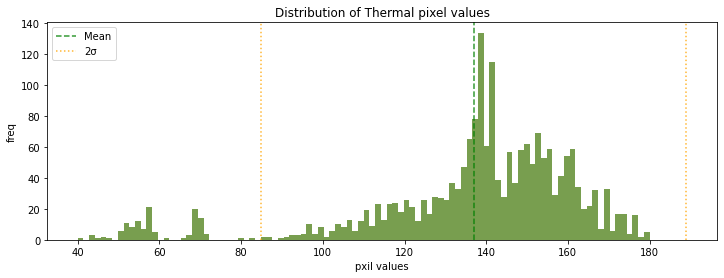

module label: 0


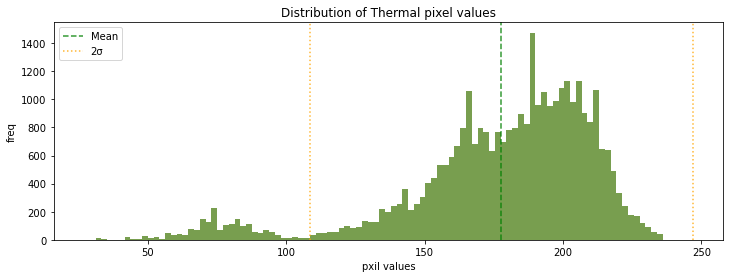

module label: 1


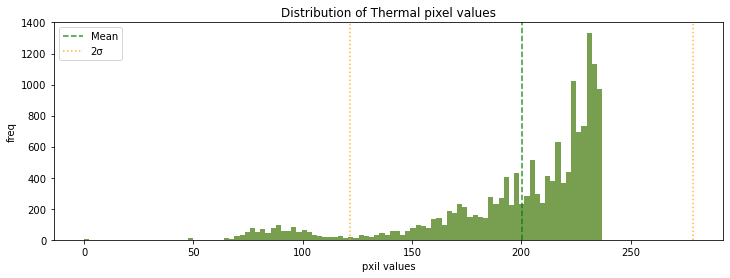

module label: 2


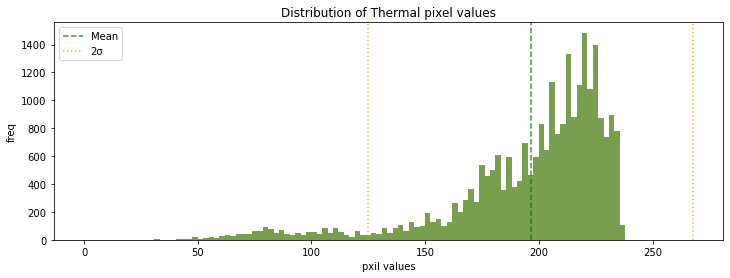

module label: 3


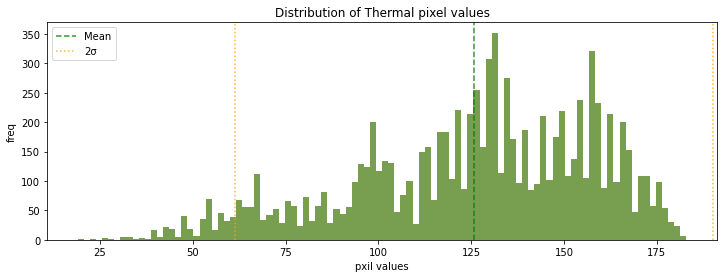

In [30]:
for k, v in data.items():
    print("module label:",k)
    display.display_distributions(v.all_temperature, 
                              filepath = "hist_all_temperature.jpg")

module label: -1


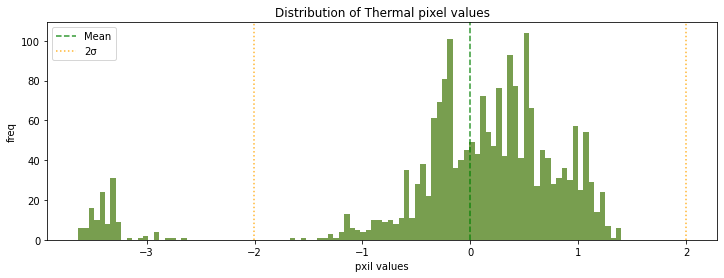

module label: 0


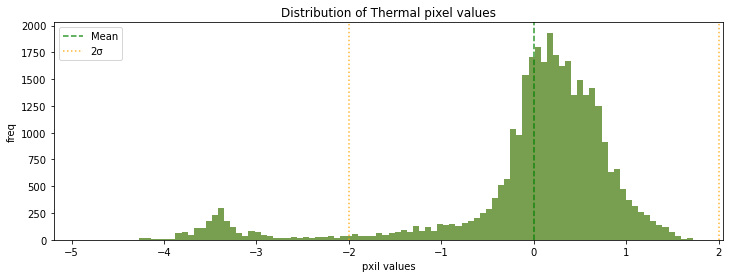

module label: 1


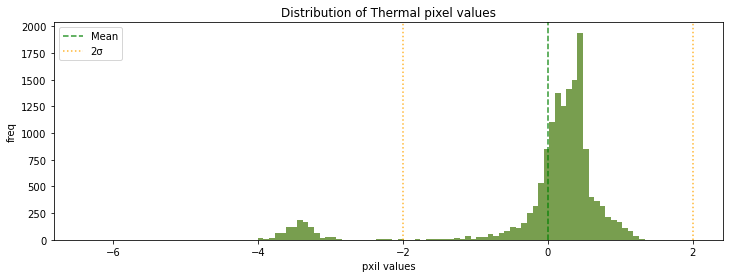

module label: 2


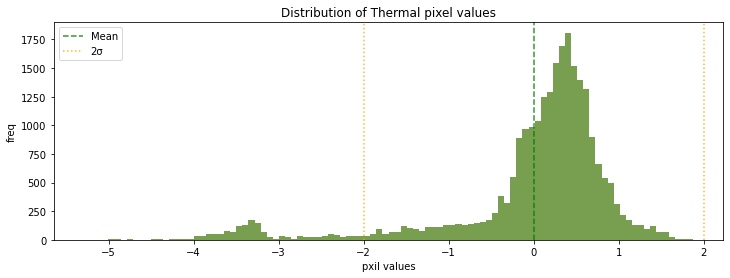

module label: 3


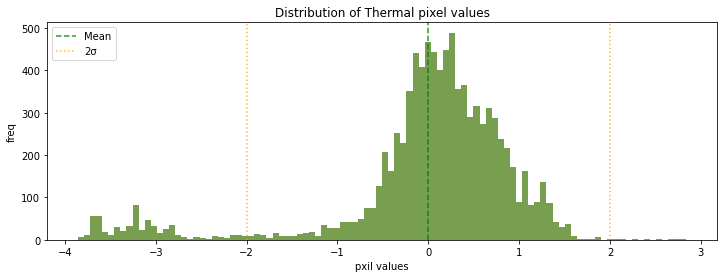

In [31]:
for k, v in data.items():
    print("module label:",k)
    display.display_distributions(v.scaled_all_temperature, 
                              filepath = "hist_scaled_all_temperature.jpg")

クラスタ分類モデルの作成

In [32]:
#gmm1 = anomaly_detection.AnoGMM(data.all_temperature)
#gmm2 = anomaly_detection.AnoGMM(data.scaled_all_temperature)

In [33]:
#gmm1.display()

In [34]:
#gmm2.display()

module label: -1


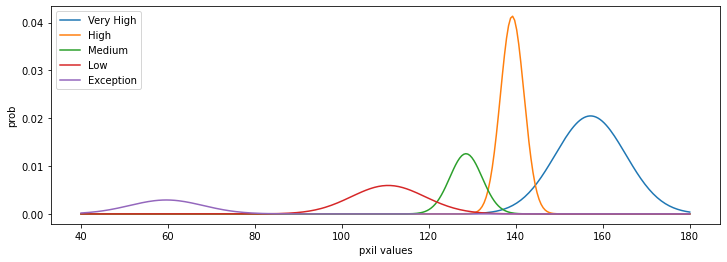

module label: 0


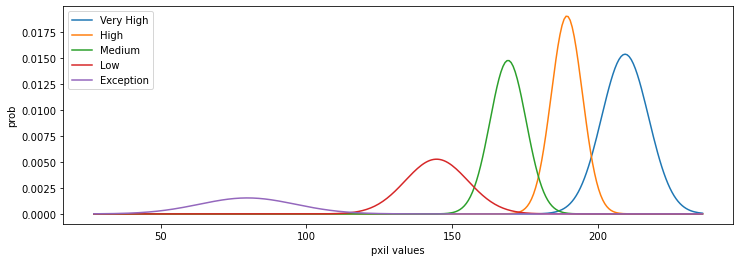

module label: 1


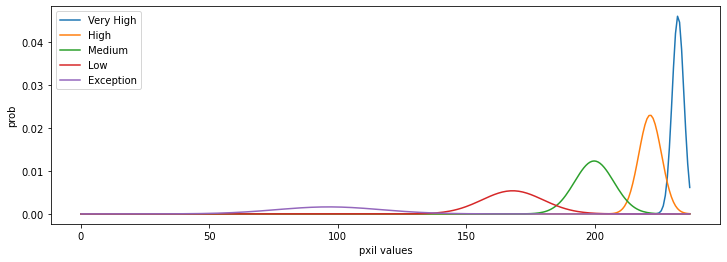

module label: 2


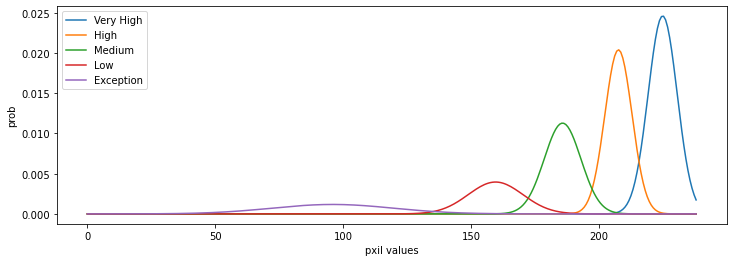

module label: 3


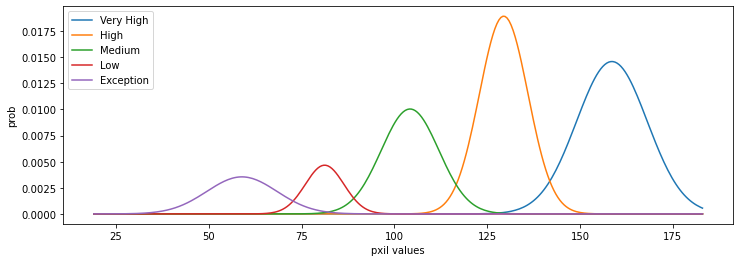

In [35]:
gmm = {}
for k, v in data.items():
    print("module label:",k)
    gmm[k] = anomaly_detection.AnoGMM(v.all_temperature)
    gmm[k].display()

異常タイプの確認テスト

In [36]:
def get_module_anomaly_type(temperature, gmm, img_file, log=False):
    # -- hot cluster --
    predicted_classes = gmm.predict(temperature)
    cluster_types = np.array([gmm.index2class[c] for c in predicted_classes ])
    hot_clusters = (cluster_types == "Very High")
    # -- hot pixcel --
    hot_pixels = np.array([ gmm.index2class[c] =="Very High" for c in predicted_classes[clusters.labels] ])
    hot_pixels = hot_pixels.reshape(*img_file.shape[:2],1)  
    # -- module type --
    module_type = anomaly_detection.detect_module_type(hot_clusters, hot_pixels)
    if log:
        print("Module type:", module_type)
        print("Cluster types:",cluster_types)
        print("Hotspot weights:",hot_pixels.mean())
    return module_type, hot_pixels, cluster_types

In [37]:
anomaly_modules= {}
clustering_method="kmeans"
#clustering_method="xmeans" # not stable
#clustering_method="dbscan"

******* start *******
63.jpg
0 0
Module type1: Normal


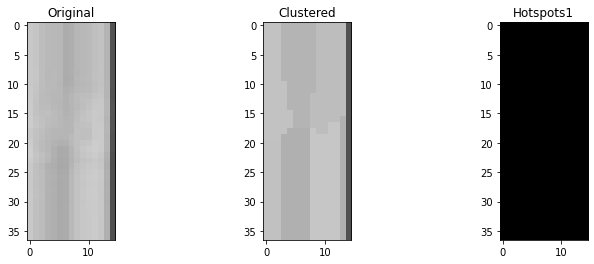

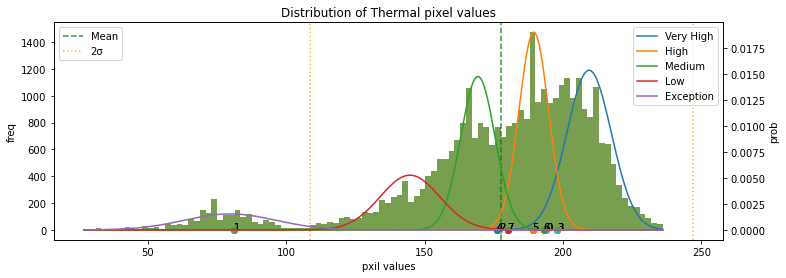

******* end *******
******* start *******
189.jpg
1 1
Module type1: Multi-Hotspots


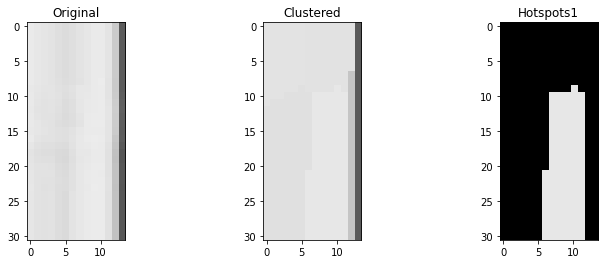

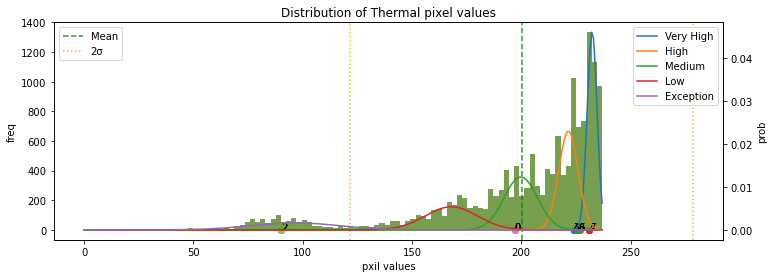

******* end *******
******* start *******
77.jpg
2 0
Module type1: Normal


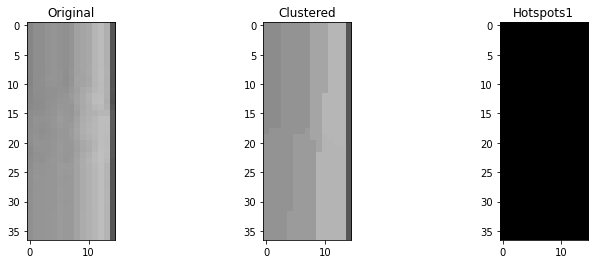

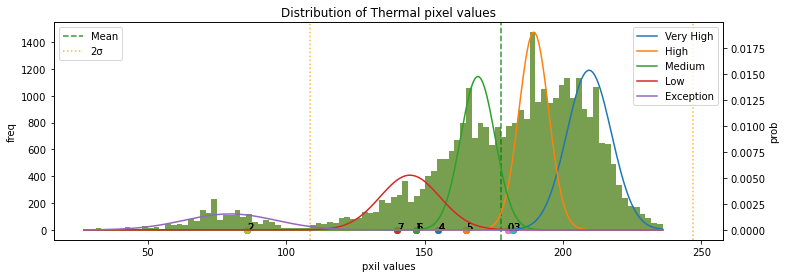

******* end *******
******* start *******
162.jpg
3 2
Module type1: Normal


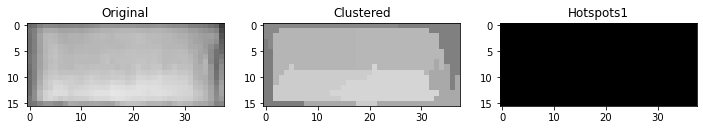

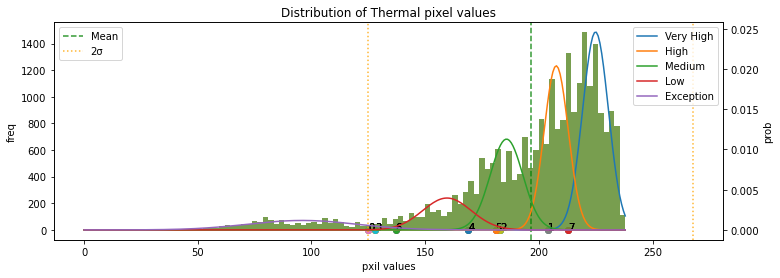

******* end *******
******* start *******
176.jpg
4 1
Module type1: Normal


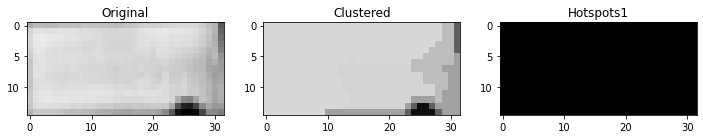

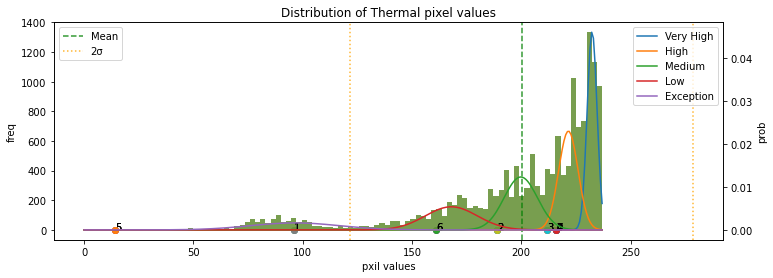

******* end *******
******* start *******
88.jpg
5 0
Module type1: Normal


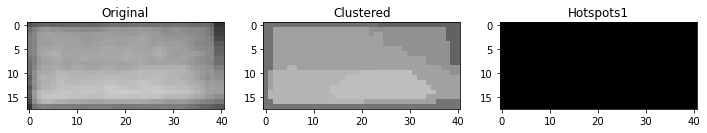

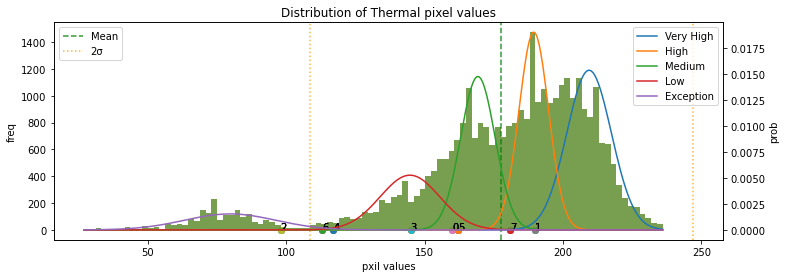

******* end *******
******* start *******
200.jpg
6 1
Module type1: Multi-Hotspots


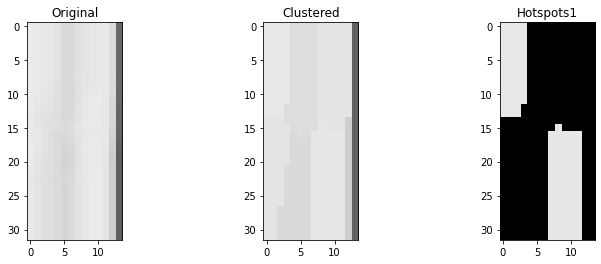

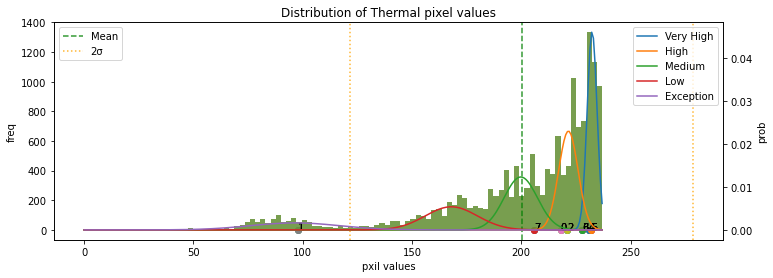

******* end *******
******* start *******
201.jpg
7 1
Module type1: Cluster-Anomaly


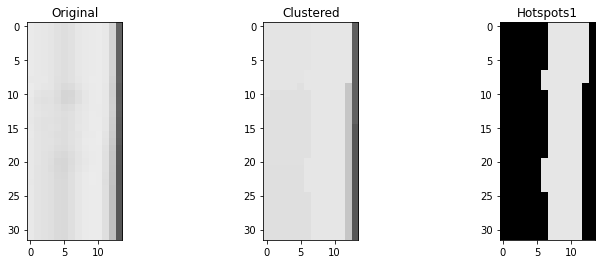

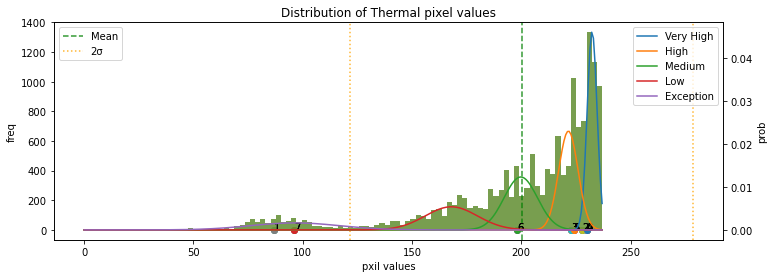

******* end *******
******* start *******
188.jpg
8 1
Module type1: Normal


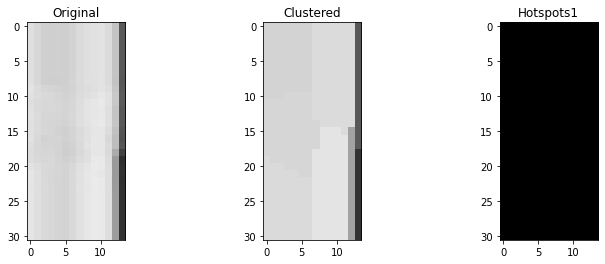

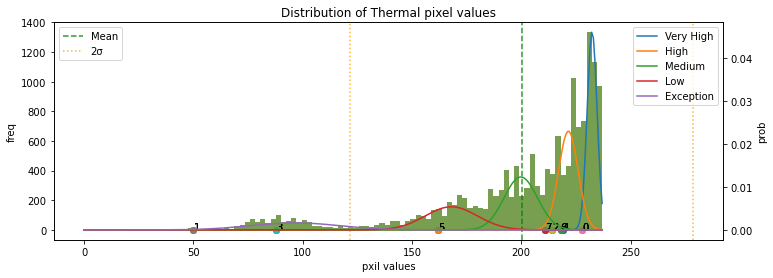

******* end *******
******* start *******
76.jpg
9 0
Module type1: Normal


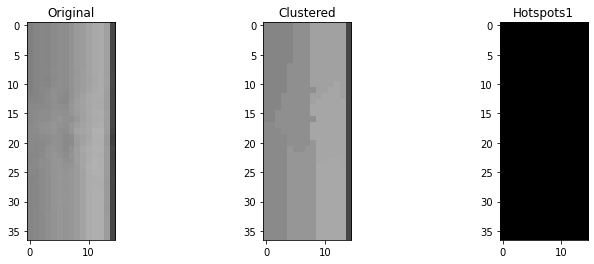

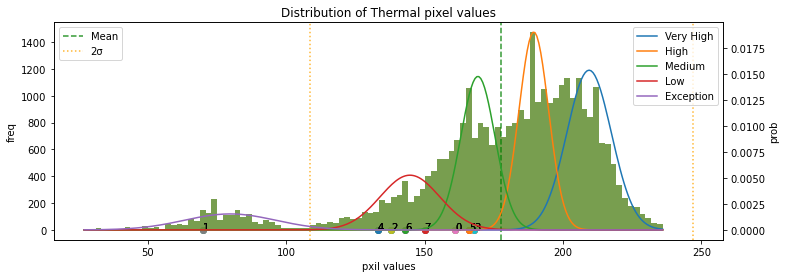

******* end *******
******* start *******
62.jpg
10 0
Module type1: Normal


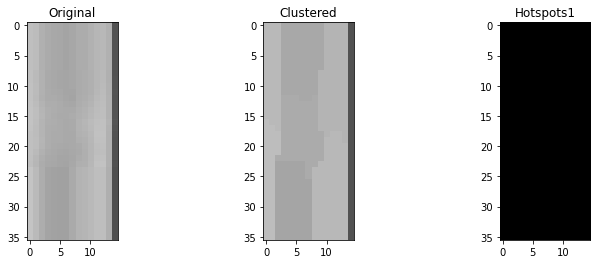

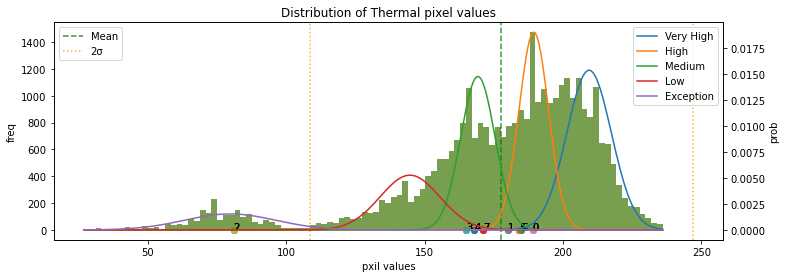

******* end *******
******* start *******
74.jpg
11 0
Module type1: Normal


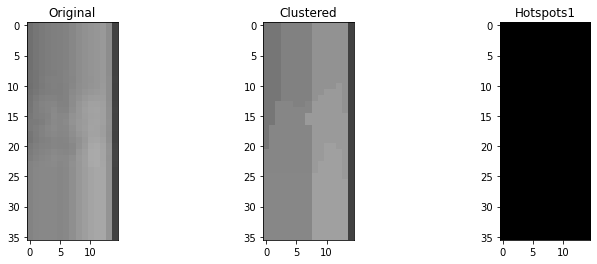

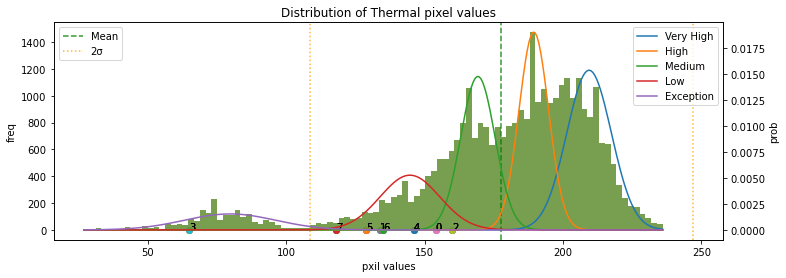

******* end *******
******* start *******
60.jpg
12 0
Module type1: Normal


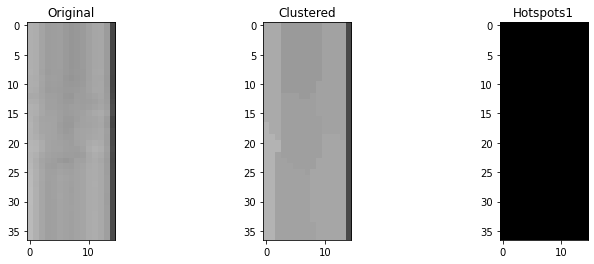

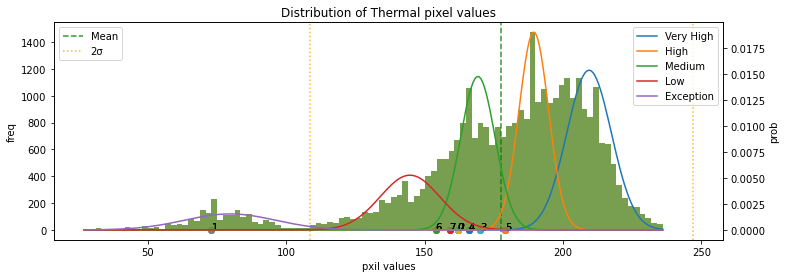

******* end *******
******* start *******
48.jpg
13 0
Module type1: Normal


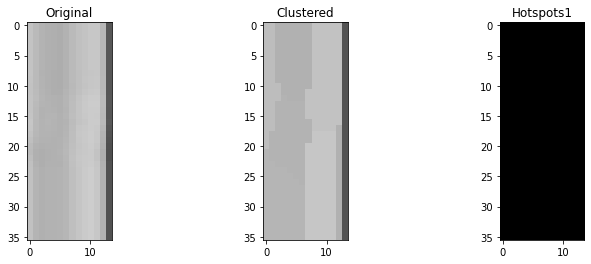

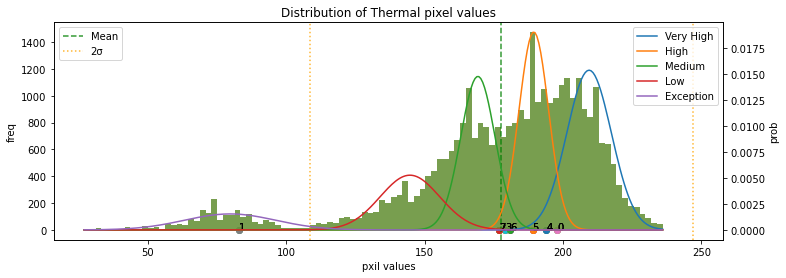

******* end *******
******* start *******
149.jpg
14 2
Module type1: Cluster-Anomaly


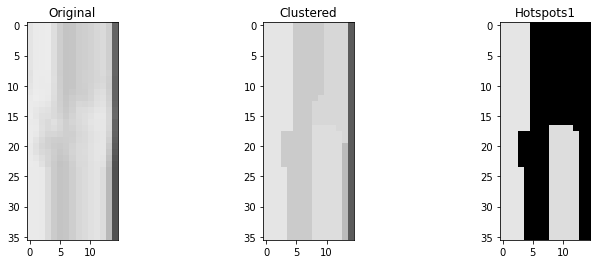

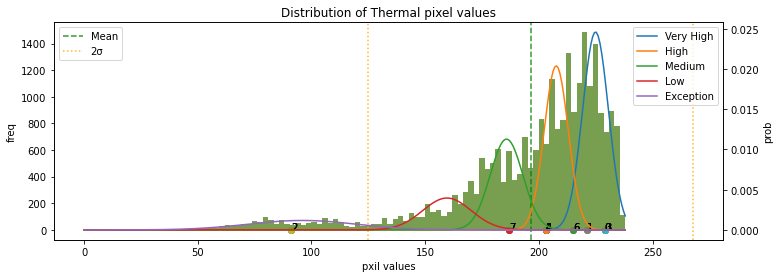

******* end *******
******* start *******
175.jpg
15 1
Module type1: Normal


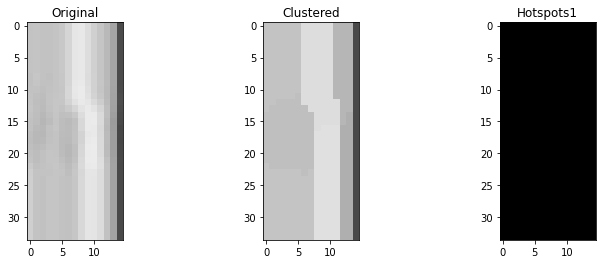

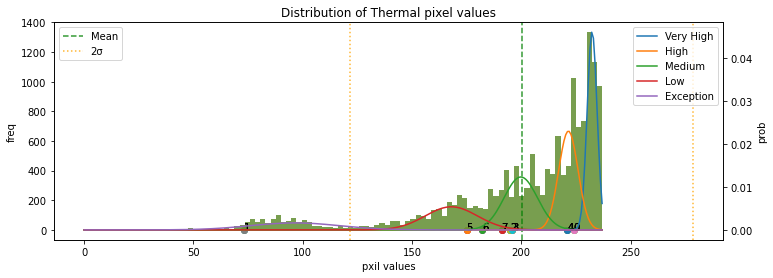

******* end *******
******* start *******
161.jpg
16 2
Module type1: Normal


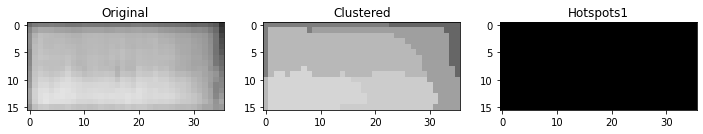

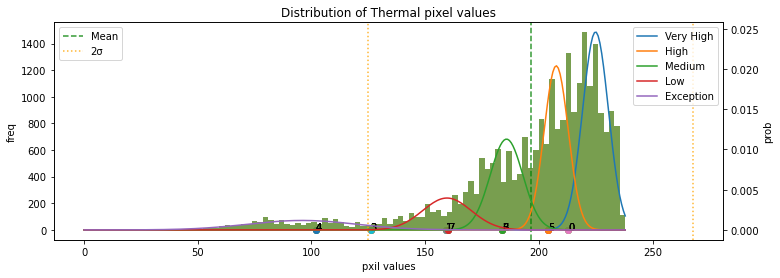

******* end *******
******* start *******
203.jpg
17 1
Module type1: Cluster-Anomaly


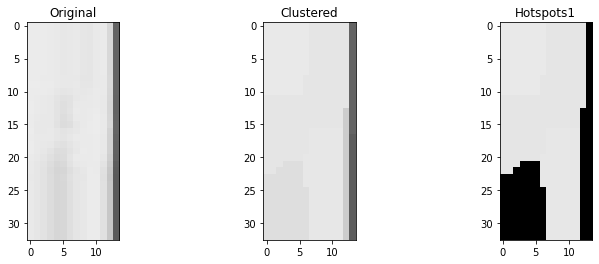

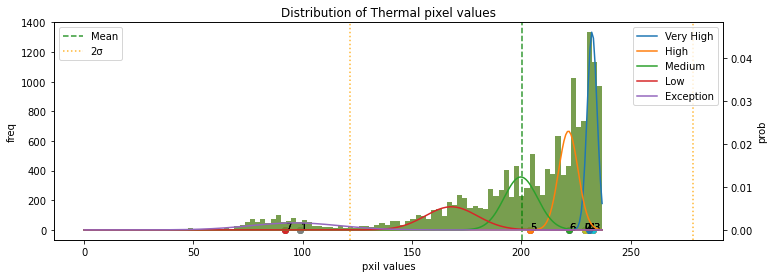

******* end *******
******* start *******
202.jpg
18 1
Module type1: Multi-Hotspots


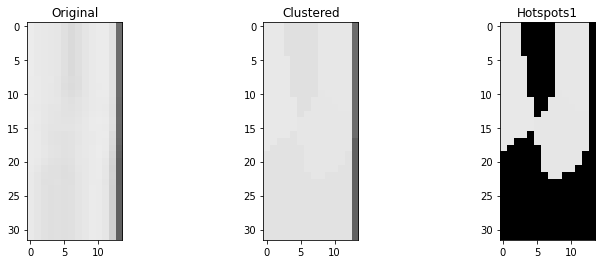

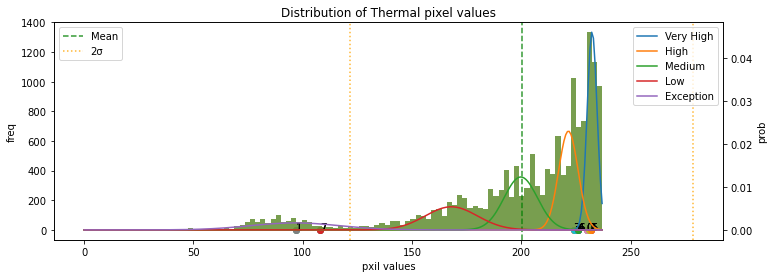

******* end *******
******* start *******
160.jpg
19 2
Module type1: Single-Hotspot


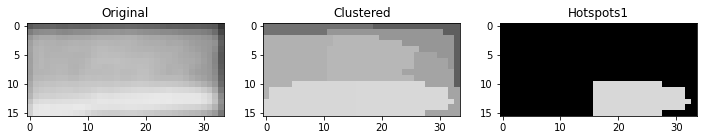

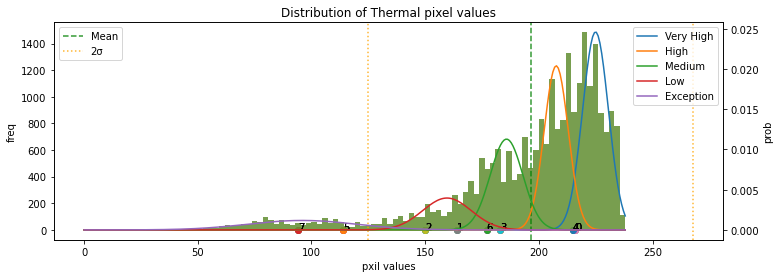

******* end *******
******* start *******
148.jpg
20 2
Module type1: Cluster-Anomaly


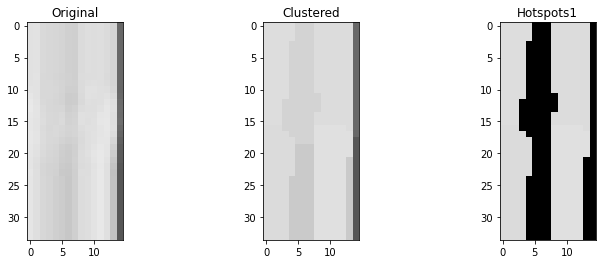

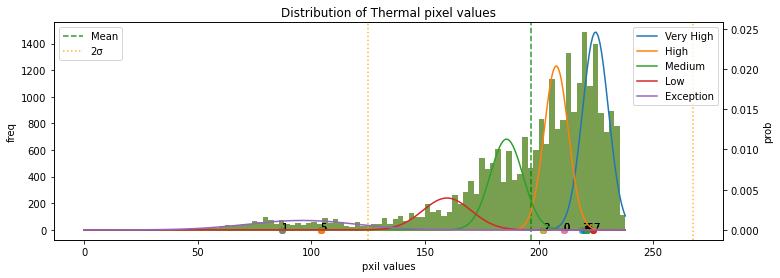

******* end *******
******* start *******
49.jpg
21 0
Module type1: Cluster-Anomaly


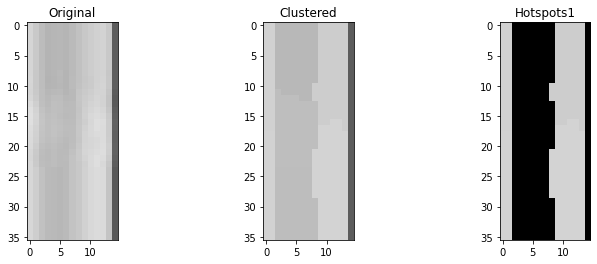

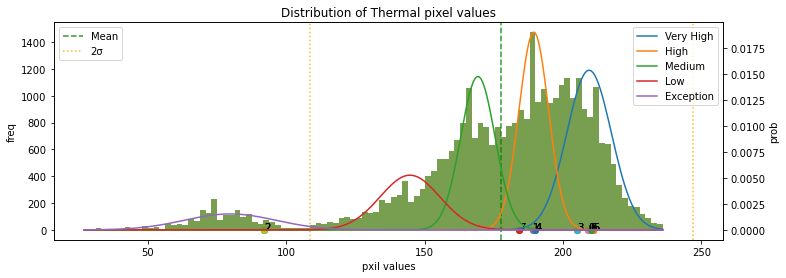

******* end *******
******* start *******
61.jpg
22 0
Module type1: Normal


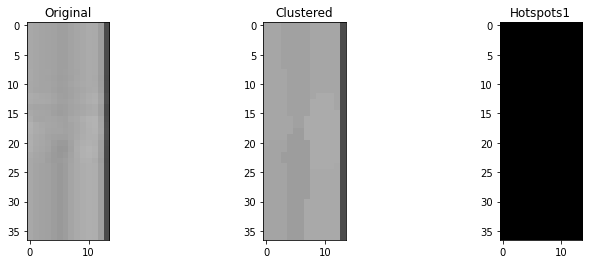

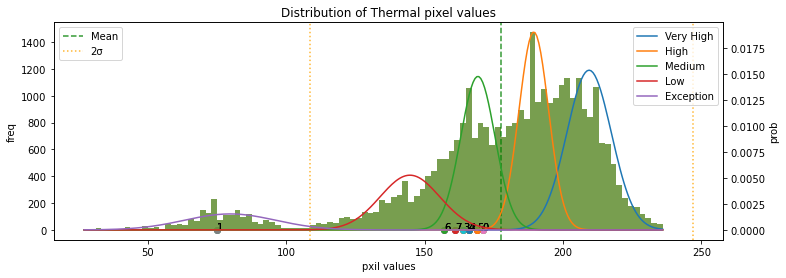

******* end *******
******* start *******
75.jpg
23 0
Module type1: Normal


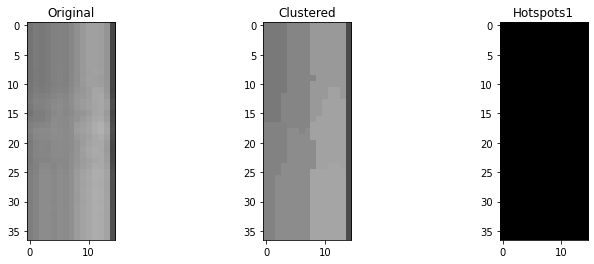

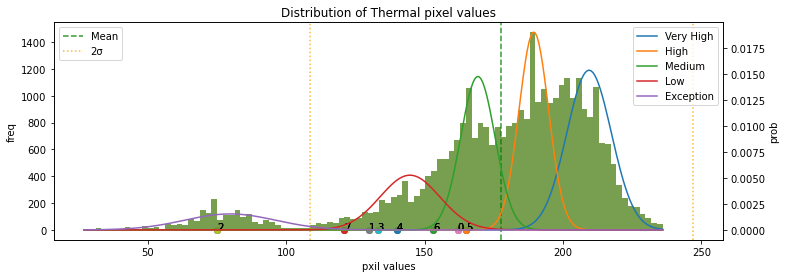

******* end *******
******* start *******
59.jpg
24 0
Module type1: Cluster-Anomaly


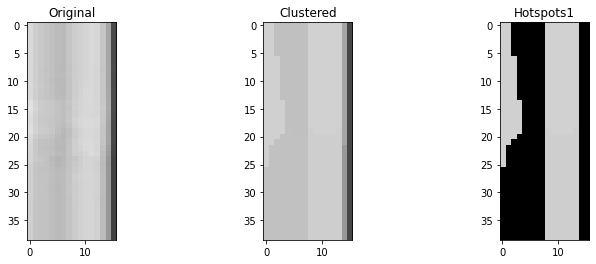

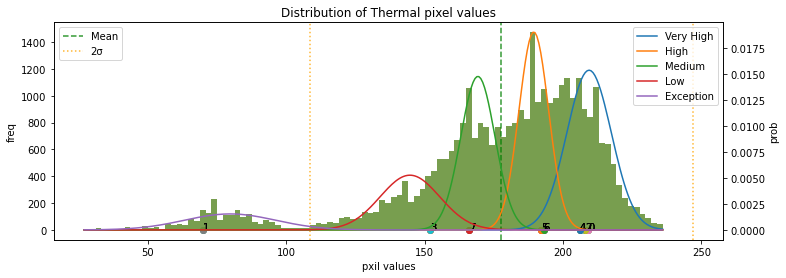

******* end *******
******* start *******
71.jpg
25 0
Module type1: Cluster-Anomaly


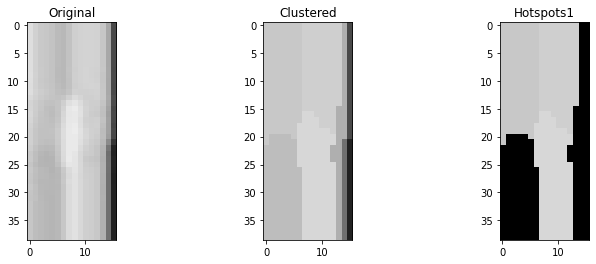

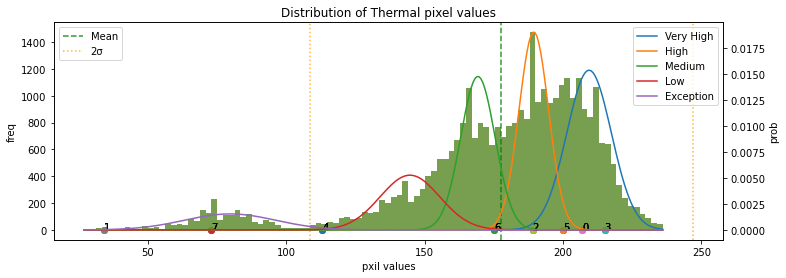

******* end *******
******* start *******
65.jpg
26 0
Module type1: Normal


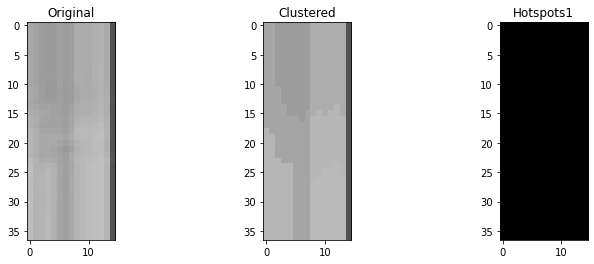

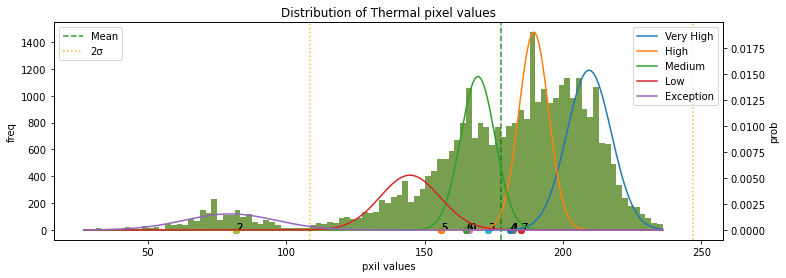

******* end *******
******* start *******
158.jpg
27 2
Module type1: Normal


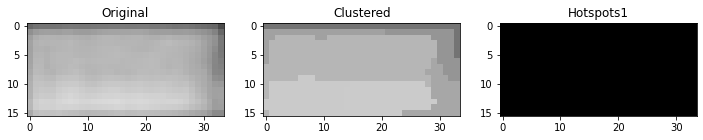

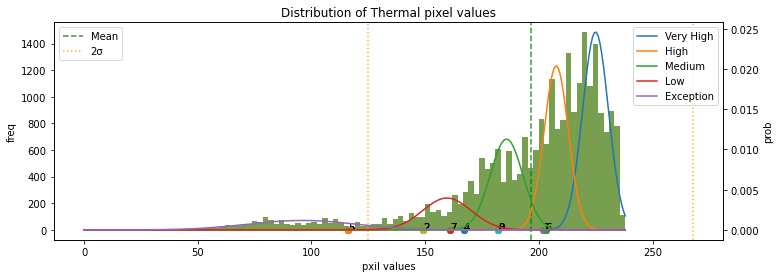

******* end *******
******* start *******
206.jpg
28 1
Module type1: Normal


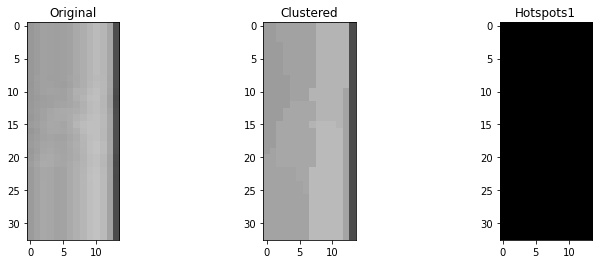

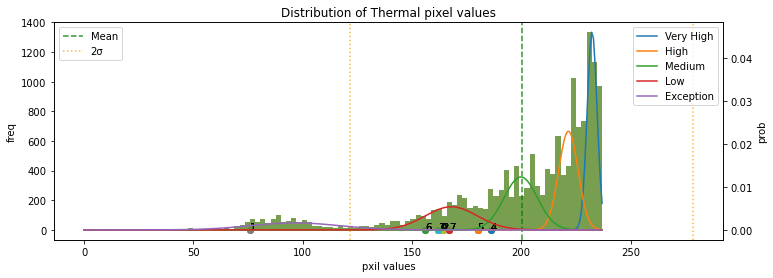

******* end *******
******* start *******
212.jpg
29 1
Module type1: Single-Hotspot


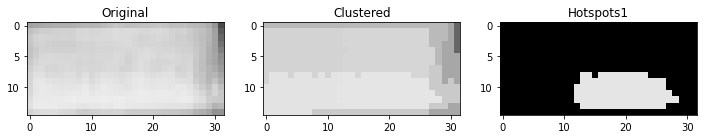

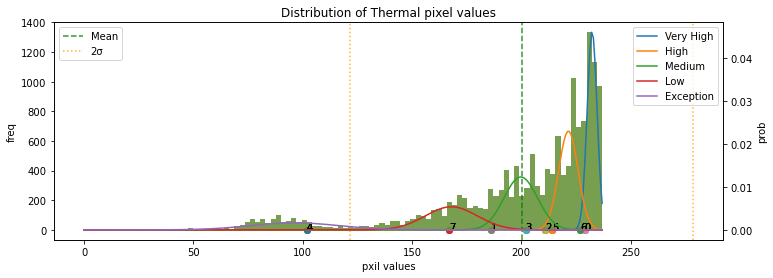

******* end *******
******* start *******
207.jpg
30 1
Module type1: Normal


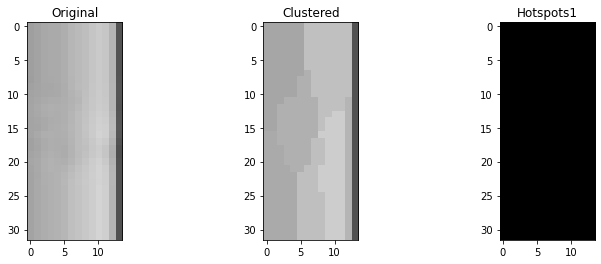

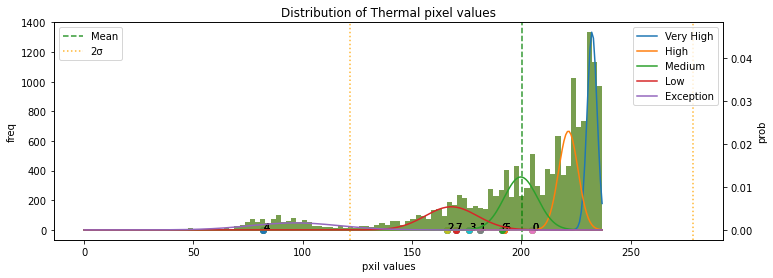

******* end *******
******* start *******
159.jpg
31 2
Module type1: Normal


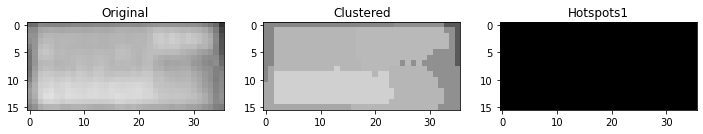

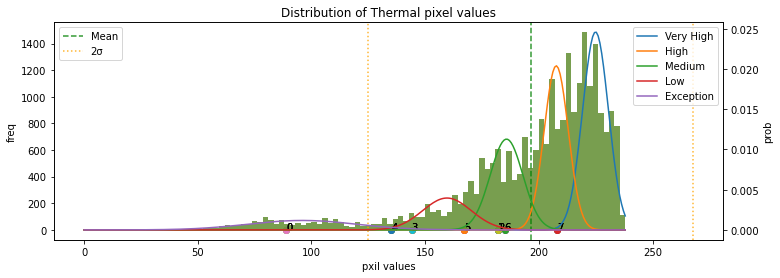

******* end *******
******* start *******
64.jpg
32 0
Module type1: Normal


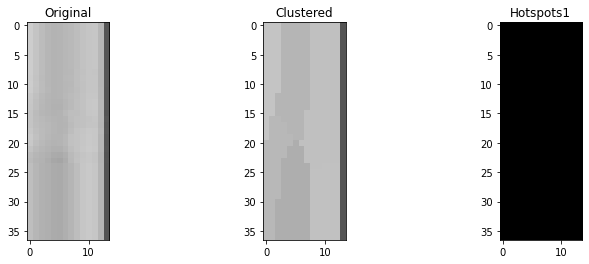

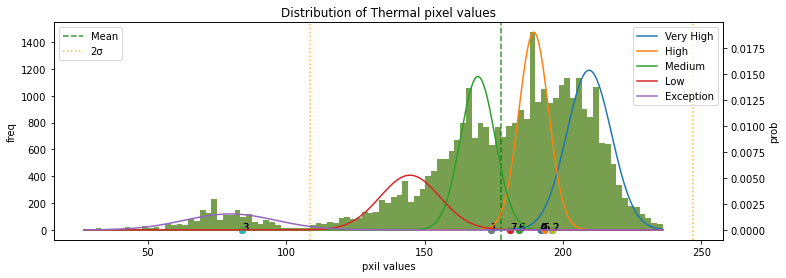

******* end *******
******* start *******
70.jpg
33 0
Module type1: Cluster-Anomaly


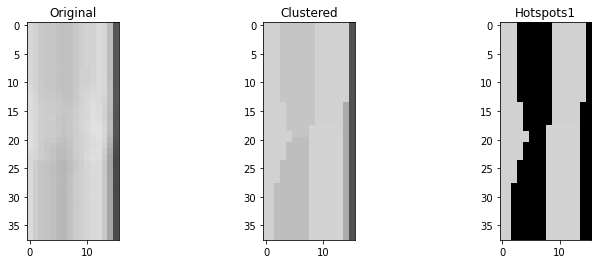

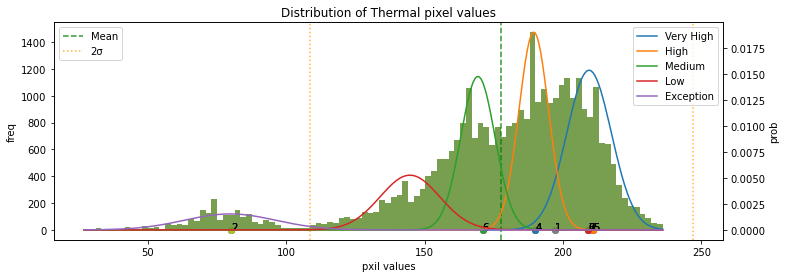

******* end *******
******* start *******
58.jpg
34 0
Module type1: Cluster-Anomaly


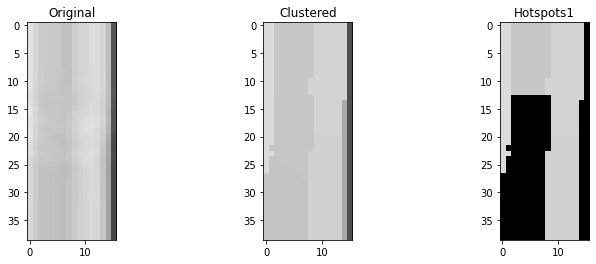

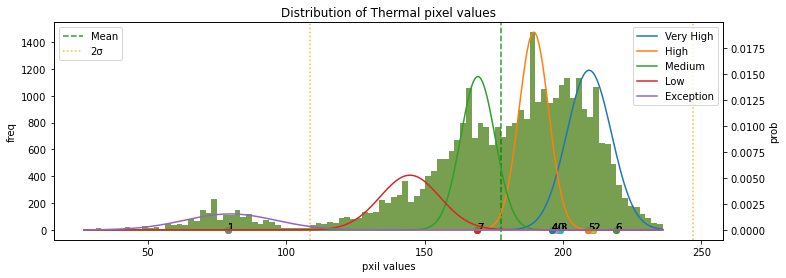

******* end *******
******* start *******
8.jpg
35 -1
Module type1: Cluster-Anomaly


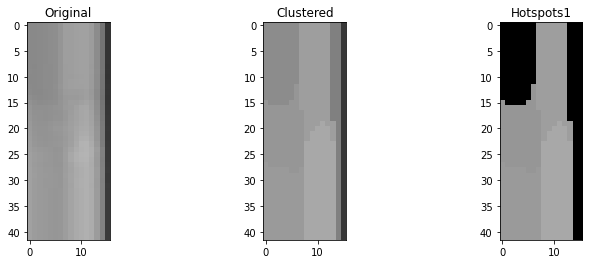

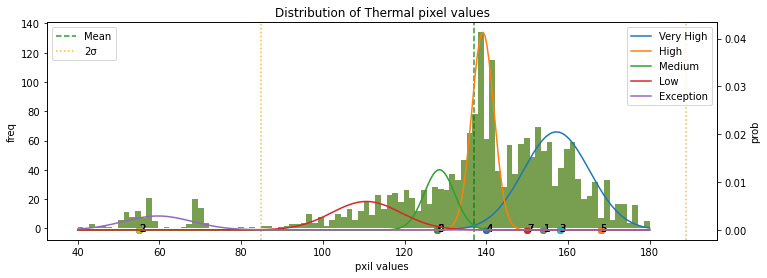

******* end *******
******* start *******
198.jpg
36 1
Module type1: Normal


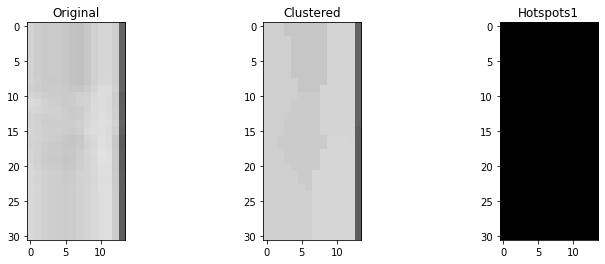

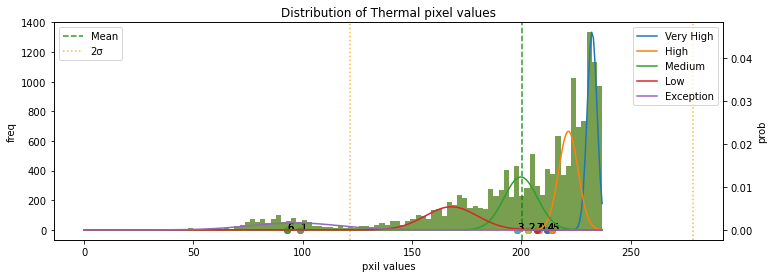

******* end *******
******* start *******
66.jpg
37 0
Module type1: Single-Hotspot


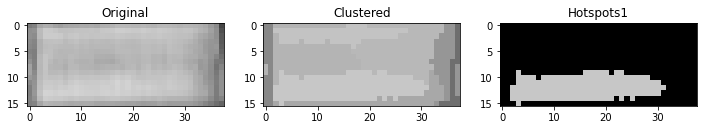

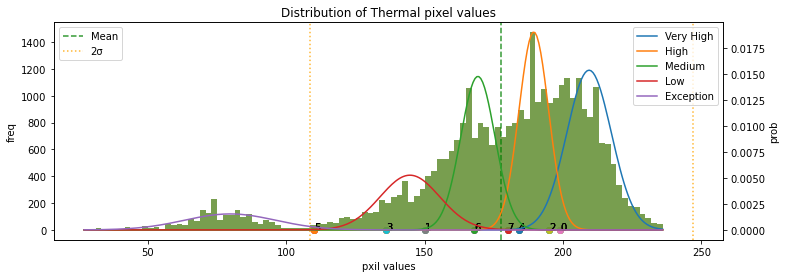

******* end *******
******* start *******
72.jpg
38 0
Module type1: Single-Hotspot


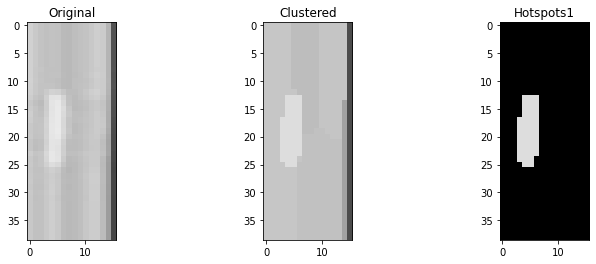

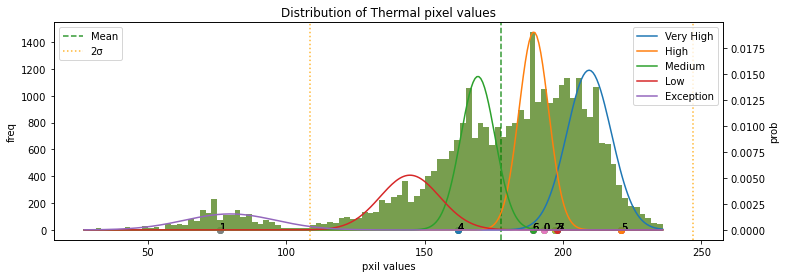

******* end *******
******* start *******
211.jpg
39 1
Module type1: Normal


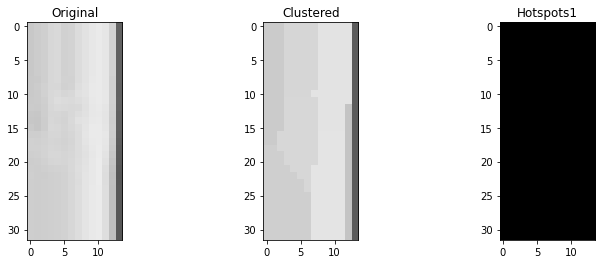

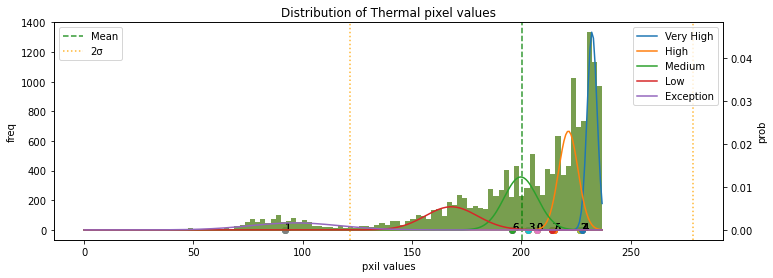

******* end *******
******* start *******
205.jpg
40 1
Module type1: Normal


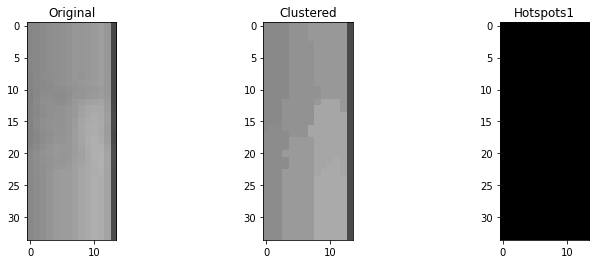

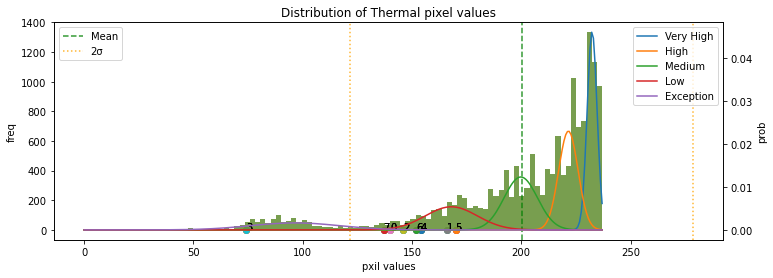

******* end *******
******* start *******
204.jpg
41 1
Module type1: Normal


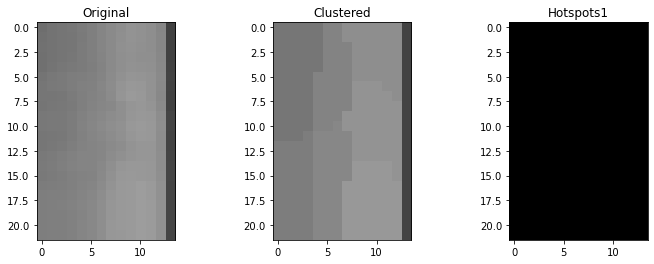

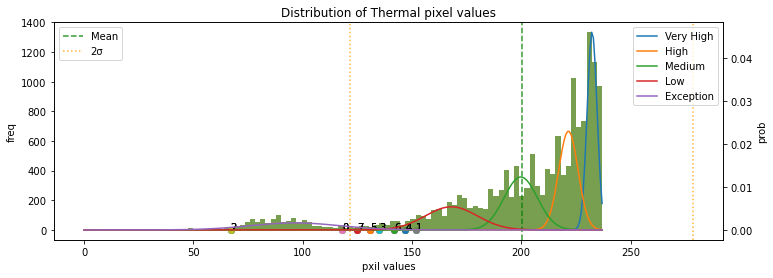

******* end *******
******* start *******
210.jpg
42 1
Module type1: Normal


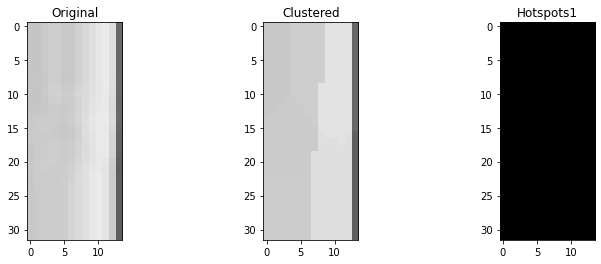

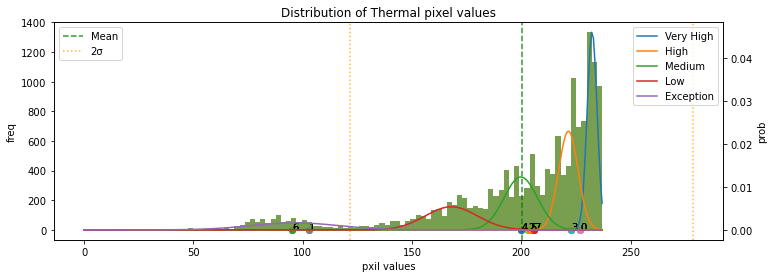

******* end *******
******* start *******
73.jpg
43 0
Module type1: Single-Hotspot


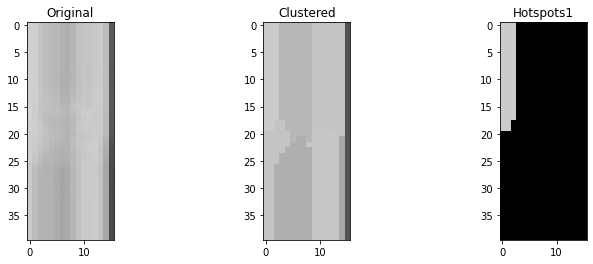

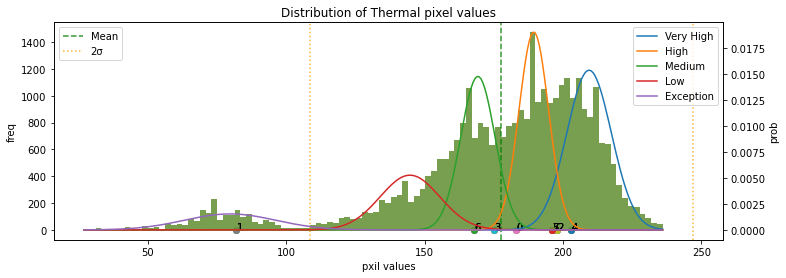

******* end *******
******* start *******
199.jpg
44 1
Module type1: Normal


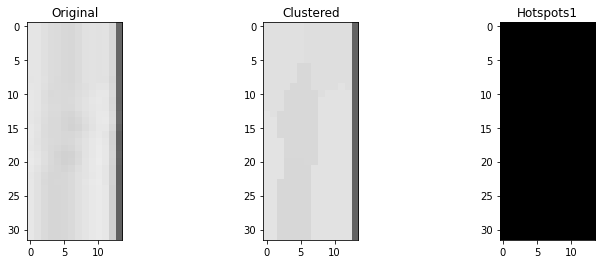

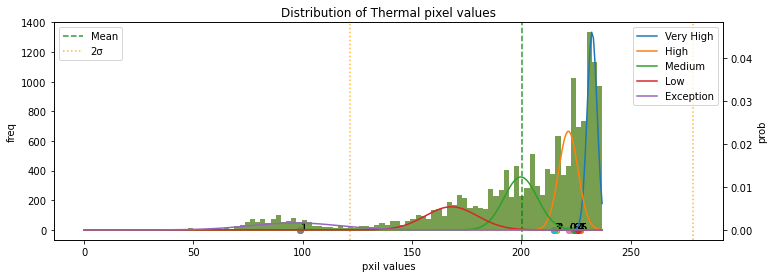

******* end *******
******* start *******
67.jpg
45 0
Module type1: Cluster-Anomaly


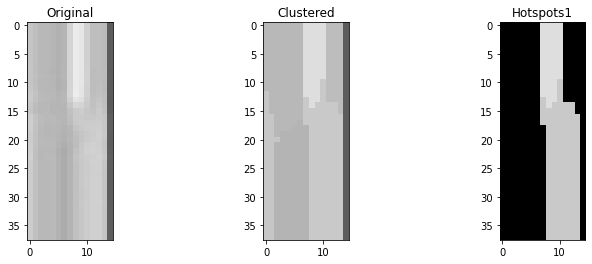

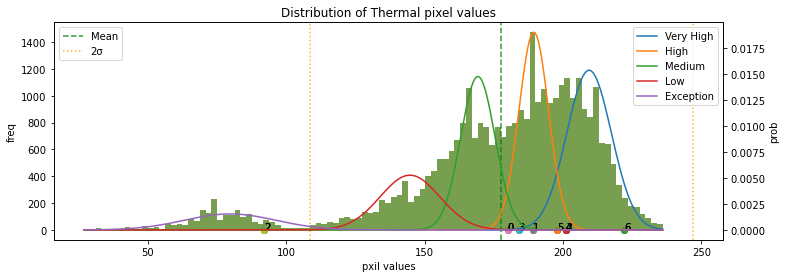

******* end *******
******* start *******
9.jpg
46 -1
Module type1: Single-Hotspot


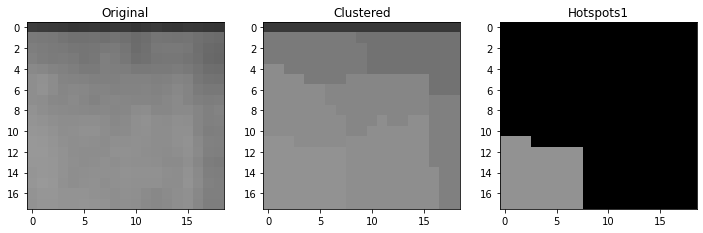

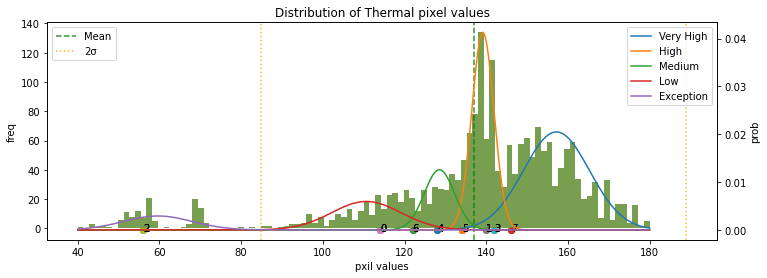

******* end *******
******* start *******
14.jpg
47 3
Module type1: Single-Hotspot


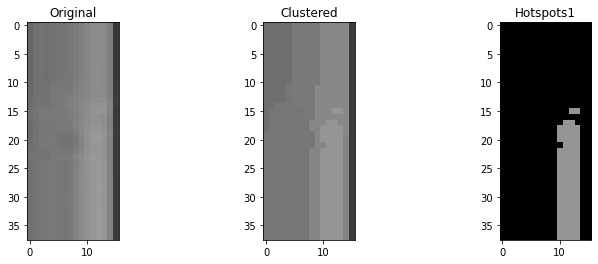

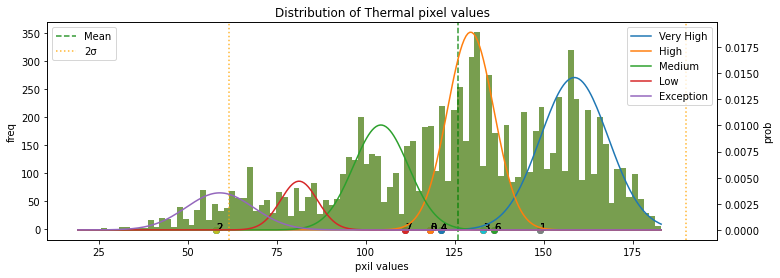

******* end *******
******* start *******
129.jpg
48 2
Module type1: Module-Anomaly


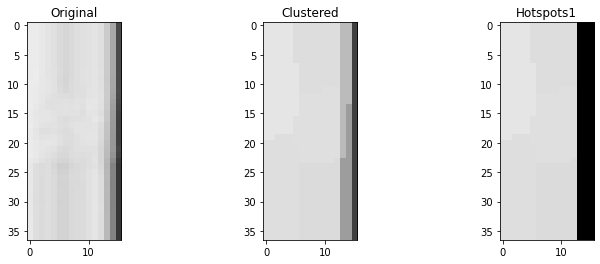

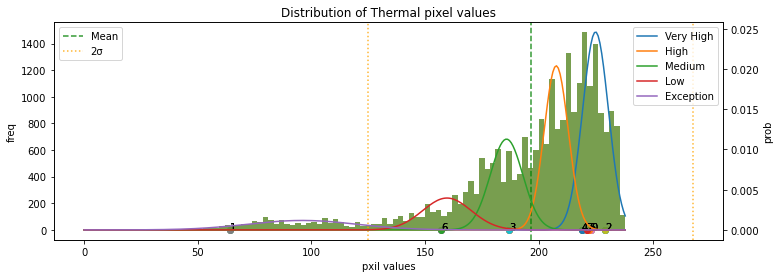

******* end *******
******* start *******
115.jpg
49 2
Module type1: Cluster-Anomaly


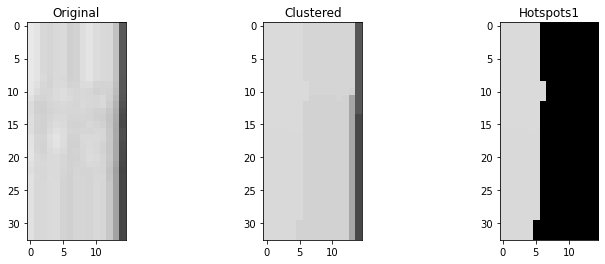

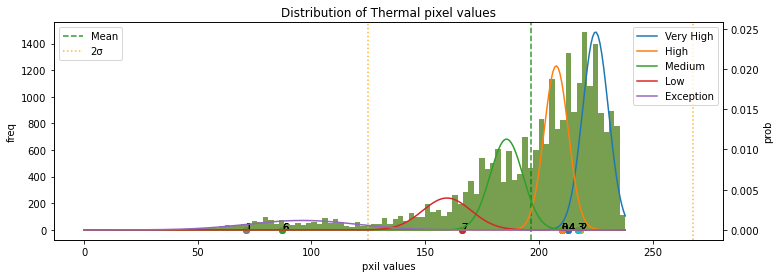

******* end *******
******* start *******
114.jpg
50 2
Module type1: Normal


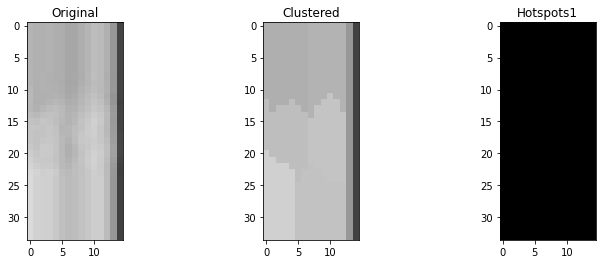

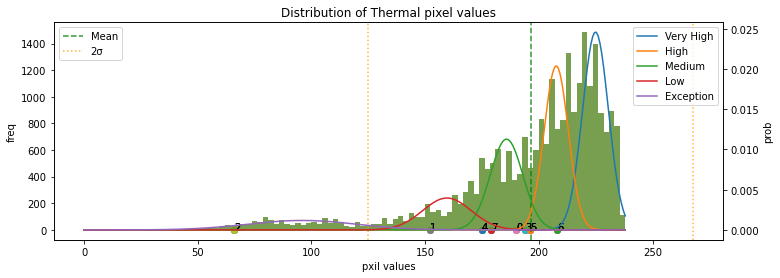

******* end *******
******* start *******
128.jpg
51 2
Module type1: Normal


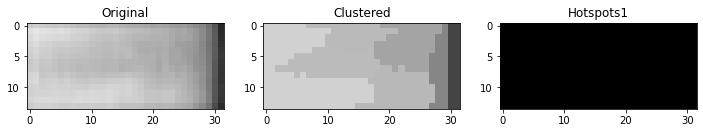

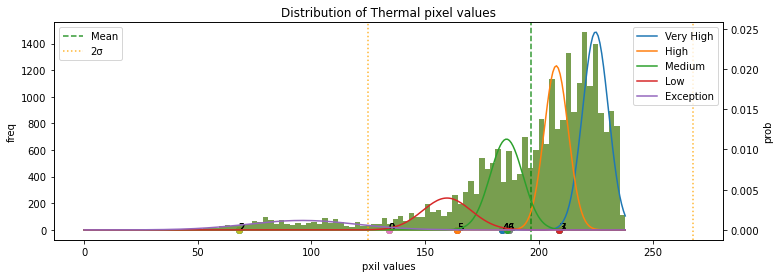

******* end *******
******* start *******
15.jpg
52 3
Module type1: Cluster-Anomaly


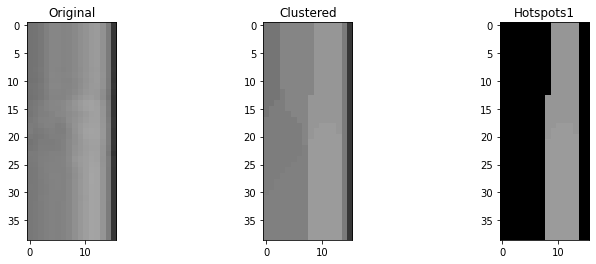

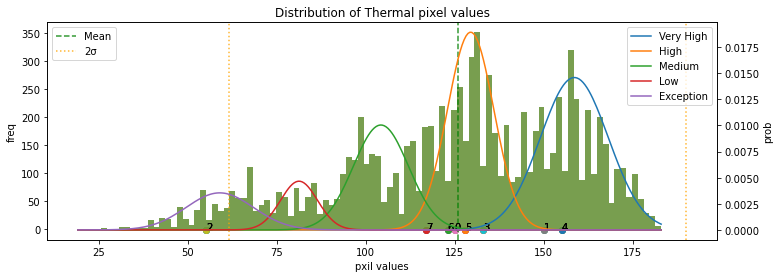

******* end *******
******* start *******
17.jpg
53 3
Module type1: Multi-Hotspots


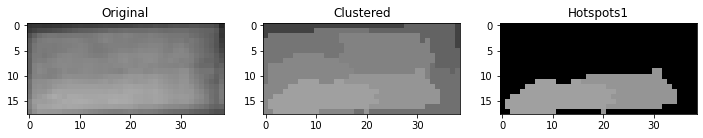

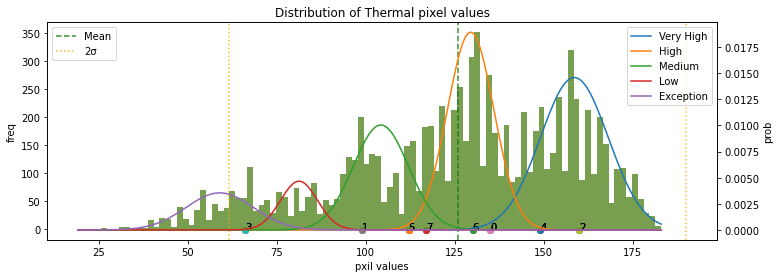

******* end *******
******* start *******
116.jpg
54 2
Module type1: Cluster-Anomaly


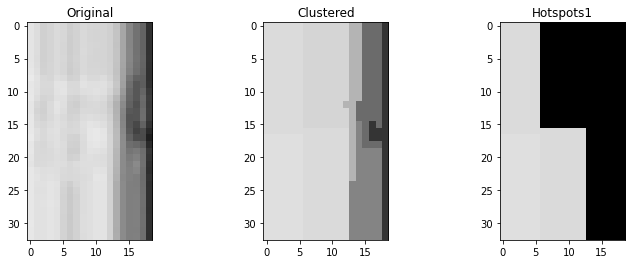

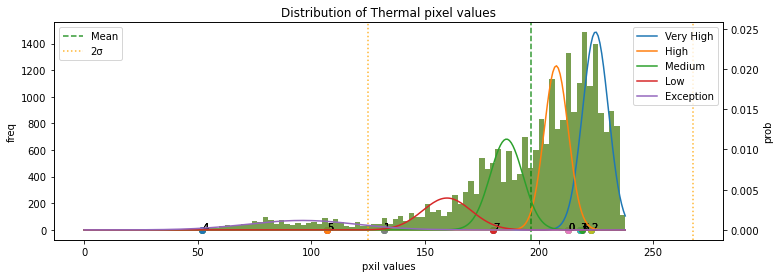

******* end *******
******* start *******
16.jpg
55 3
Module type1: Cluster-Anomaly


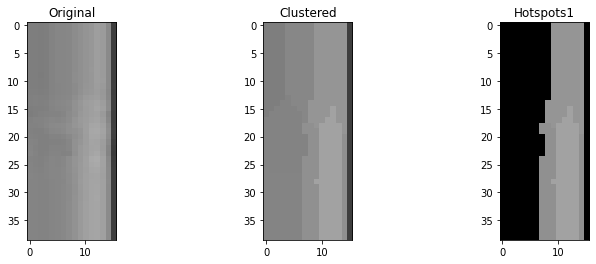

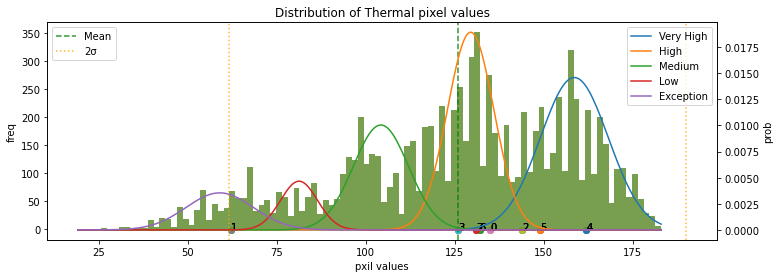

******* end *******
******* start *******
12.jpg
56 3
Module type1: Normal


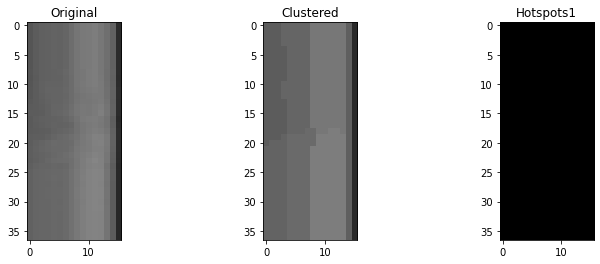

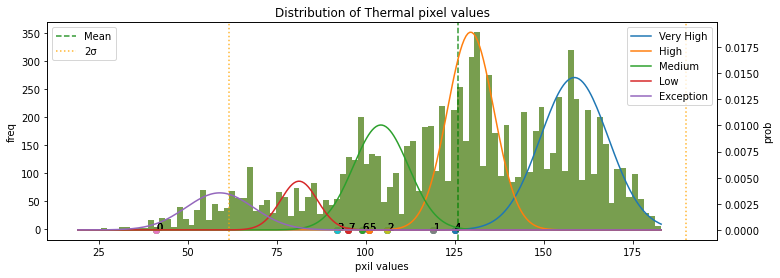

******* end *******
******* start *******
113.jpg
57 2
Module type1: Cluster-Anomaly


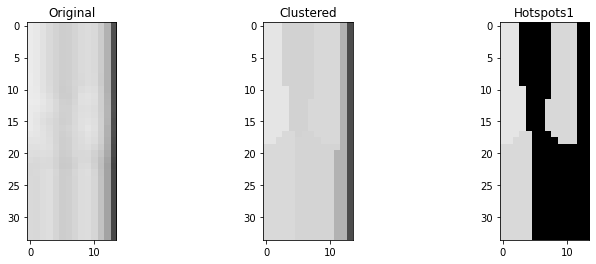

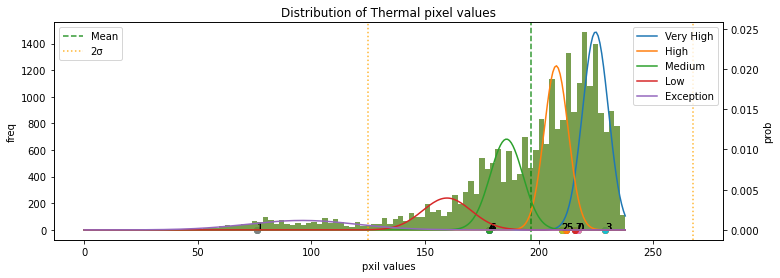

******* end *******
******* start *******
112.jpg
58 2
Module type1: Single-Hotspot


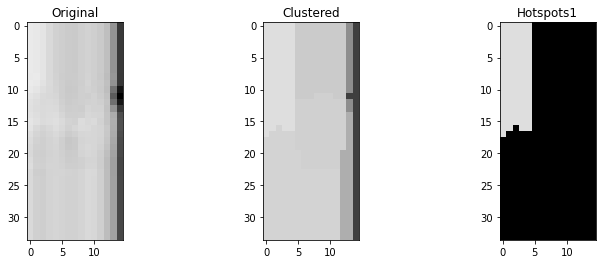

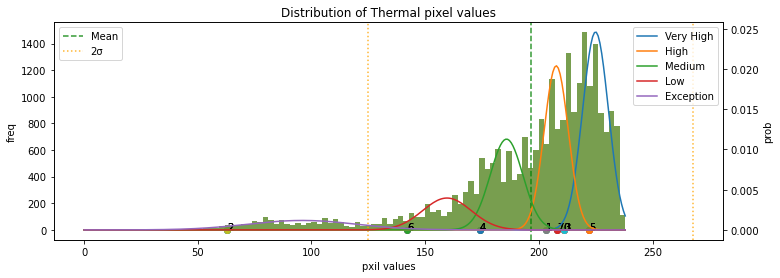

******* end *******
******* start *******
13.jpg
59 3
Module type1: Single-Hotspot


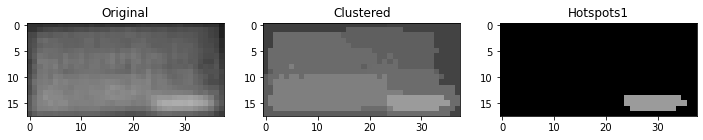

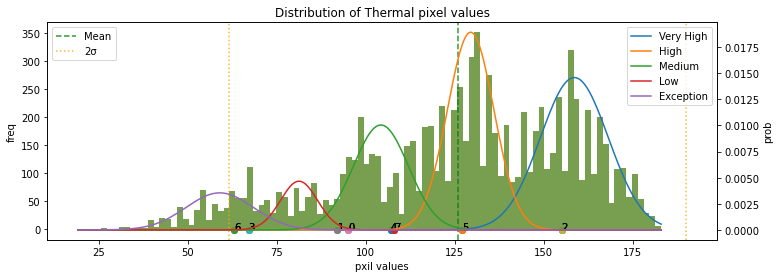

******* end *******
******* start *******
39.jpg
60 0
Module type1: Multi-Hotspots


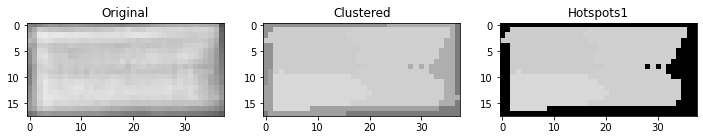

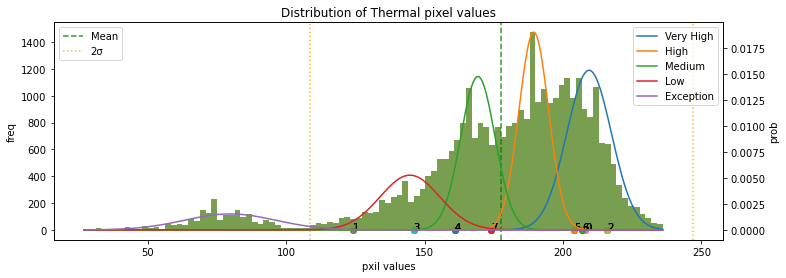

******* end *******
******* start *******
11.jpg
61 3
Module type1: Normal


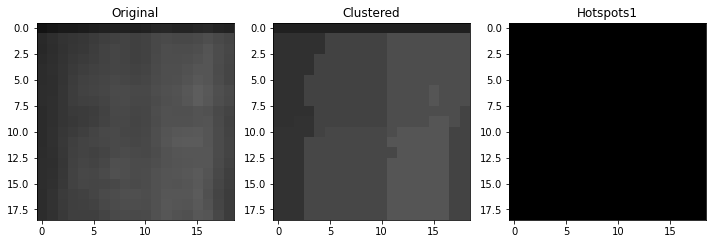

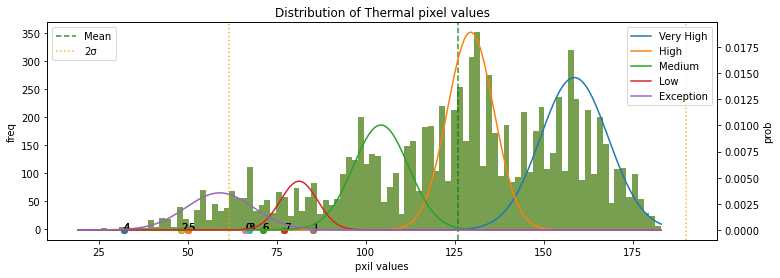

******* end *******
******* start *******
138.jpg
62 2
Module type1: Normal


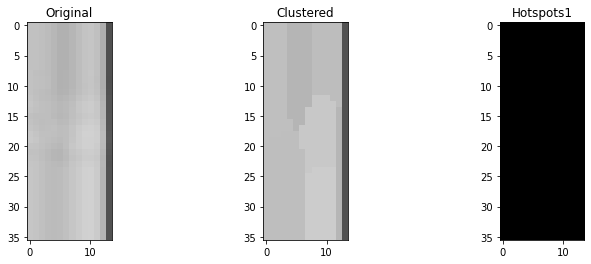

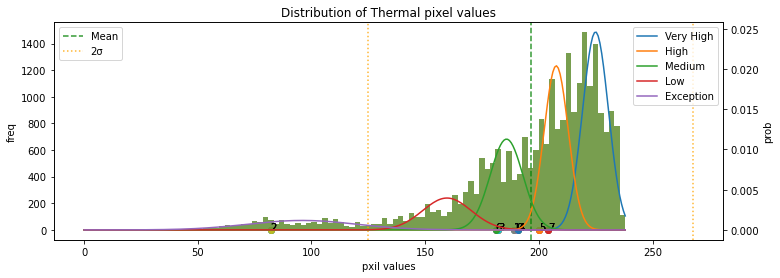

******* end *******
******* start *******
139.jpg
63 2
Module type1: Single-Hotspot


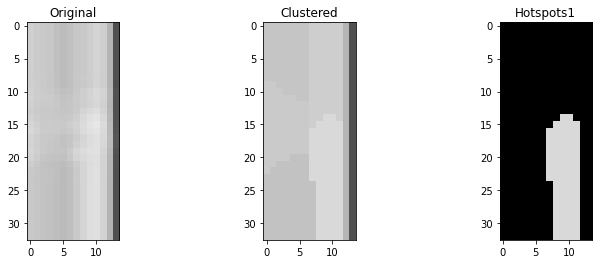

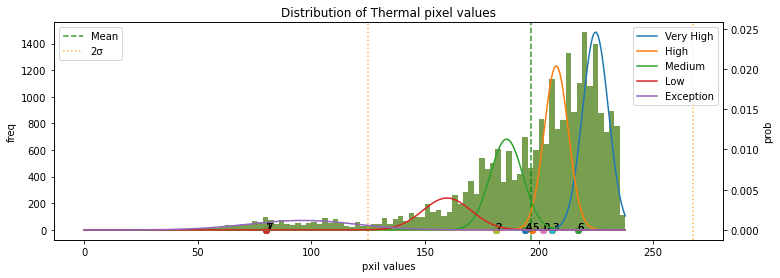

******* end *******
******* start *******
111.jpg
64 2
Module type1: Normal


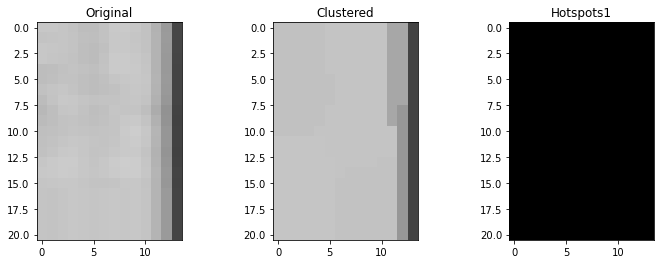

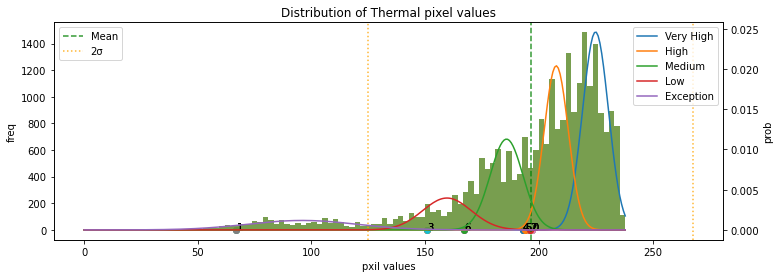

******* end *******
******* start *******
10.jpg
65 3
Module type1: Normal


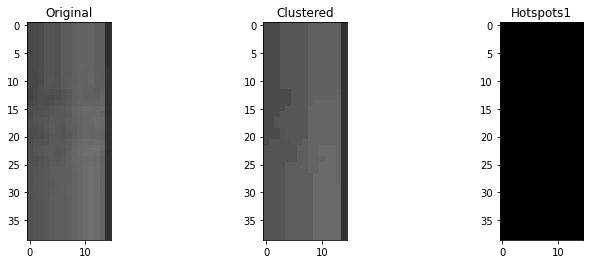

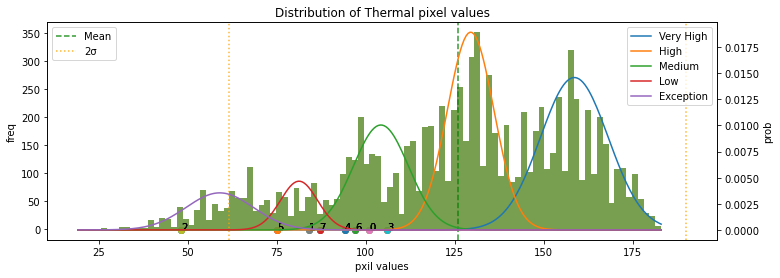

******* end *******
******* start *******
38.jpg
66 0
Module type1: Module-Anomaly


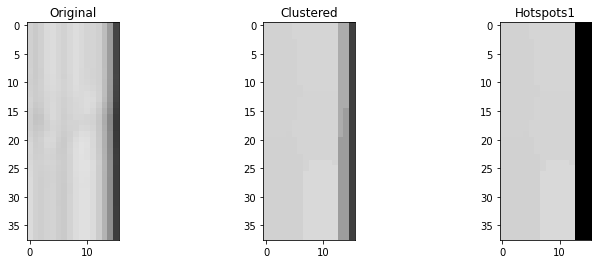

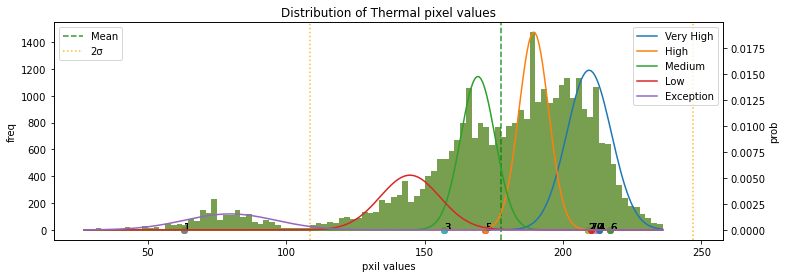

******* end *******
******* start *******
35.jpg
67 0
Module type1: Normal


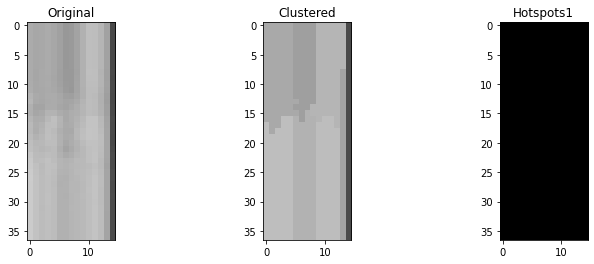

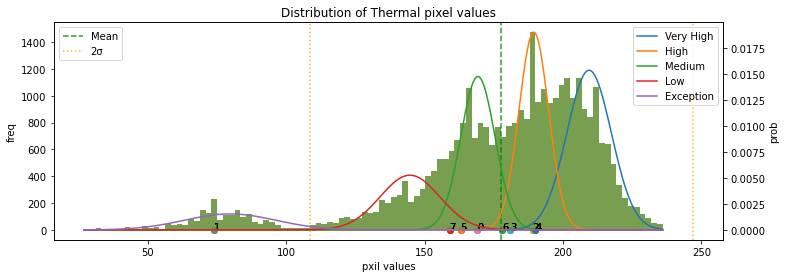

******* end *******
******* start *******
120.jpg
68 2
Module type1: Multi-Hotspots


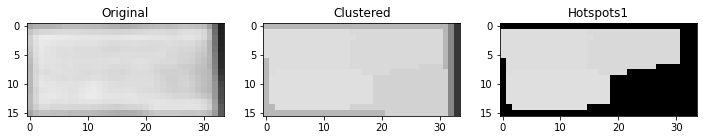

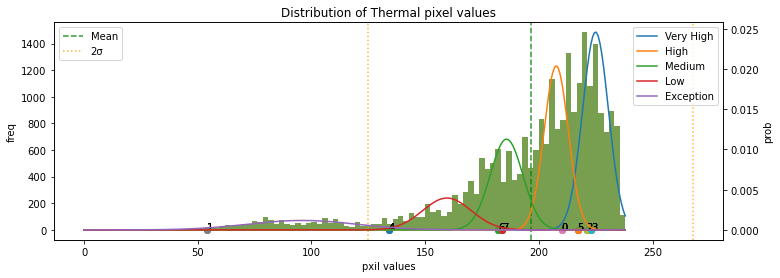

******* end *******
******* start *******
134.jpg
69 2
Module type1: Cluster-Anomaly


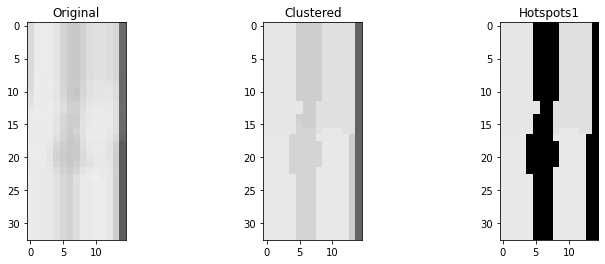

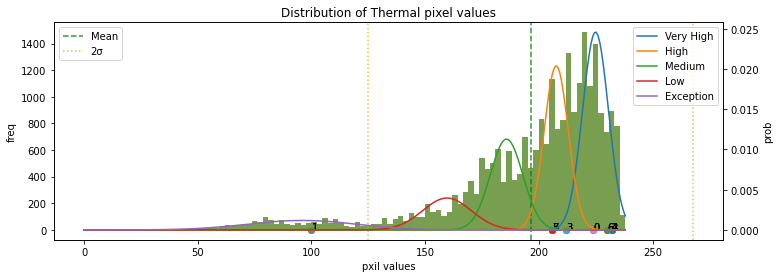

******* end *******
******* start *******
121.jpg
70 2
Module type1: Module-Anomaly


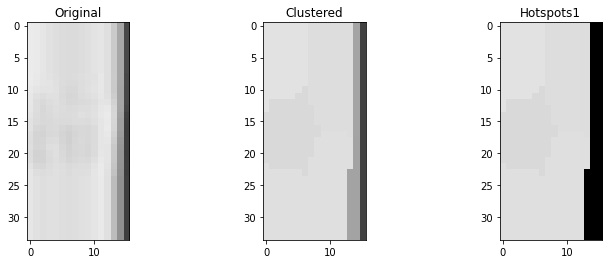

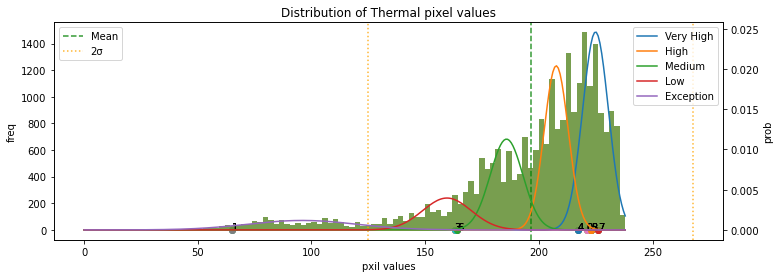

******* end *******
******* start *******
34.jpg
71 0
Module type1: Cluster-Anomaly


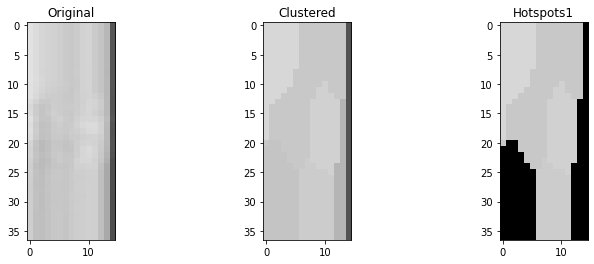

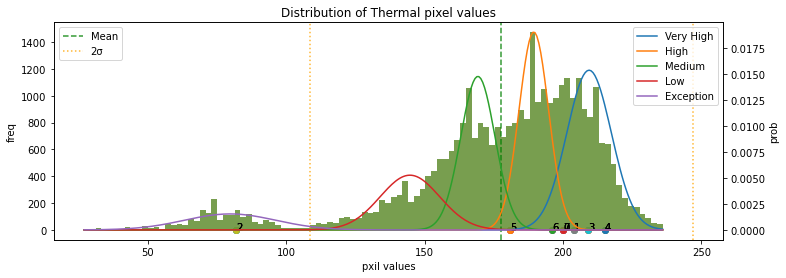

******* end *******
******* start *******
36.jpg
72 0
Module type1: Multi-Hotspots


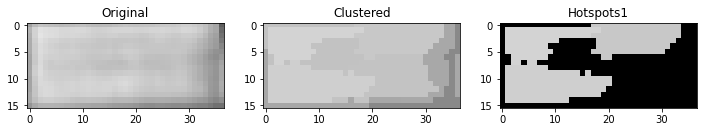

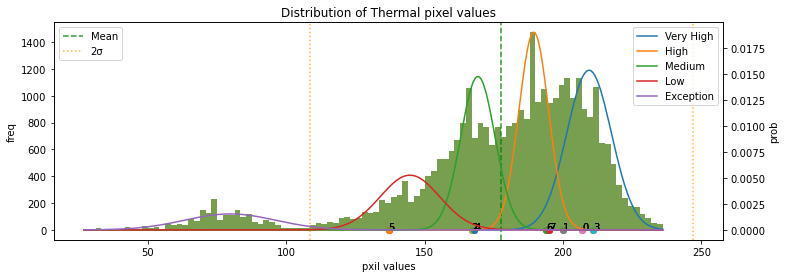

******* end *******
******* start *******
137.jpg
73 2
Module type1: Cluster-Anomaly


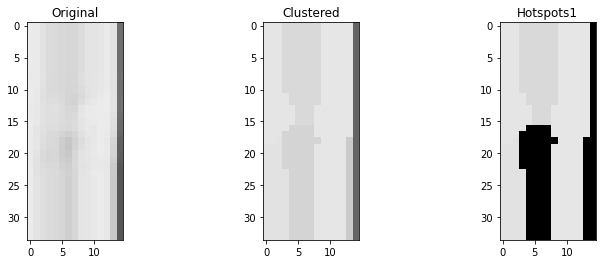

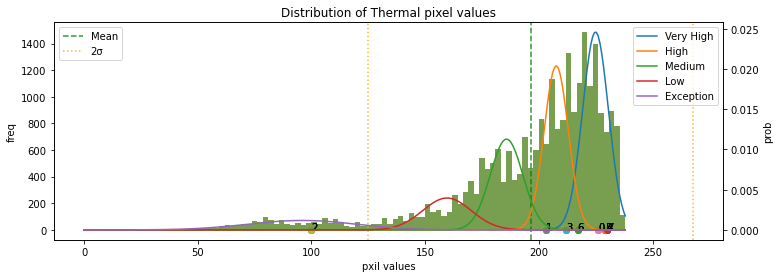

******* end *******
******* start *******
123.jpg
74 2
Module type1: Module-Anomaly


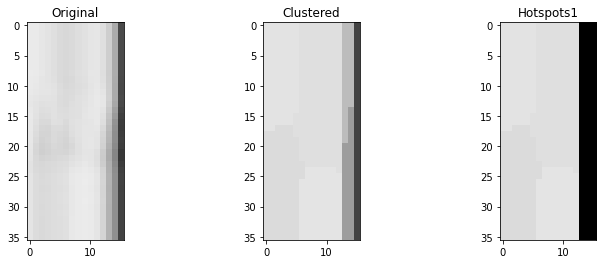

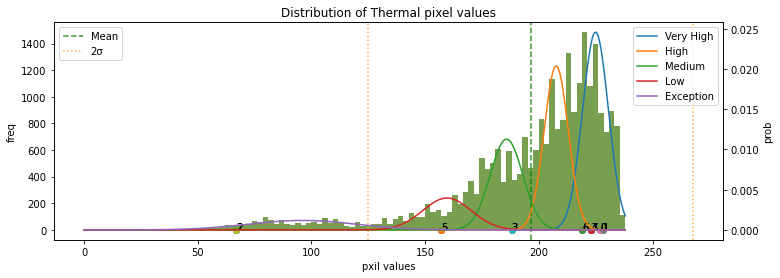

******* end *******
******* start *******
136.jpg
75 2
Module type1: Cluster-Anomaly


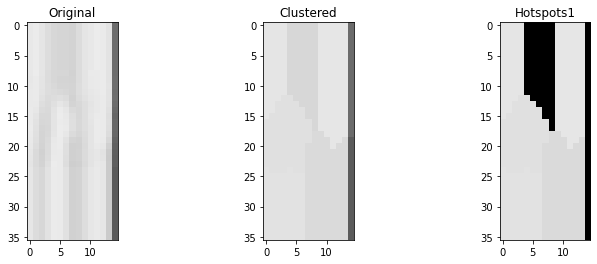

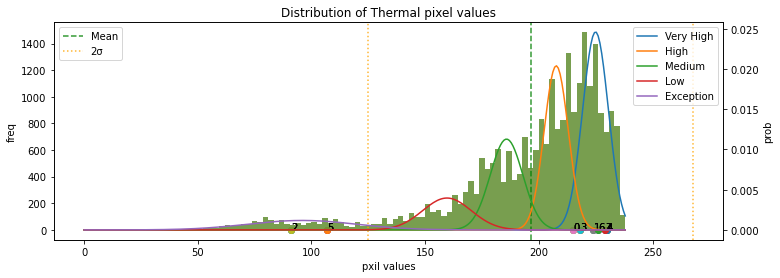

******* end *******
******* start *******
37.jpg
76 0
Module type1: Module-Anomaly


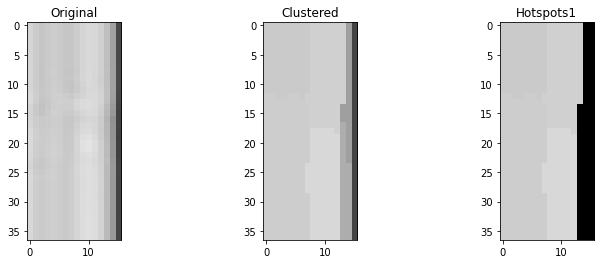

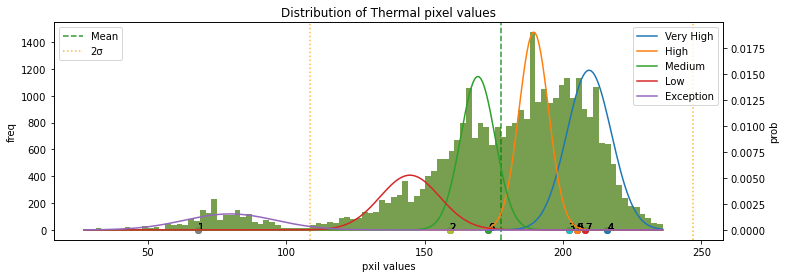

******* end *******
******* start *******
33.jpg
77 0
Module type1: Multi-Hotspots


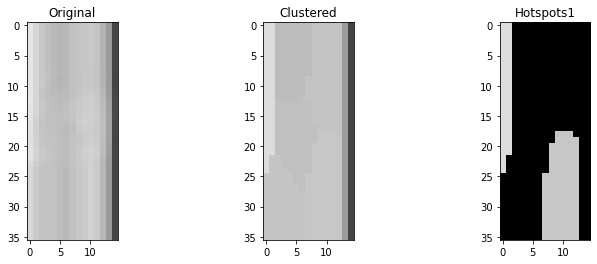

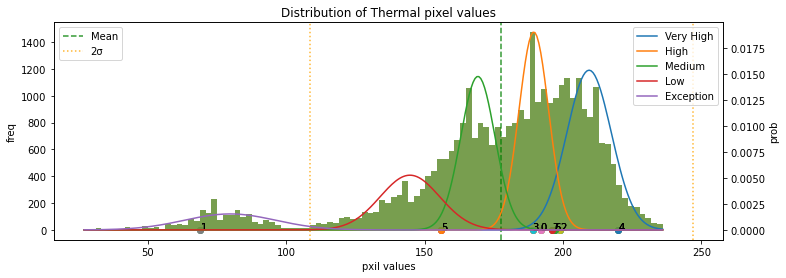

******* end *******
******* start *******
132.jpg
78 2
Module type1: Cluster-Anomaly


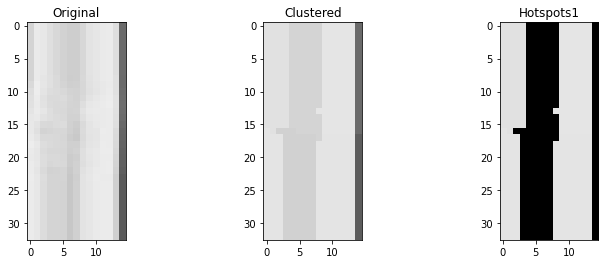

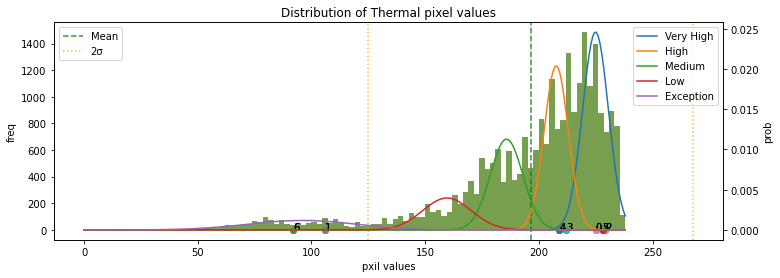

******* end *******
******* start *******
126.jpg
79 2
Module type1: Cluster-Anomaly


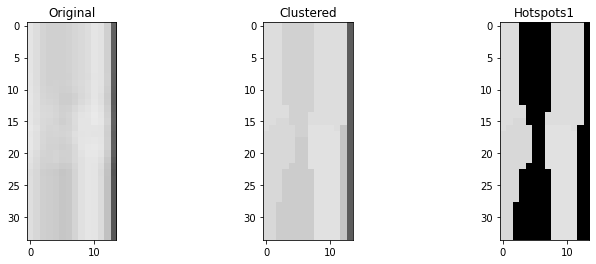

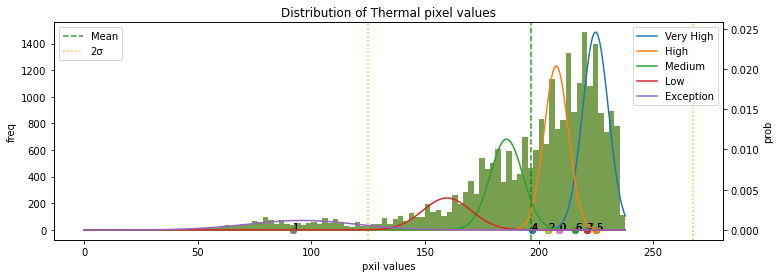

******* end *******
******* start *******
127.jpg
80 2
Module type1: Module-Anomaly


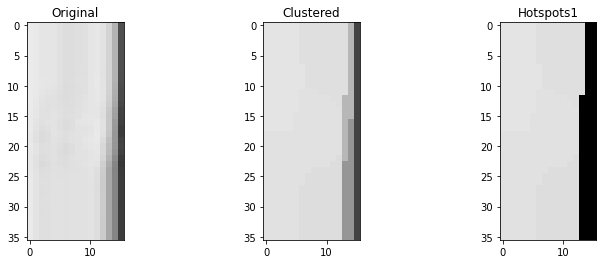

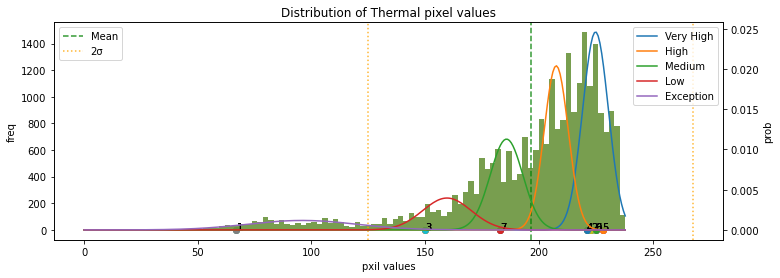

******* end *******
******* start *******
133.jpg
81 2
Module type1: Multi-Hotspots


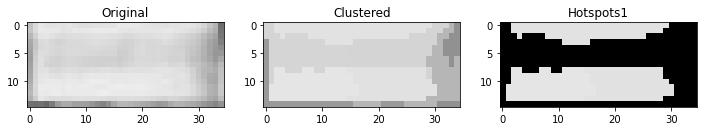

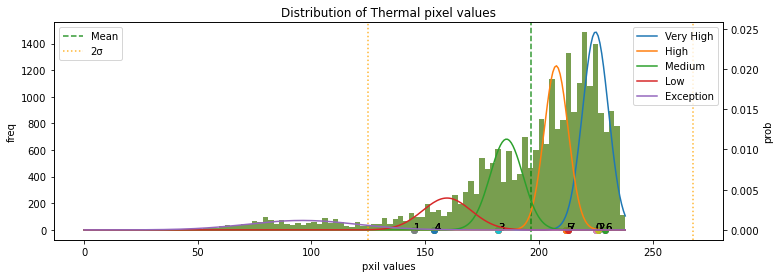

******* end *******
******* start *******
32.jpg
82 0
Module type1: Normal


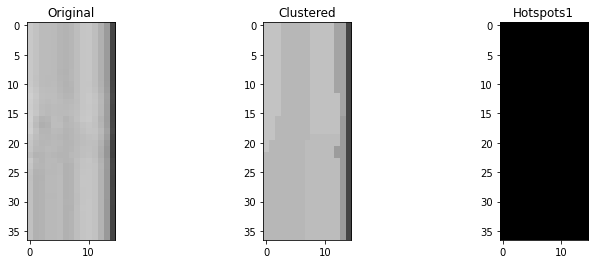

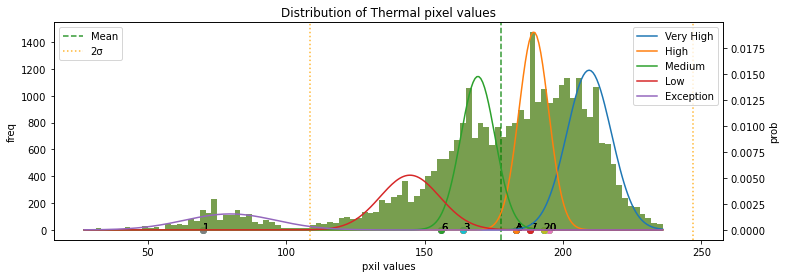

******* end *******
******* start *******
18.jpg
83 -1
Module type1: Cluster-Anomaly


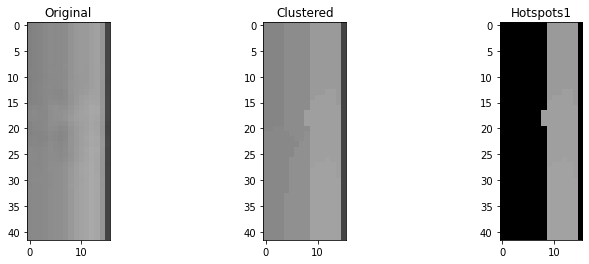

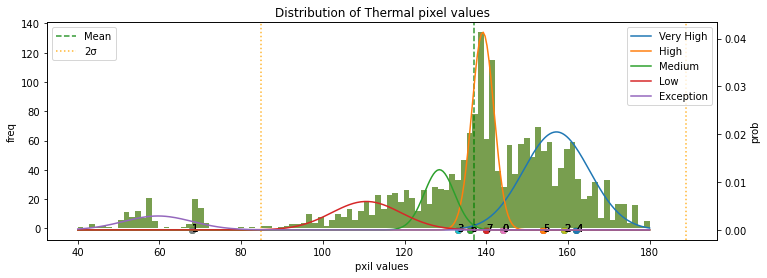

******* end *******
******* start *******
30.jpg
84 0
Module type1: Normal


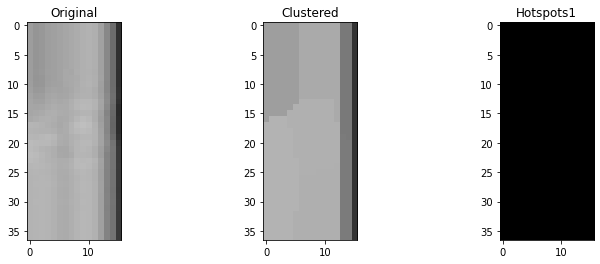

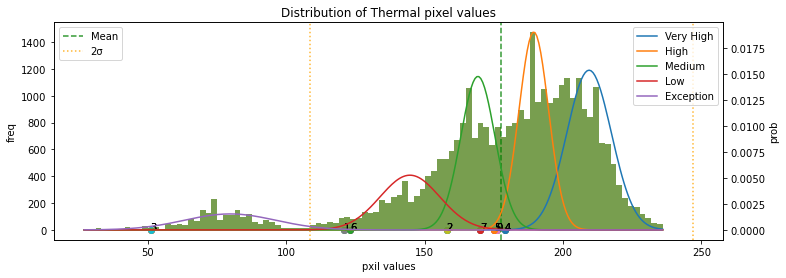

******* end *******
******* start *******
131.jpg
85 2
Module type1: Multi-Hotspots


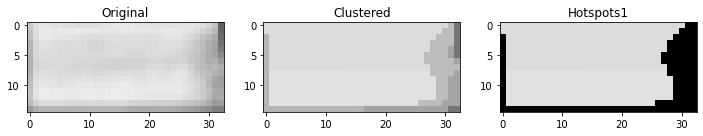

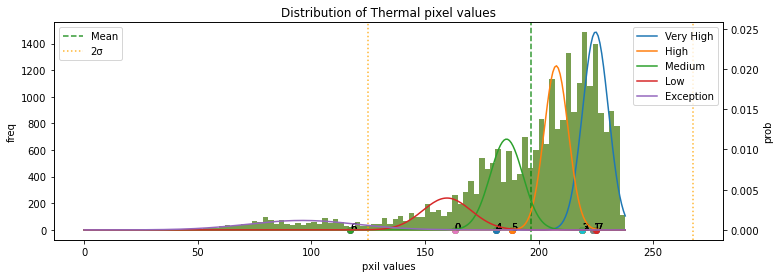

******* end *******
******* start *******
119.jpg
86 2
Module type1: Multi-Hotspots


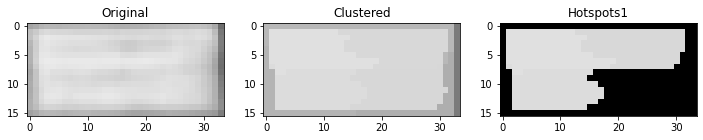

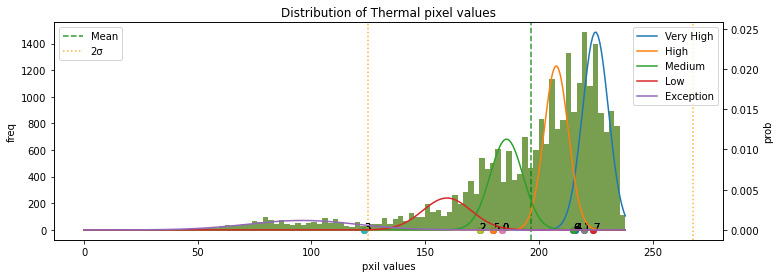

******* end *******
******* start *******
118.jpg
87 2
Module type1: Multi-Hotspots


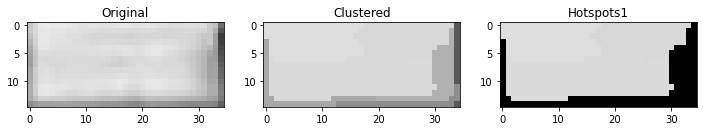

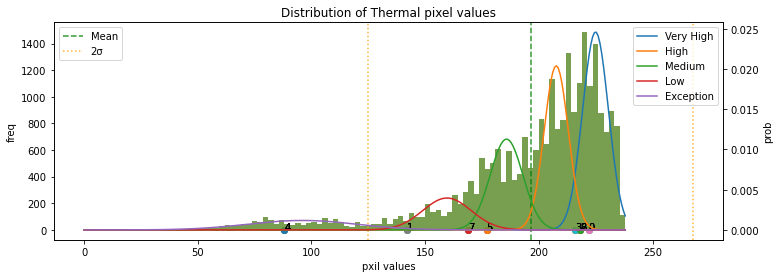

******* end *******
******* start *******
130.jpg
88 2
Module type1: Cluster-Anomaly


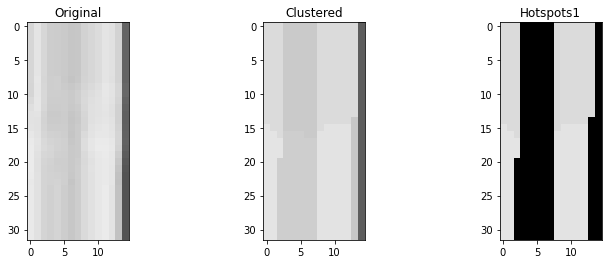

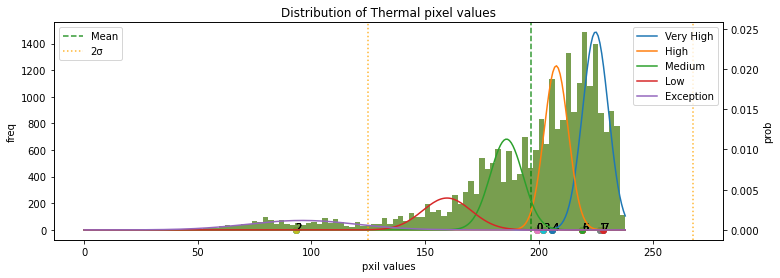

******* end *******
******* start *******
124.jpg
89 2
Module type1: Single-Hotspot


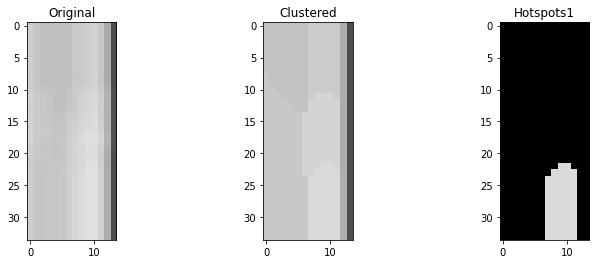

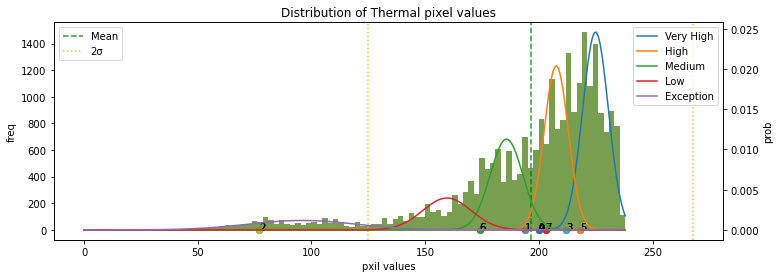

******* end *******
******* start *******
31.jpg
90 0
Module type1: Single-Hotspot


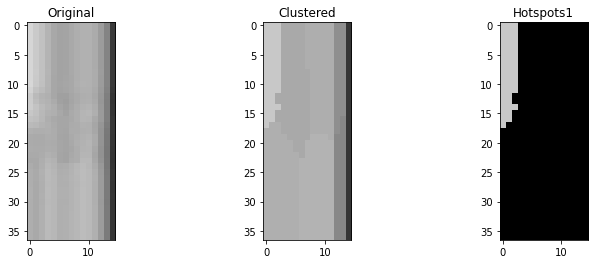

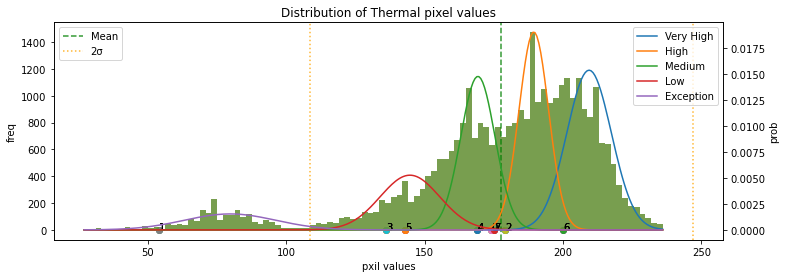

******* end *******
******* start *******
19.jpg
91 -1
Module type1: Normal


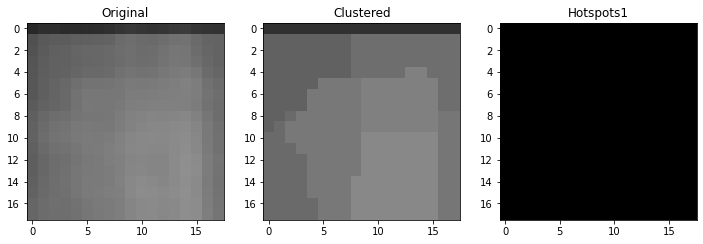

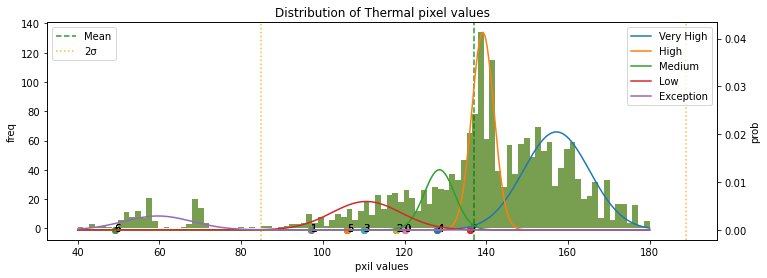

******* end *******
******* start *******
42.jpg
92 0
Module type1: Module-Anomaly


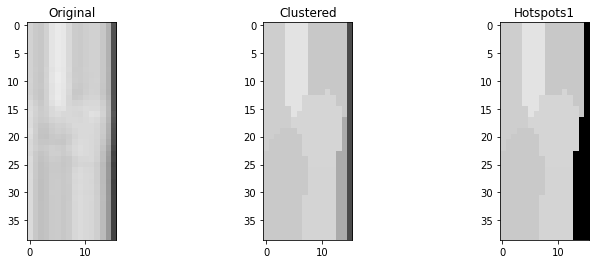

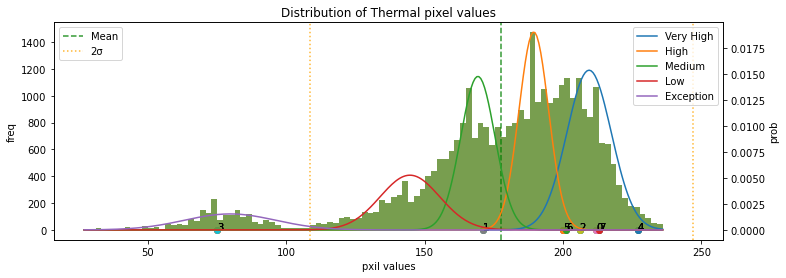

******* end *******
******* start *******
4.jpg
93 3
Module type1: Module-Anomaly


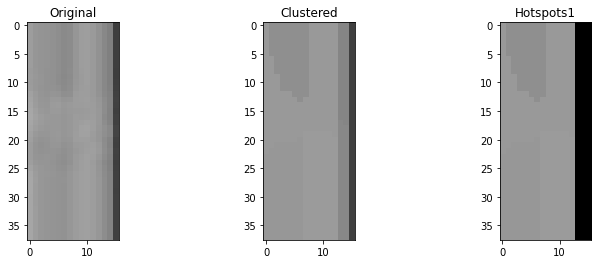

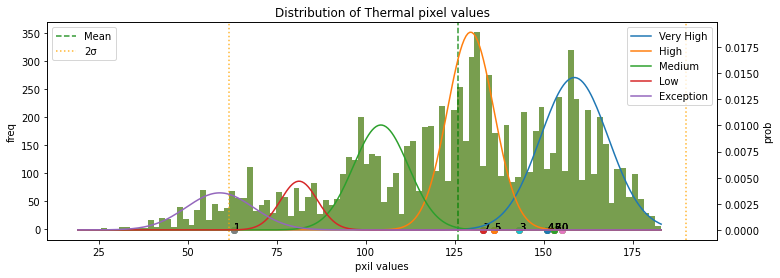

******* end *******
******* start *******
56.jpg
94 0
Module type1: Module-Anomaly


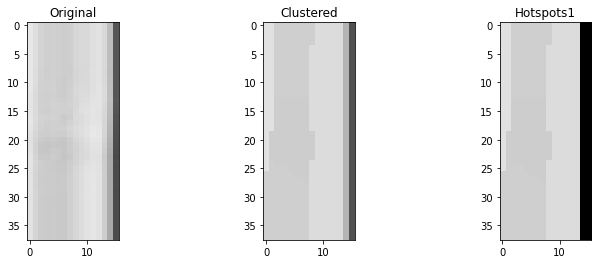

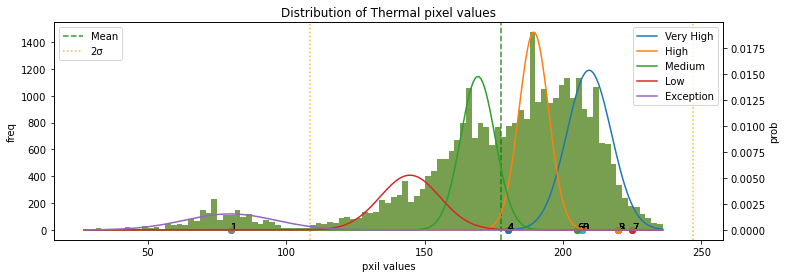

******* end *******
******* start *******
180.jpg
95 1
Module type1: Multi-Hotspots


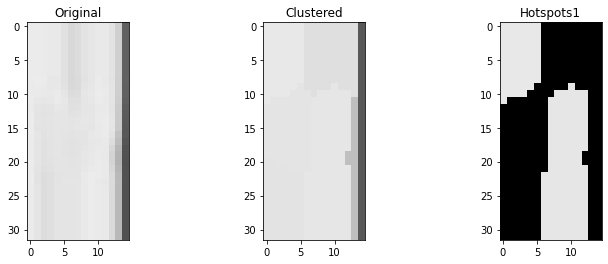

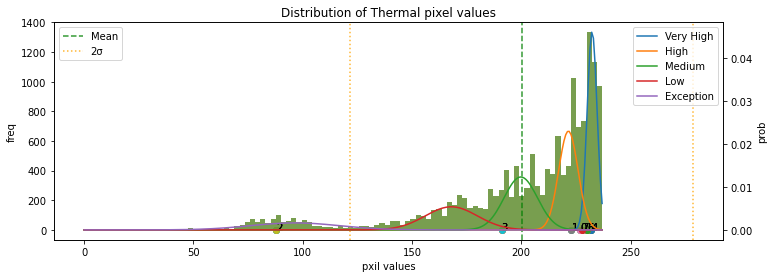

******* end *******
******* start *******
81.jpg
96 0
Module type1: Normal


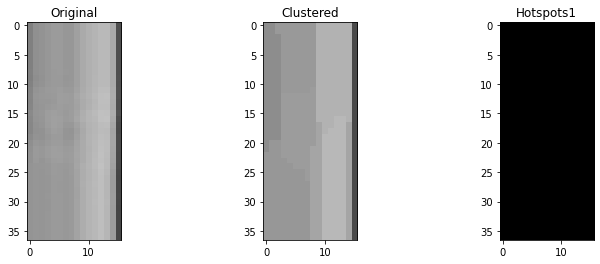

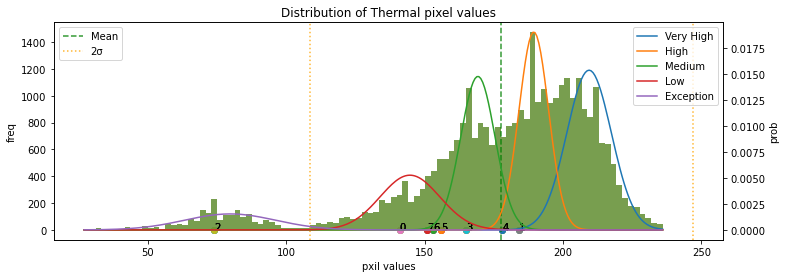

******* end *******
******* start *******
143.jpg
97 2
Module type1: Multi-Hotspots


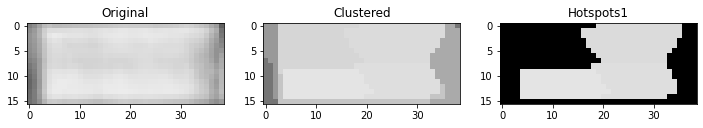

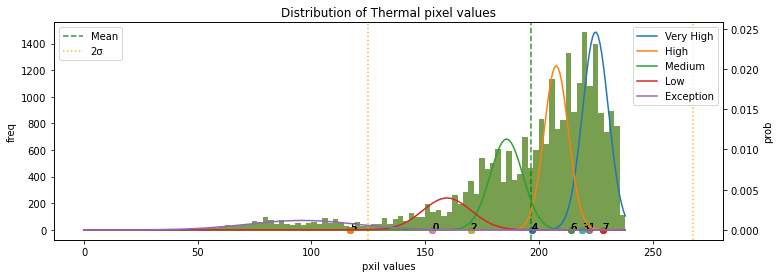

******* end *******
******* start *******
157.jpg
98 2
Module type1: Normal


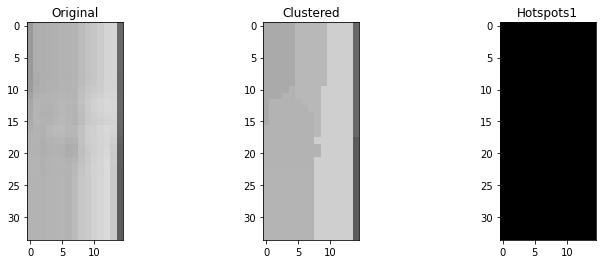

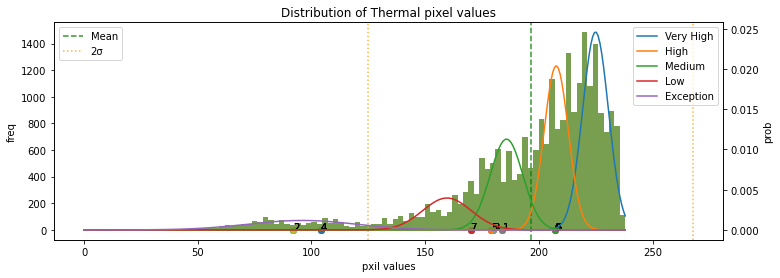

******* end *******
******* start *******
209.jpg
99 1
Module type1: Normal


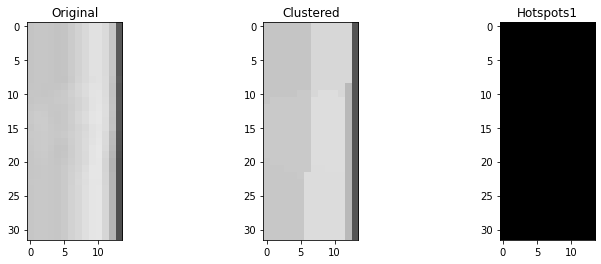

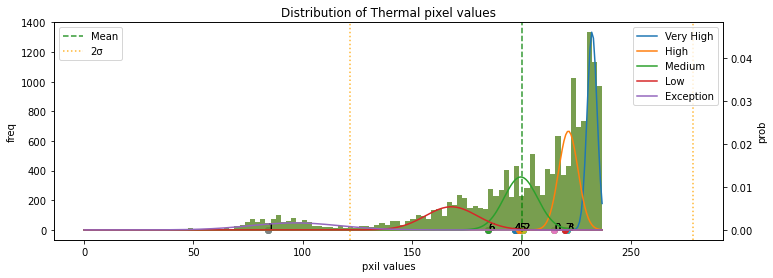

******* end *******
******* start *******
208.jpg
100 1
Module type1: Normal


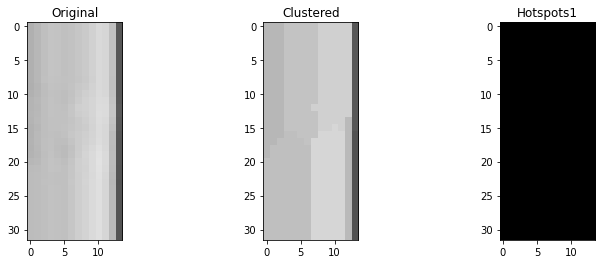

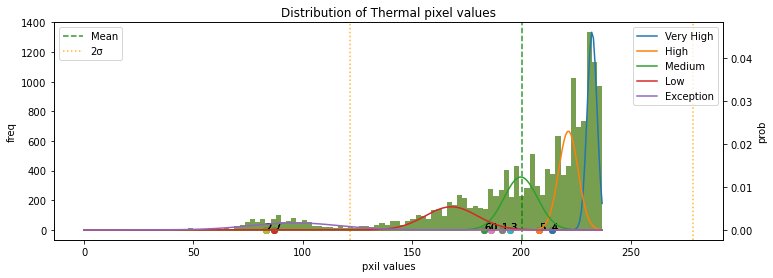

******* end *******
******* start *******
156.jpg
101 2
Module type1: Normal


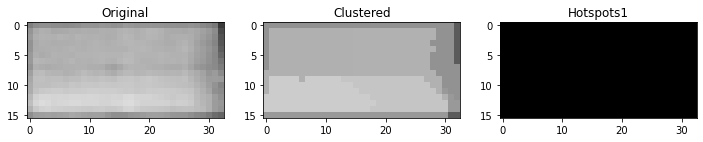

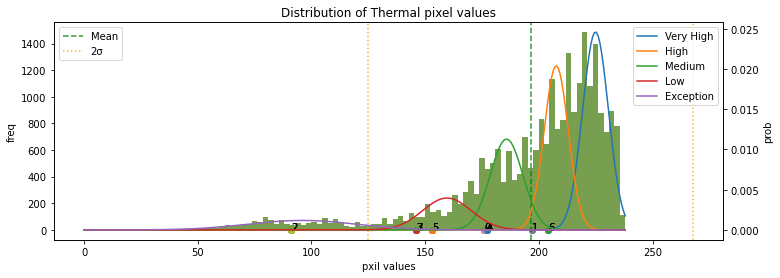

******* end *******
******* start *******
142.jpg
102 2
Module type1: Single-Hotspot


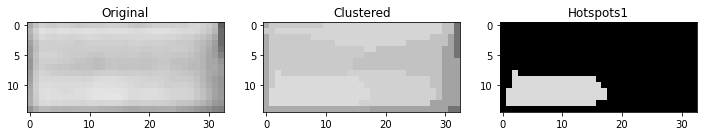

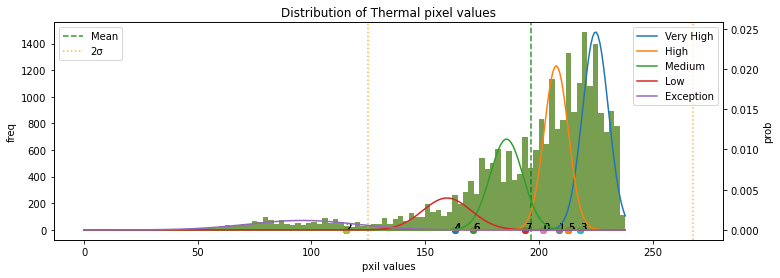

******* end *******
******* start *******
80.jpg
103 0
Module type1: Normal


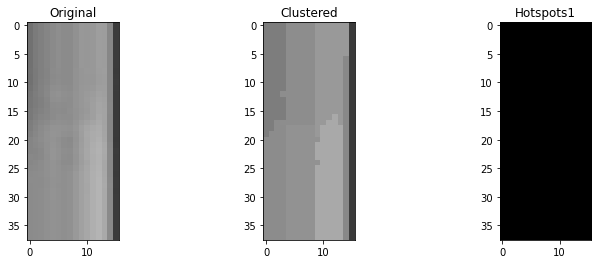

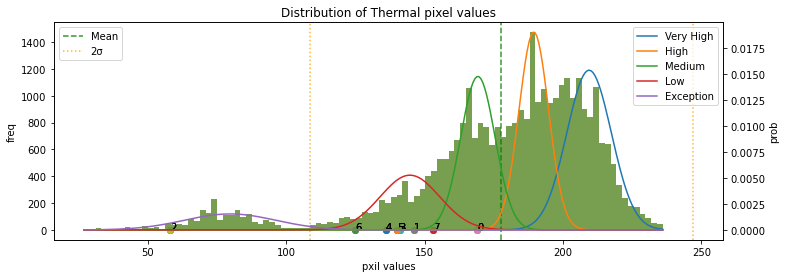

******* end *******
******* start *******
195.jpg
104 1
Module type1: Normal


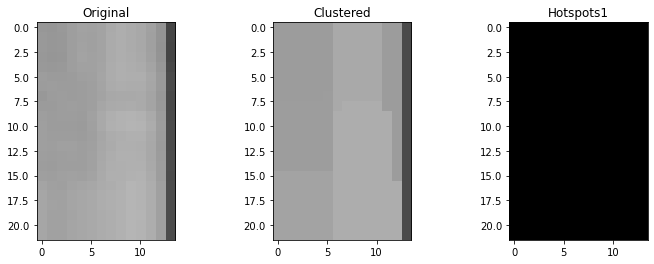

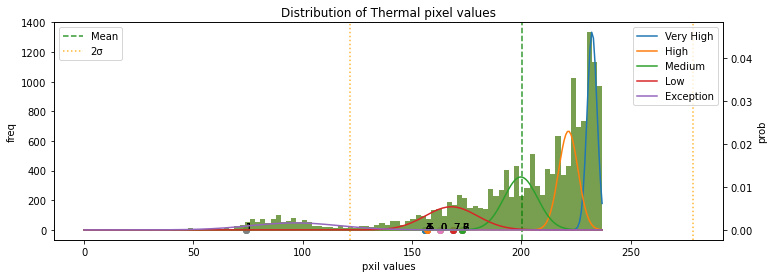

******* end *******
******* start *******
181.jpg
105 1
Module type1: Module-Anomaly


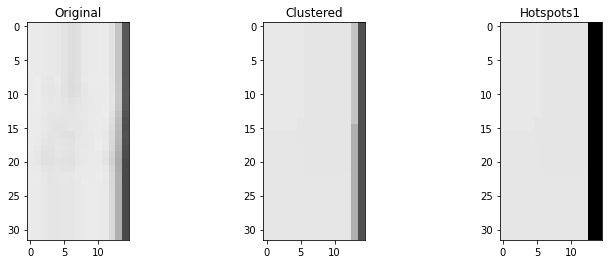

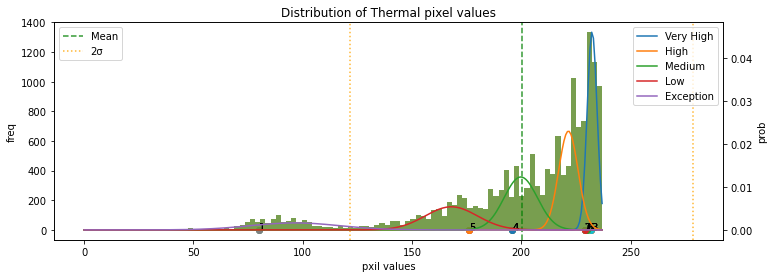

******* end *******
******* start *******
5.jpg
106 3
Module type1: Module-Anomaly


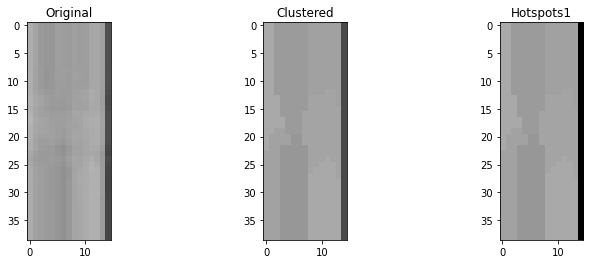

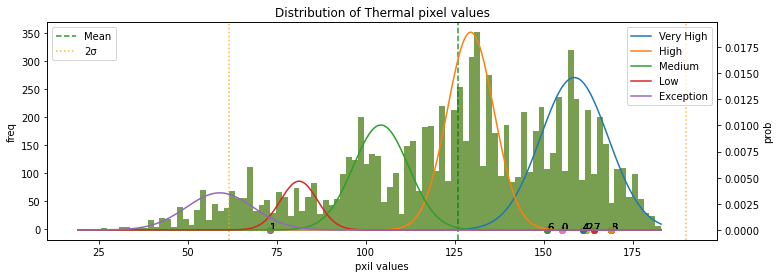

******* end *******
******* start *******
57.jpg
107 0
Module type1: Multi-Hotspots


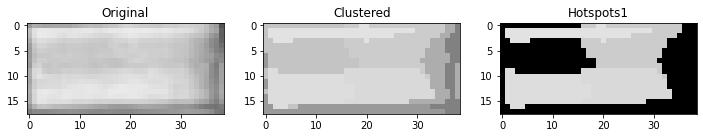

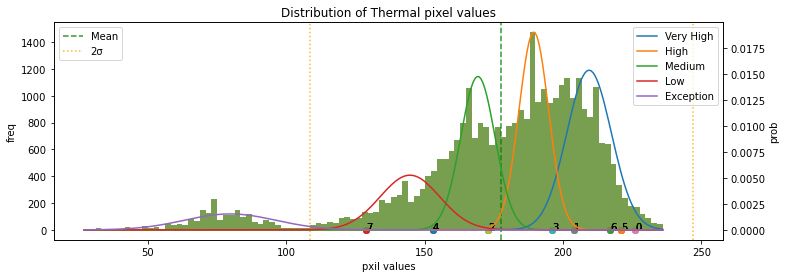

******* end *******
******* start *******
43.jpg
108 0
Module type1: Cluster-Anomaly


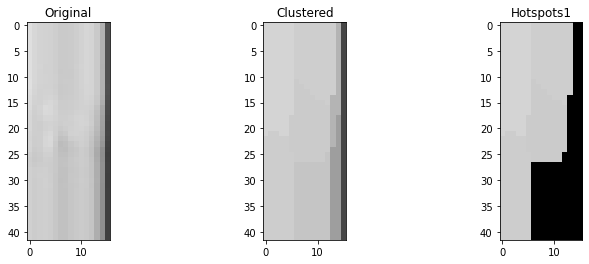

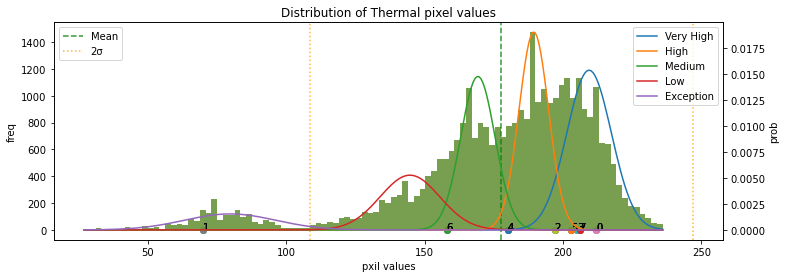

******* end *******
******* start *******
55.jpg
109 0
Module type1: Module-Anomaly


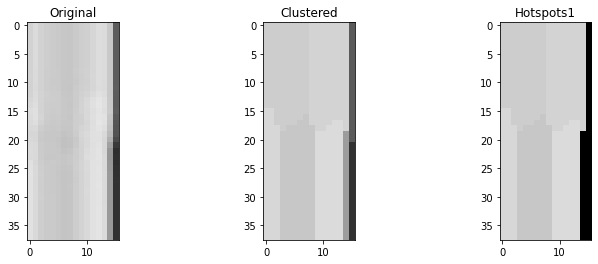

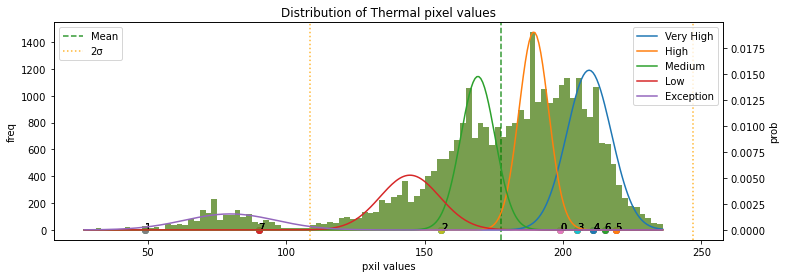

******* end *******
******* start *******
7.jpg
110 3
Module type1: Module-Anomaly


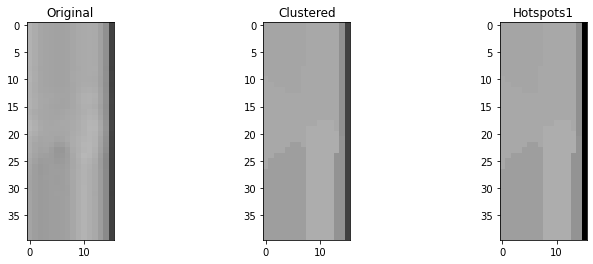

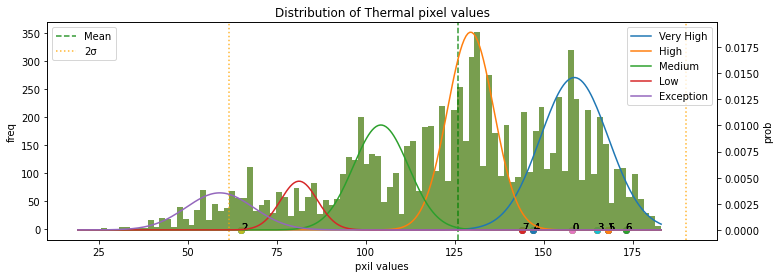

******* end *******
******* start *******
41.jpg
111 0
Module type1: Module-Anomaly


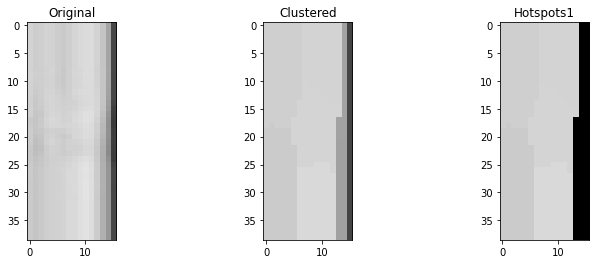

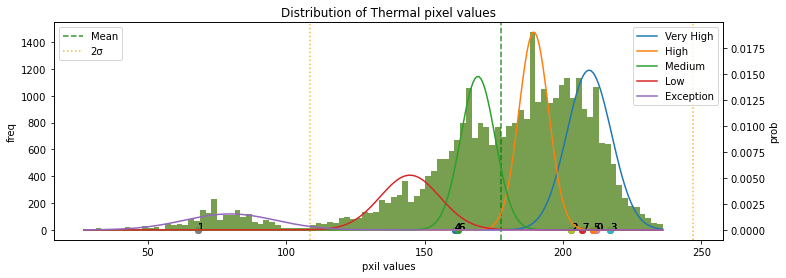

******* end *******
******* start *******
69.jpg
112 0
Module type1: Multi-Hotspots


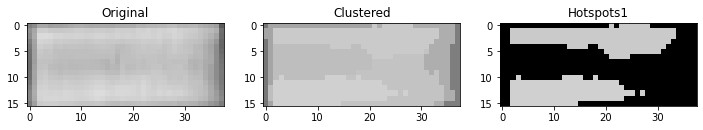

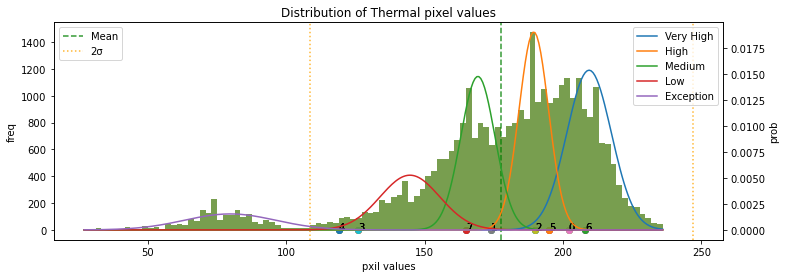

******* end *******
******* start *******
197.jpg
113 1
Module type1: Normal


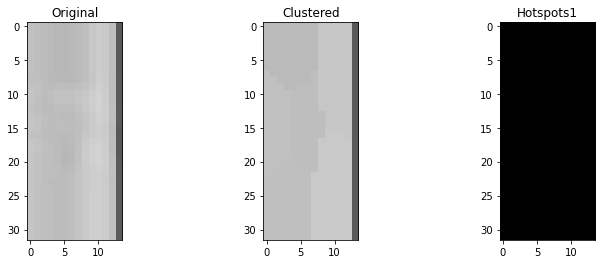

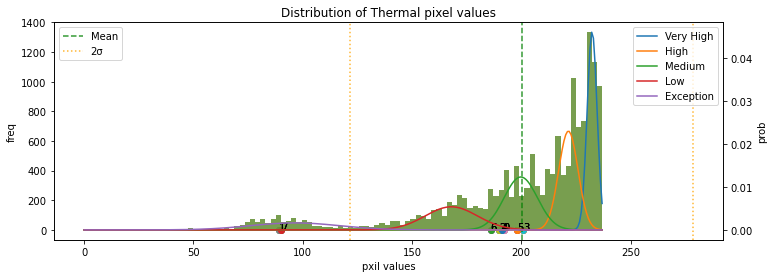

******* end *******
******* start *******
183.jpg
114 1
Module type1: Cluster-Anomaly


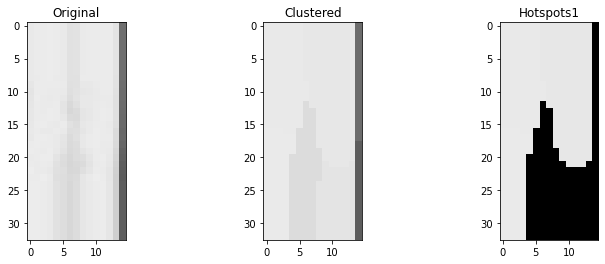

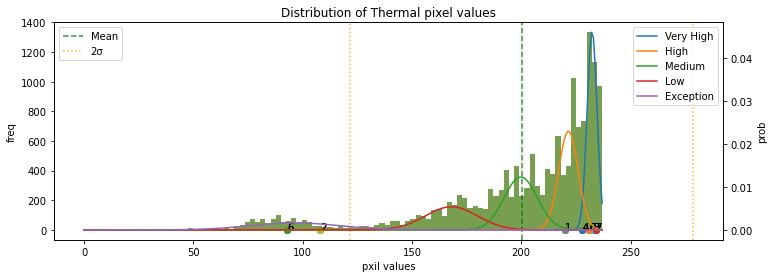

******* end *******
******* start *******
82.jpg
115 0
Module type1: Normal


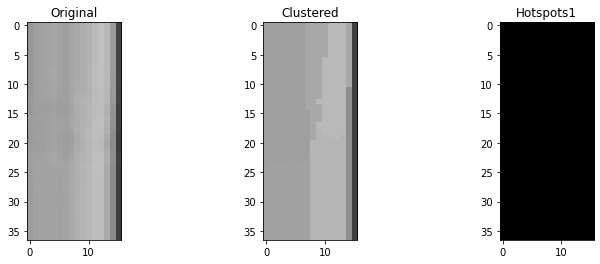

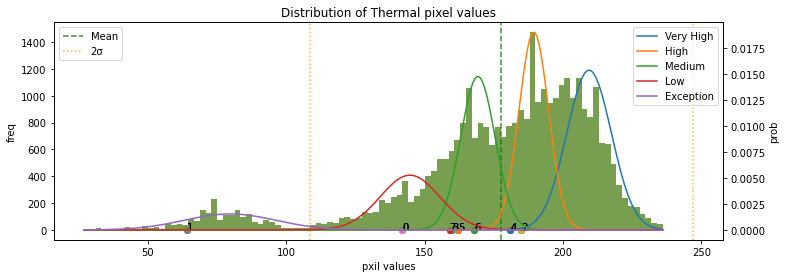

******* end *******
******* start *******
154.jpg
116 2
Module type1: Single-Hotspot


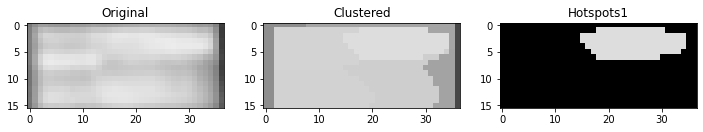

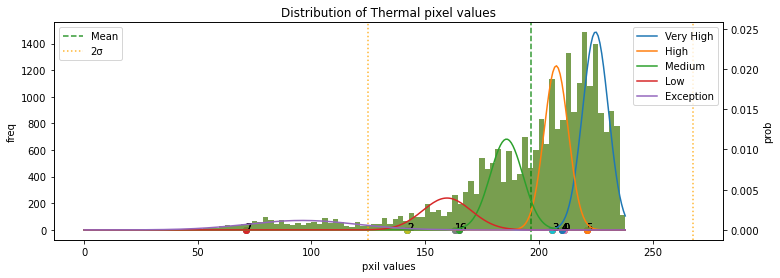

******* end *******
******* start *******
140.jpg
117 2
Module type1: Normal


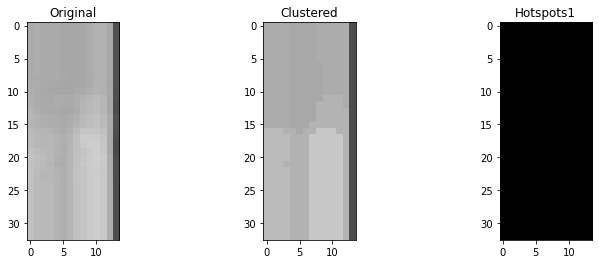

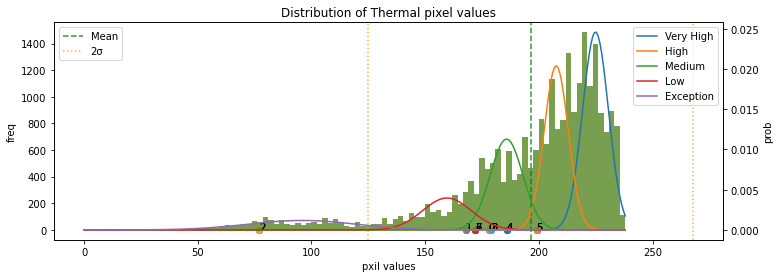

******* end *******
******* start *******
141.jpg
118 2
Module type1: Cluster-Anomaly


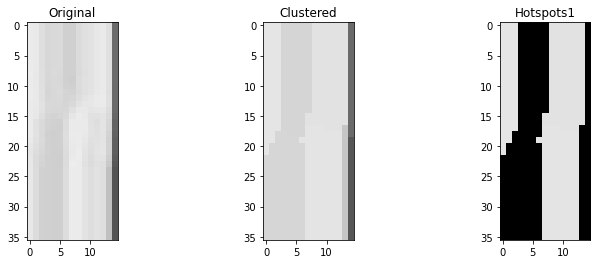

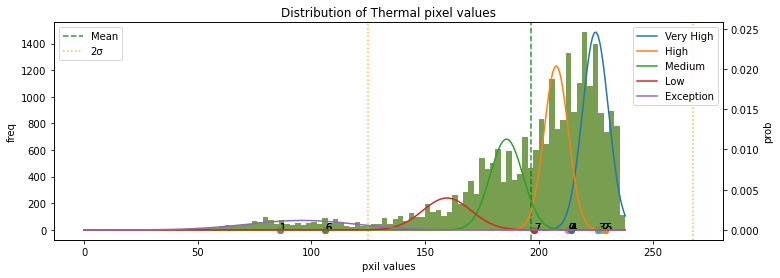

******* end *******
******* start *******
155.jpg
119 2
Module type1: Normal


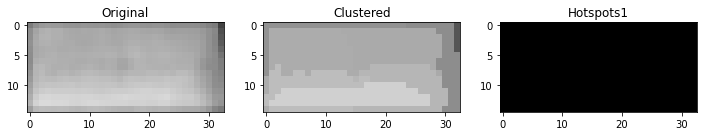

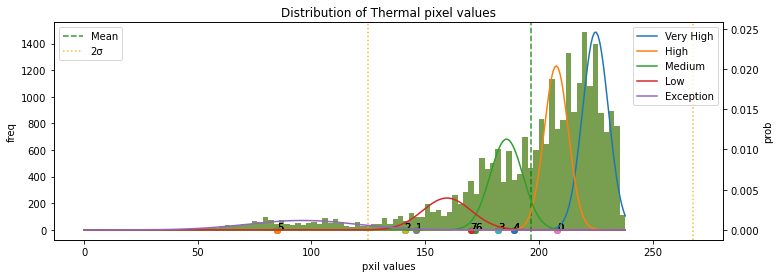

******* end *******
******* start *******
83.jpg
120 0
Module type1: Normal


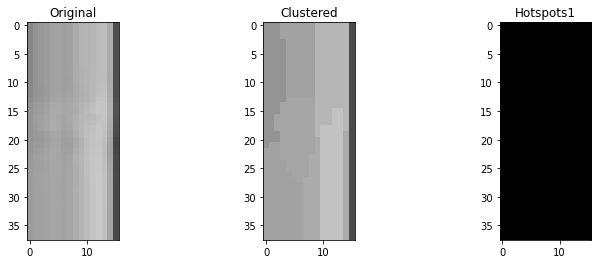

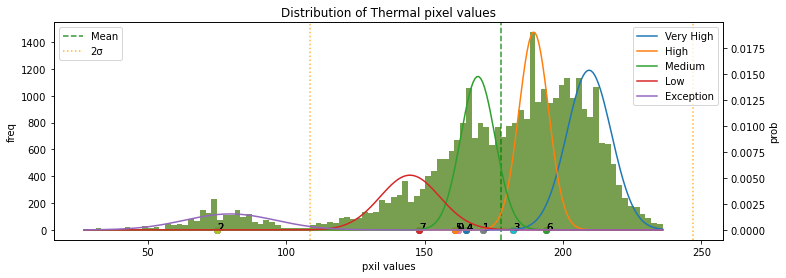

******* end *******
******* start *******
68.jpg
121 0
Module type1: Cluster-Anomaly


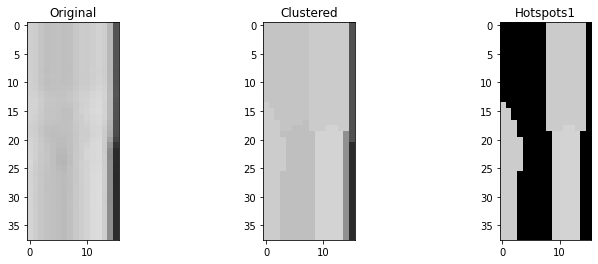

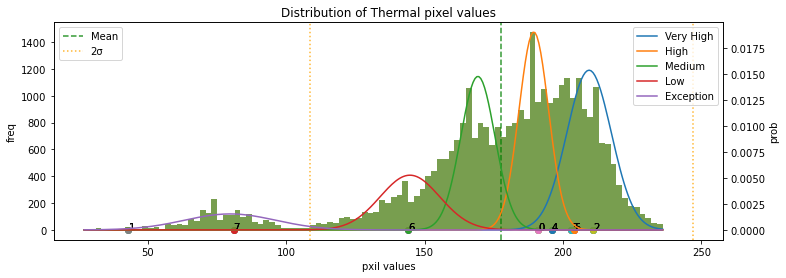

******* end *******
******* start *******
196.jpg
122 1
Module type1: Normal


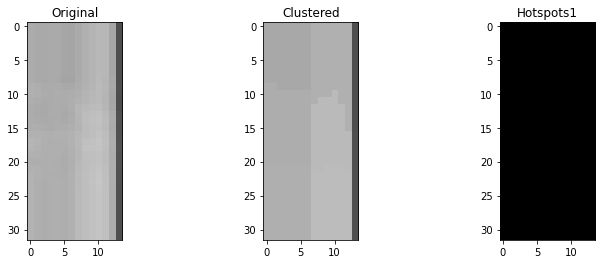

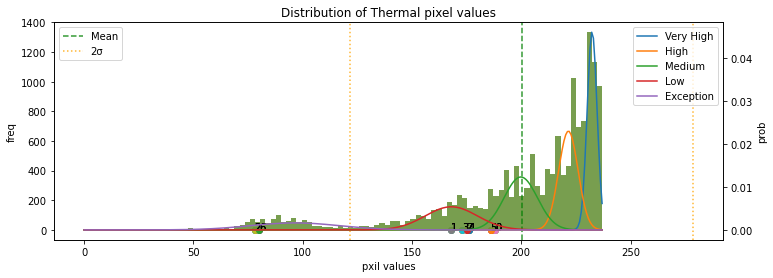

******* end *******
******* start *******
40.jpg
123 0
Module type1: Module-Anomaly


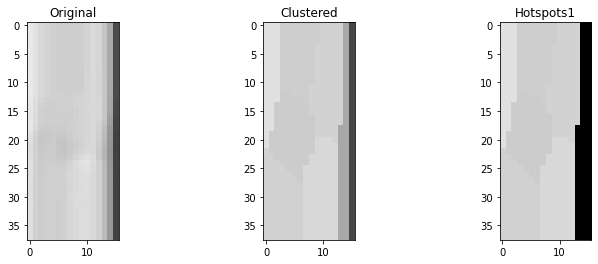

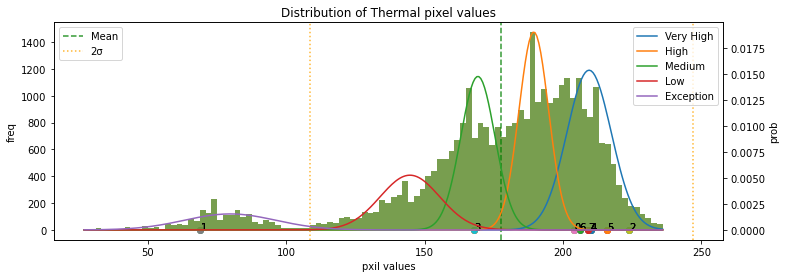

******* end *******
******* start *******
54.jpg
124 0
Module type1: Multi-Hotspots


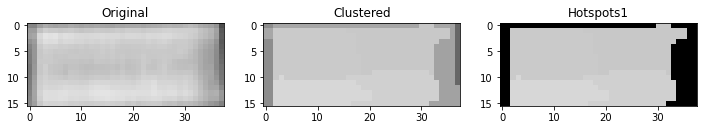

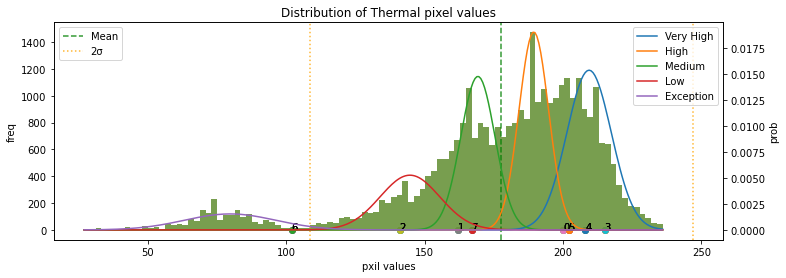

******* end *******
******* start *******
6.jpg
125 3
Module type1: Module-Anomaly


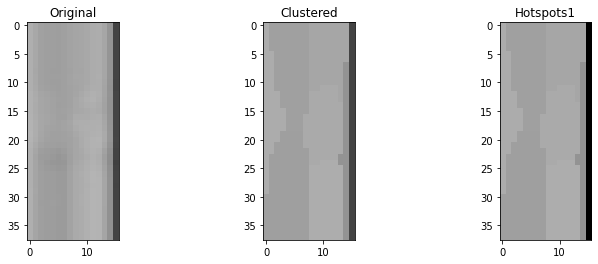

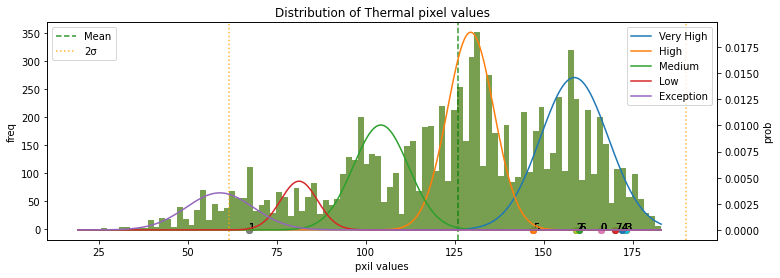

******* end *******
******* start *******
192.jpg
126 1
Module type1: Cluster-Anomaly


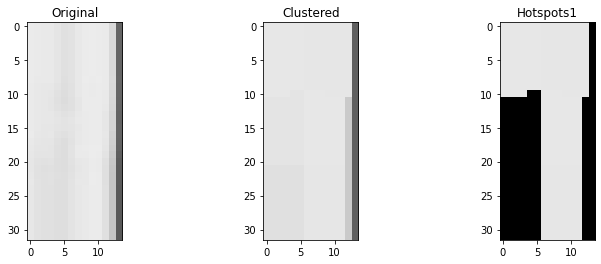

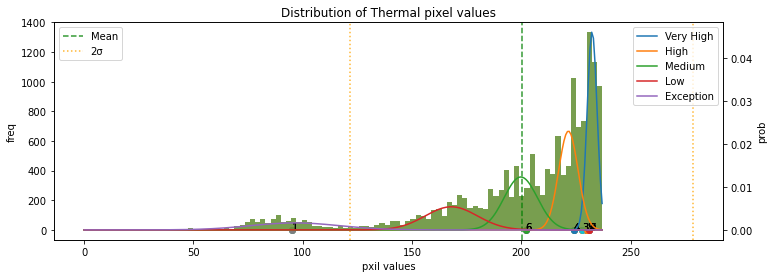

******* end *******
******* start *******
78.jpg
127 0
Module type1: Normal


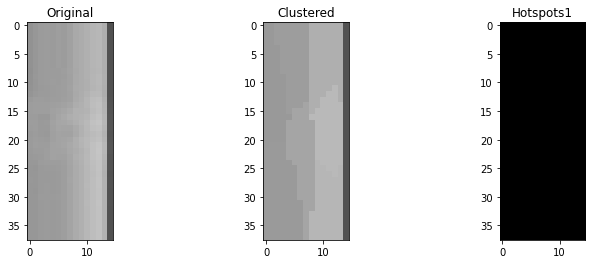

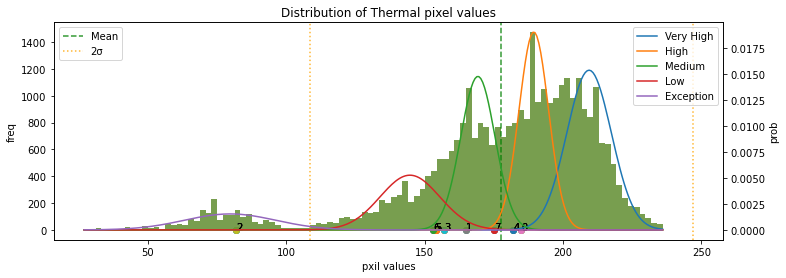

******* end *******
******* start *******
186.jpg
128 1
Module type1: Normal


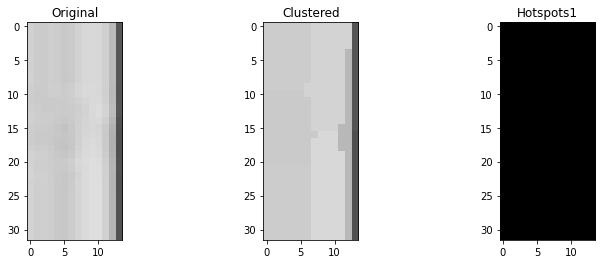

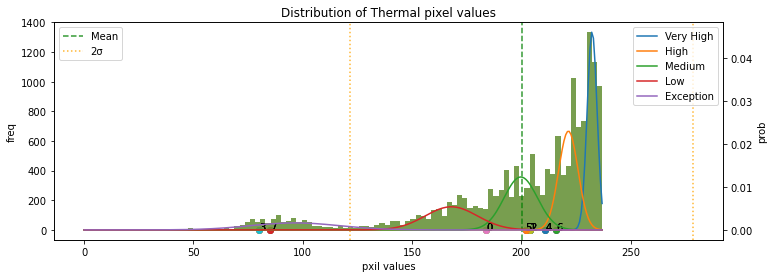

******* end *******
******* start *******
2.jpg
129 3
Module type1: Single-Hotspot


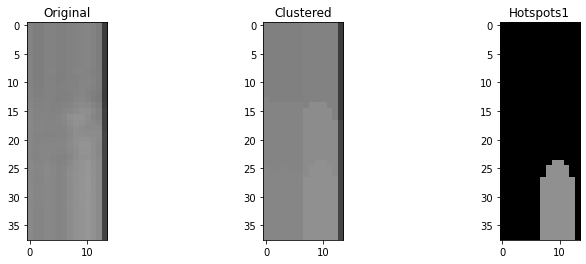

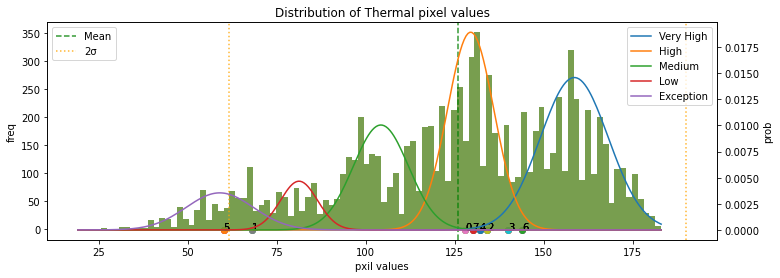

******* end *******
******* start *******
50.jpg
130 0
Module type1: Cluster-Anomaly


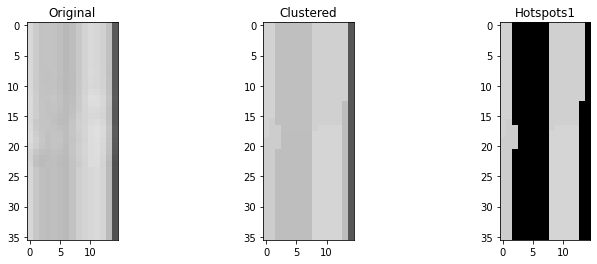

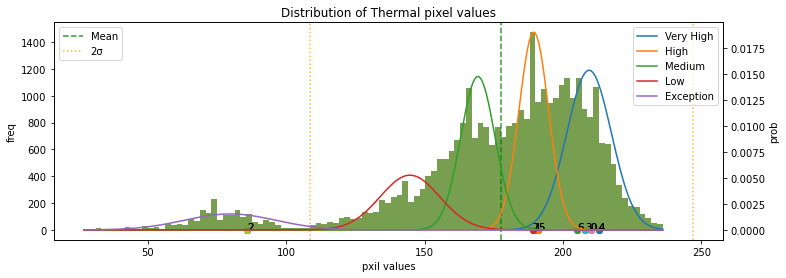

******* end *******
******* start *******
151.jpg
131 2
Module type1: Normal


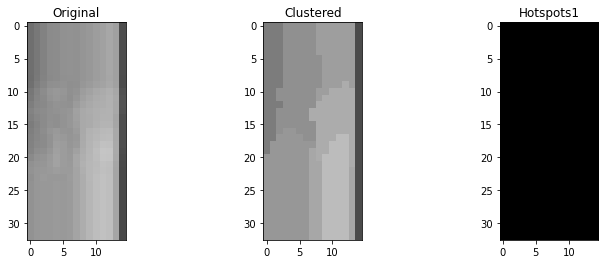

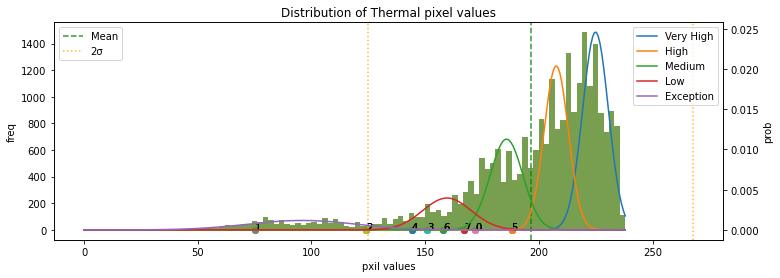

******* end *******
******* start *******
145.jpg
132 2
Module type1: Cluster-Anomaly


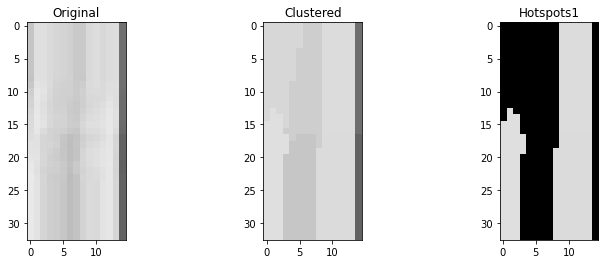

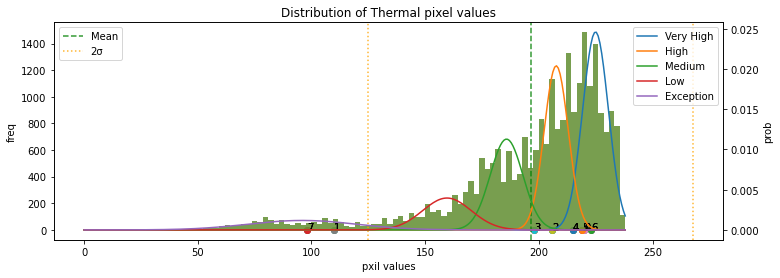

******* end *******
******* start *******
87.jpg
133 0
Module type1: Normal


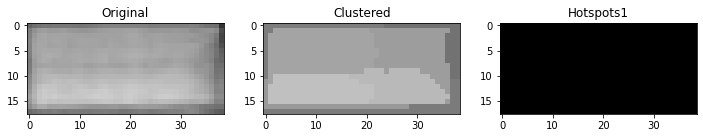

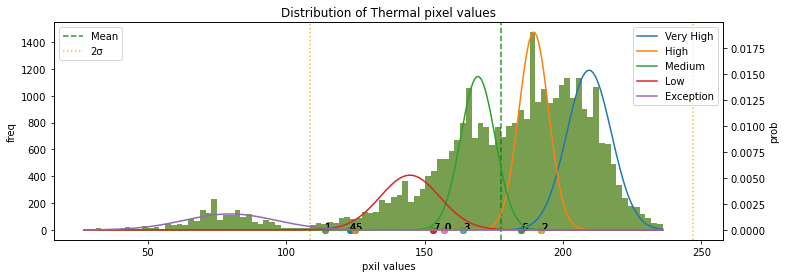

******* end *******
******* start *******
179.jpg
134 1
Module type1: Single-Hotspot


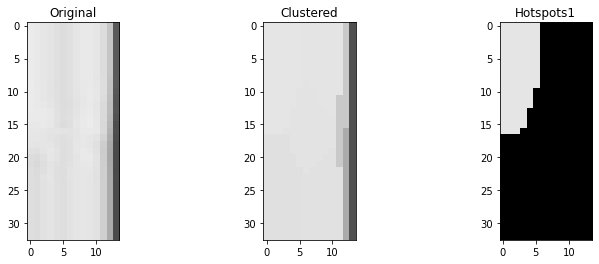

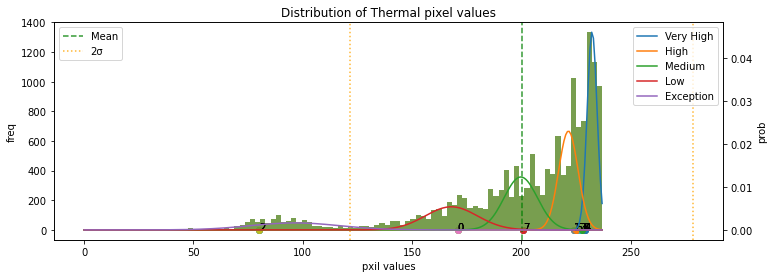

******* end *******
******* start *******
86.jpg
135 0
Module type1: Normal


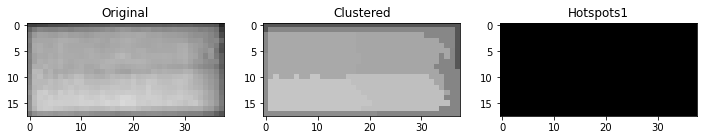

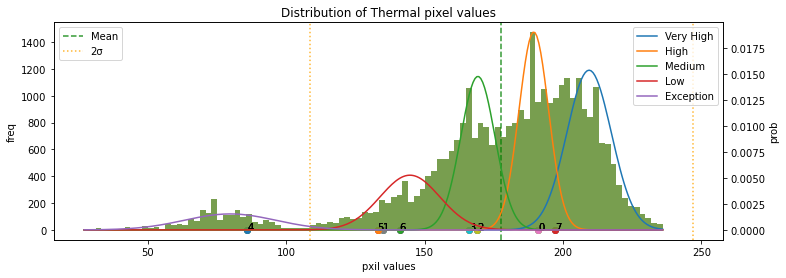

******* end *******
******* start *******
178.jpg
136 1
Module type1: Normal


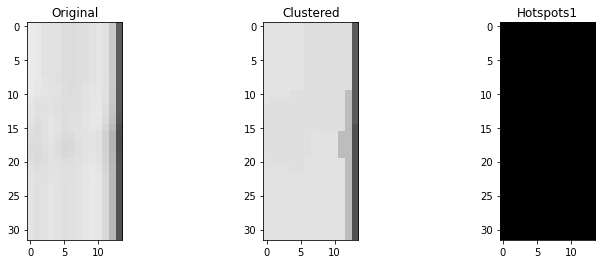

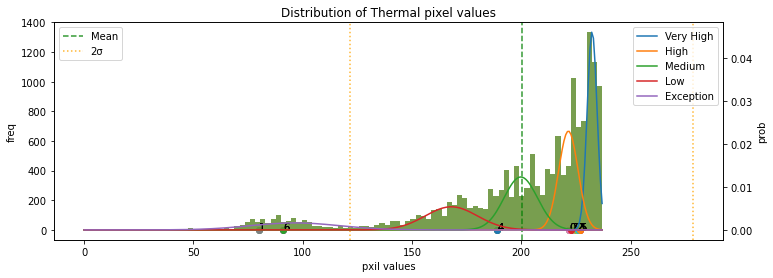

******* end *******
******* start *******
144.jpg
137 2
Module type1: Multi-Hotspots


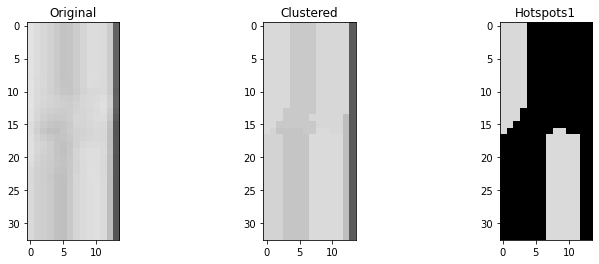

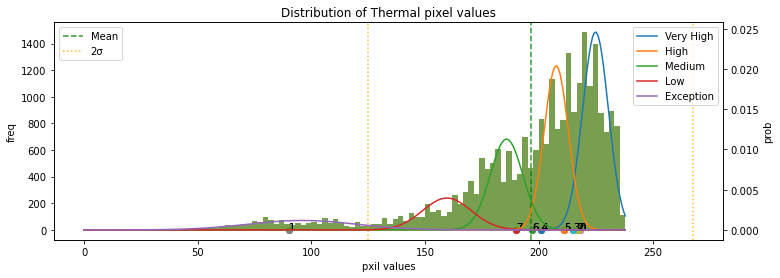

******* end *******
******* start *******
150.jpg
138 2
Module type1: Normal


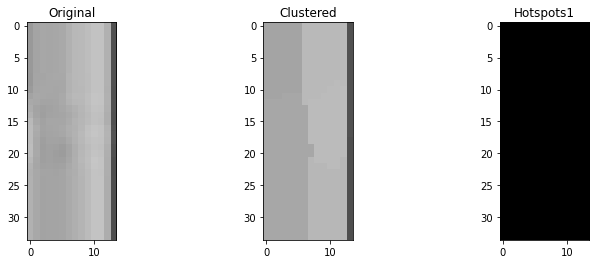

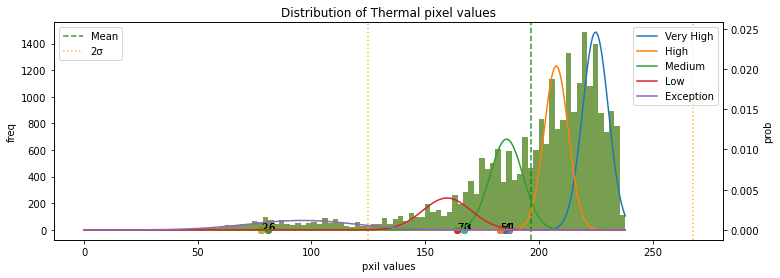

******* end *******
******* start *******
3.jpg
139 3
Module type1: Multi-Hotspots


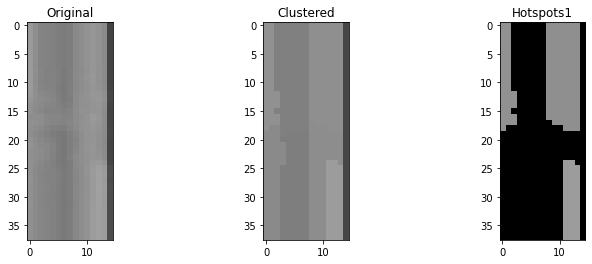

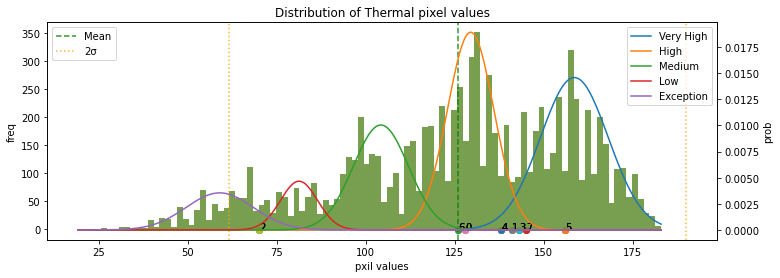

******* end *******
******* start *******
51.jpg
140 0
Module type1: Normal


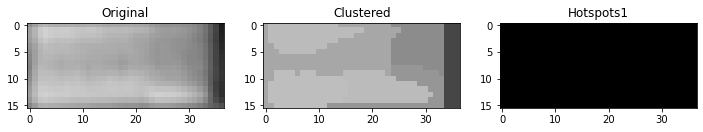

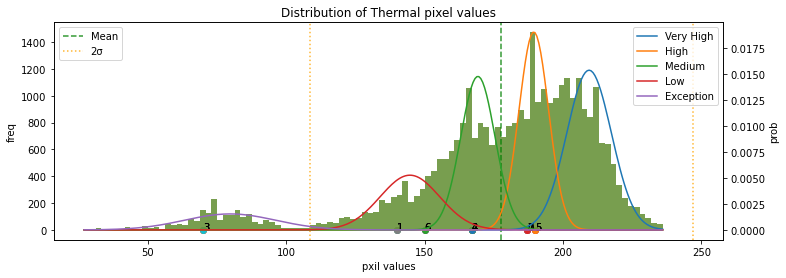

******* end *******
******* start *******
193.jpg
141 1
Module type1: Cluster-Anomaly


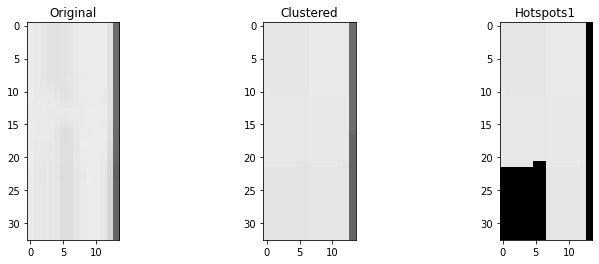

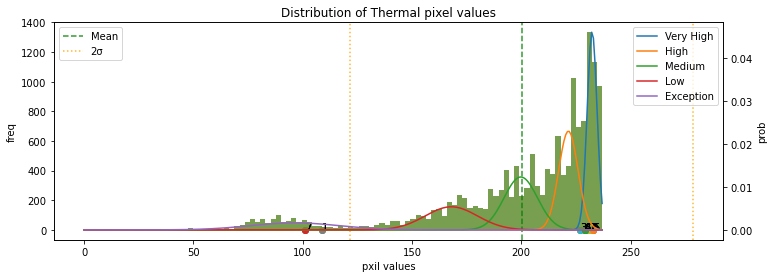

******* end *******
******* start *******
185.jpg
142 1
Module type1: Normal


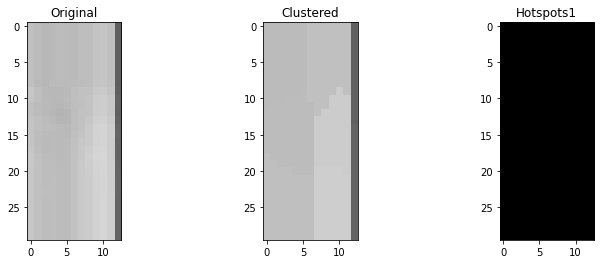

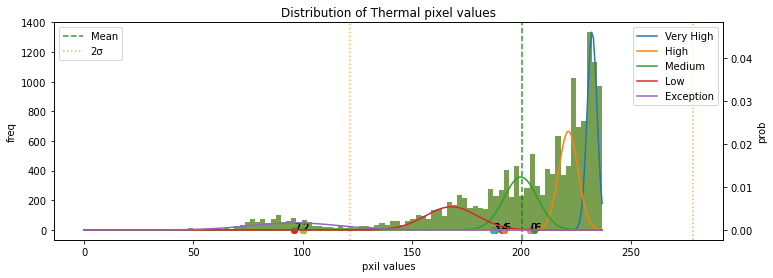

******* end *******
******* start *******
191.jpg
143 1
Module type1: Cluster-Anomaly


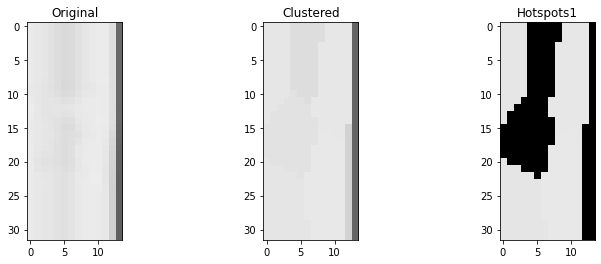

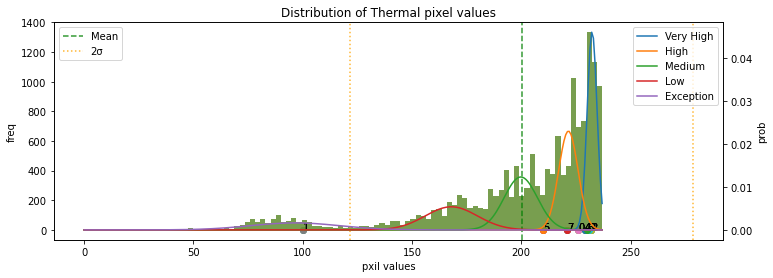

******* end *******
******* start *******
47.jpg
144 0
Module type1: Normal


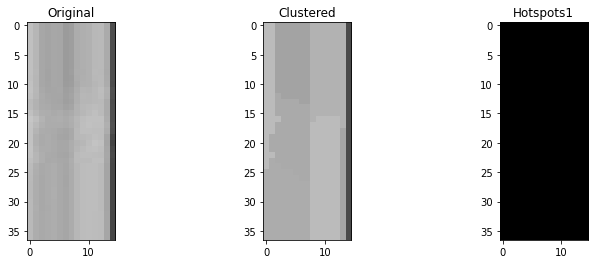

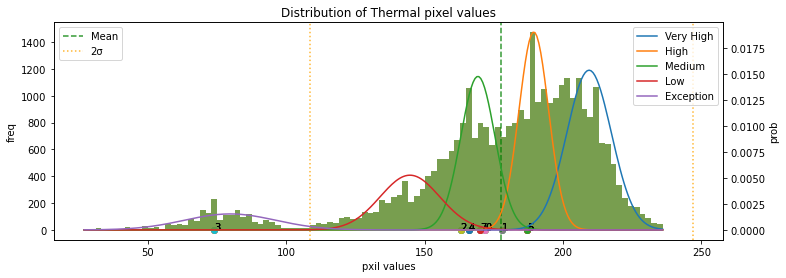

******* end *******
******* start *******
53.jpg
145 0
Module type1: Cluster-Anomaly


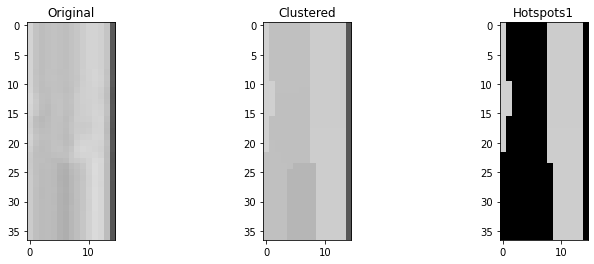

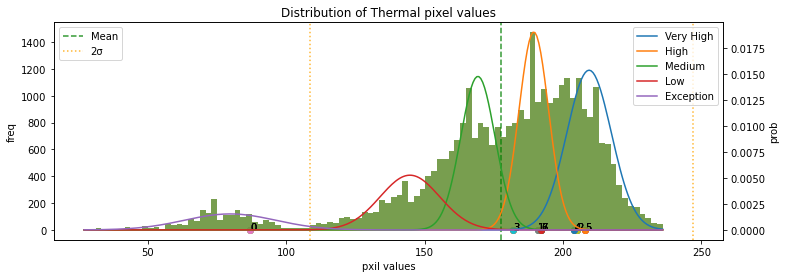

******* end *******
******* start *******
1.jpg
146 3
Module type1: Normal


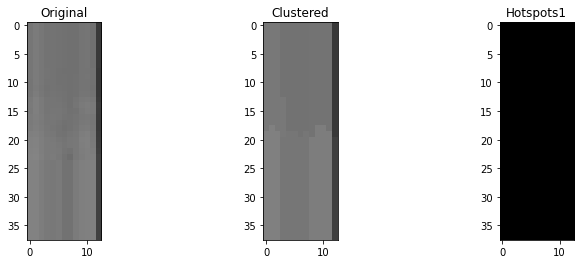

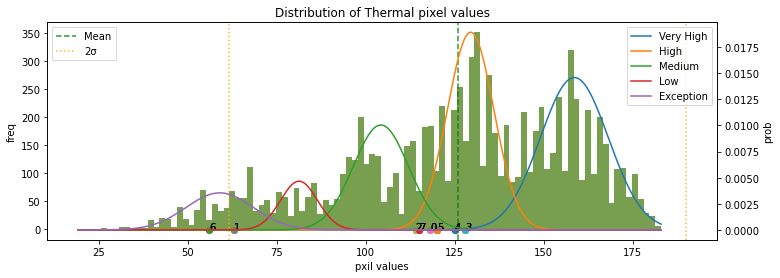

******* end *******
******* start *******
146.jpg
147 2
Module type1: Cluster-Anomaly


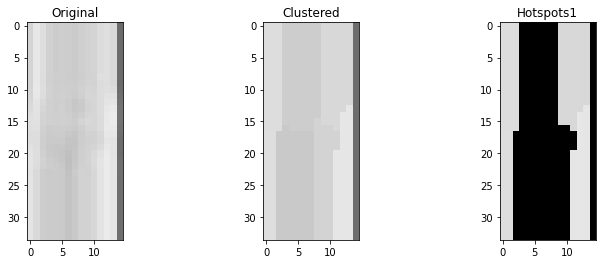

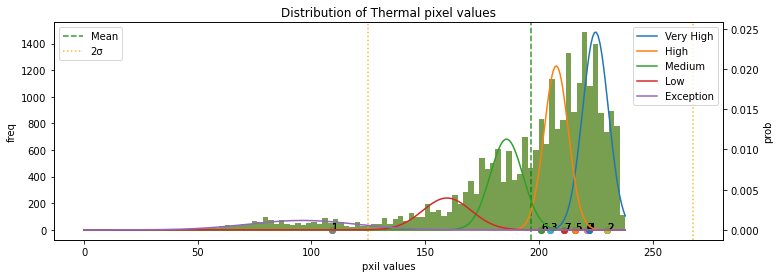

******* end *******
******* start *******
152.jpg
148 2
Module type1: Multi-Hotspots


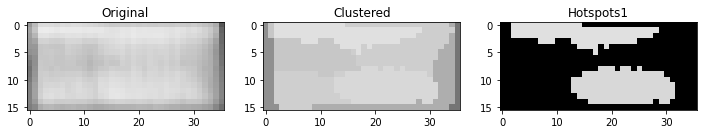

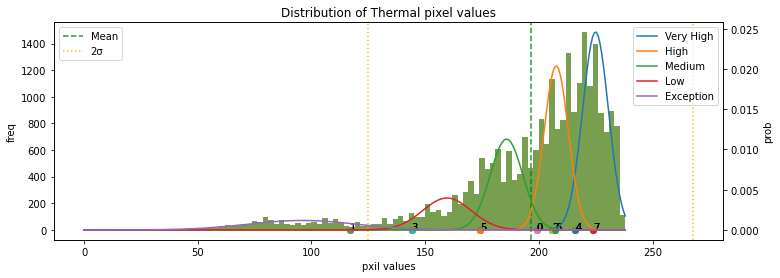

******* end *******
******* start *******
84.jpg
149 0
Module type1: Normal


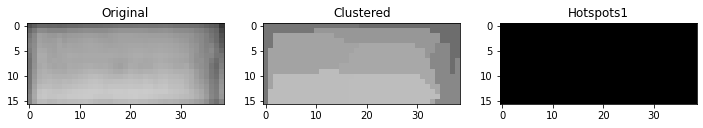

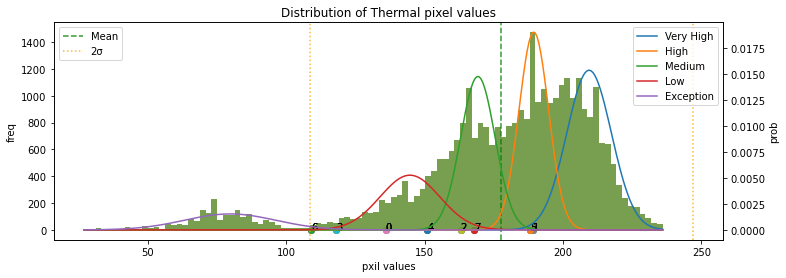

******* end *******
******* start *******
85.jpg
150 0
Module type1: Single-Hotspot


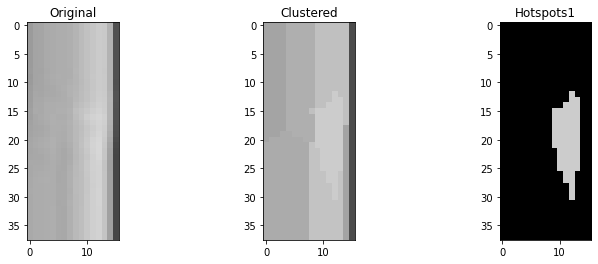

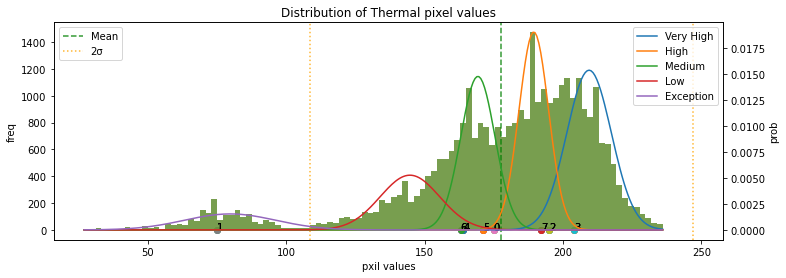

******* end *******
******* start *******
153.jpg
151 2
Module type1: Normal


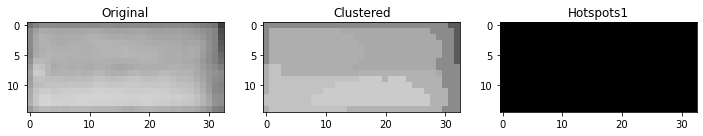

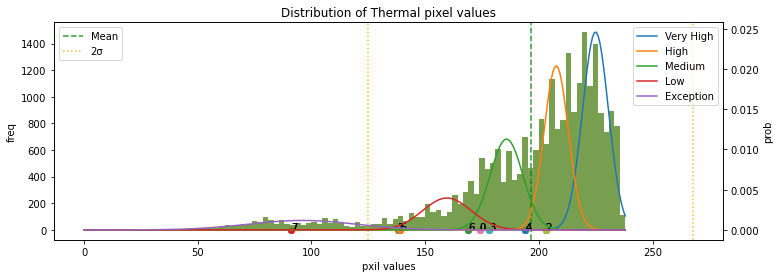

******* end *******
******* start *******
147.jpg
152 2
Module type1: Cluster-Anomaly


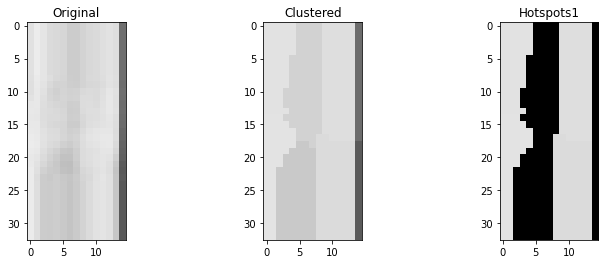

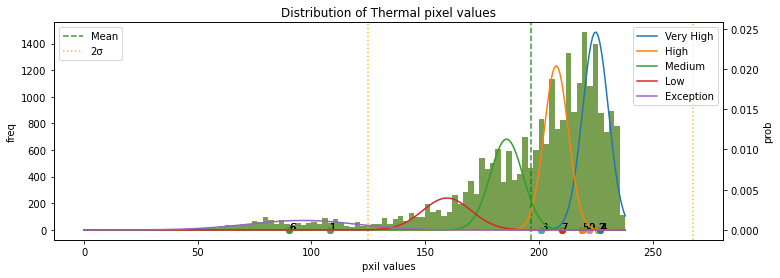

******* end *******
******* start *******
52.jpg
153 0
Module type1: Cluster-Anomaly


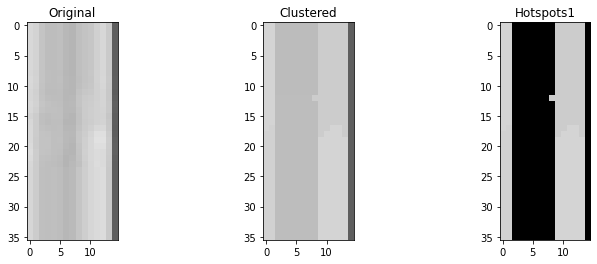

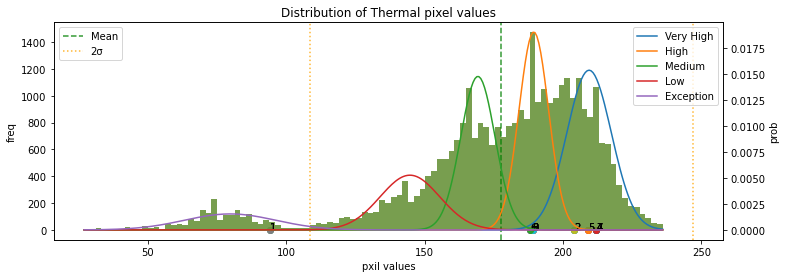

******* end *******
******* start *******
0.jpg
154 3
Module type1: Normal


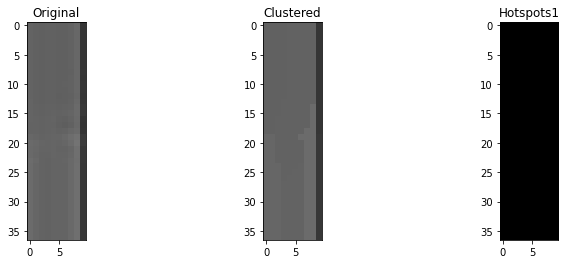

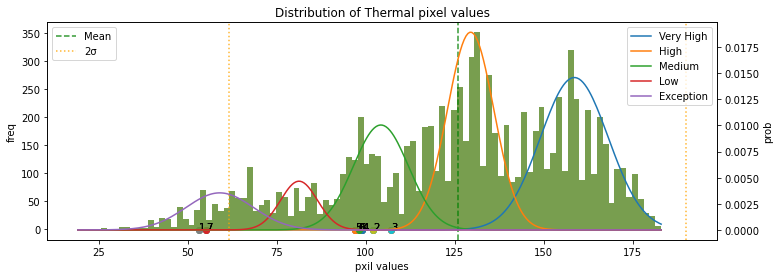

******* end *******
******* start *******
46.jpg
155 0
Module type1: Normal


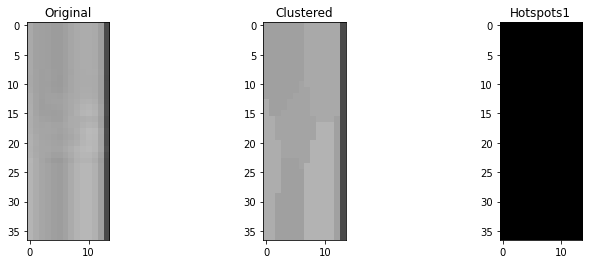

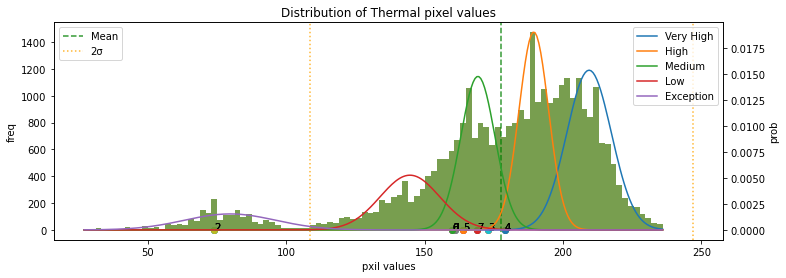

******* end *******
******* start *******
190.jpg
156 1
Module type1: Cluster-Anomaly


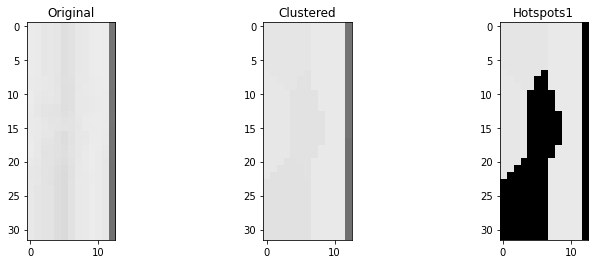

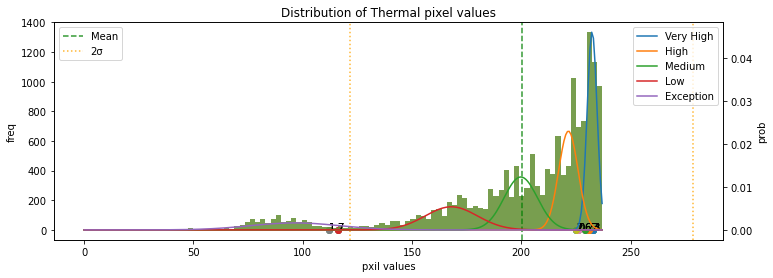

******* end *******
******* start *******
184.jpg
157 1
Module type1: Normal


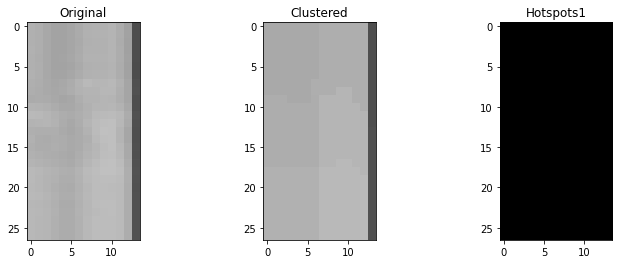

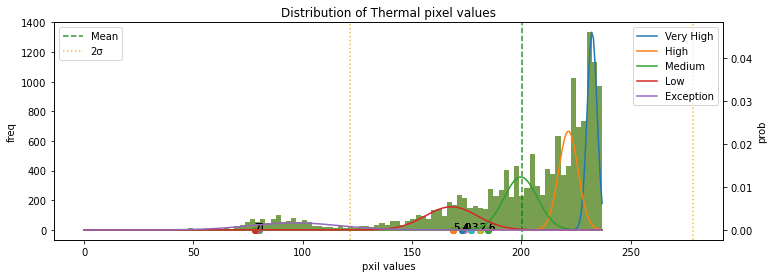

******* end *******


In [52]:
#for n, k in enumerate(list(thermal_img_files)[:10]):
for n, k in enumerate(list(thermal_img_files)):    
    print("******* start *******")
    # -- module label --
    l = module_labels[n]
    # -- cluster temperature ---
    clusters = clustering.TemperatureClusters(
        data[l].scaled_temperature_with_index[k], method=clustering_method)    
    clusters_temperature = clusters.get_clusters_data(data[l].temperature[k])
    centers_temperature = np.stack([np.uint8(t.mean(axis=0)) for t in clusters_temperature])
    scaled_clusters_temperature = clusters.get_clusters_data(data[l].scaled_temperature[k])
    scaled_centers_temperature = np.stack([t.mean(axis=0) for t in scaled_clusters_temperature ])
    # -- anomaly detection --    
    module_type1, hot_pixels1, cluster_types1 = get_module_anomaly_type(
        centers_temperature, gmm[l], thermal_img_files[k])
    #module_type2, hot_pixels2, cluster_types2 = get_module_anomaly_type(
    #   scaled_centers_temperature, gmm2, thermal_img_files[k])
    # -- save anomaly modules --
    if module_type1 not in anomaly_modules:
        anomaly_modules[module_type1] = [k]
    else:
        anomaly_modules[module_type1].append(k)
    print("Module type1:", module_type1)
    #print("Module type2:", module_type2)
    # -- display -- 
    img_clustered = centers_temperature[clusters.labels] 
    img_clustered = img_clustered.reshape(thermal_img_files[k].shape)
    img_hotspots1 = img_clustered * hot_pixels1
#    img_hotspots2 = img_clustered * hot_pixels2    
    display.display_modules({
        "Original": thermal_img_files[k], 
        "Clustered": img_clustered,
        "Hotspots1": img_hotspots1,
#        "Hotspots2": img_hotspots2,        
    })
    display.display_distributions(
        data[l].all_temperature, 
        filepath = "./hist/hist_" + k,
        cluster_centers = centers_temperature,
        gmm = gmm[l]
    )
#    display.display_distributions(
#        data.scaled_all_temperature, 
#        filepath = "./hist/scaled_hist_" + k,
#        cluster_centers = scaled_centers_temperature,
#        gmm = gmm2
#    )
    print("******* end *******")

In [53]:
import json
tmp = open("anomaly_modules.json", "w")
json.dump(anomaly_modules, tmp, indent=4, sort_keys=True, separators=(',', ': '))
tmp.close()

In [54]:
# モジュール抽出

In [55]:
filters = Filters(thermal_npdat_path)

In [56]:
img_org = cv2.imread(input_img_path, 0)
img_filtered = filters.apply_all_filters(img_org)

In [57]:
# 異常モジュール可視化

In [58]:
with open('anomaly_modules.json', 'r') as f:
    anomaly_modules = json.load(f)

In [59]:
modules = Modules(img_filtered, anomaly_modules)

In [60]:
anomaly_contours = modules.get_anomaly_contours()

/Users/tnozawa/afterFIT/work/rule_based_anomaly_detection/module_extraction.py:58: UserWarning: Matplotlib is currently using module://ipykernel.pylab.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()


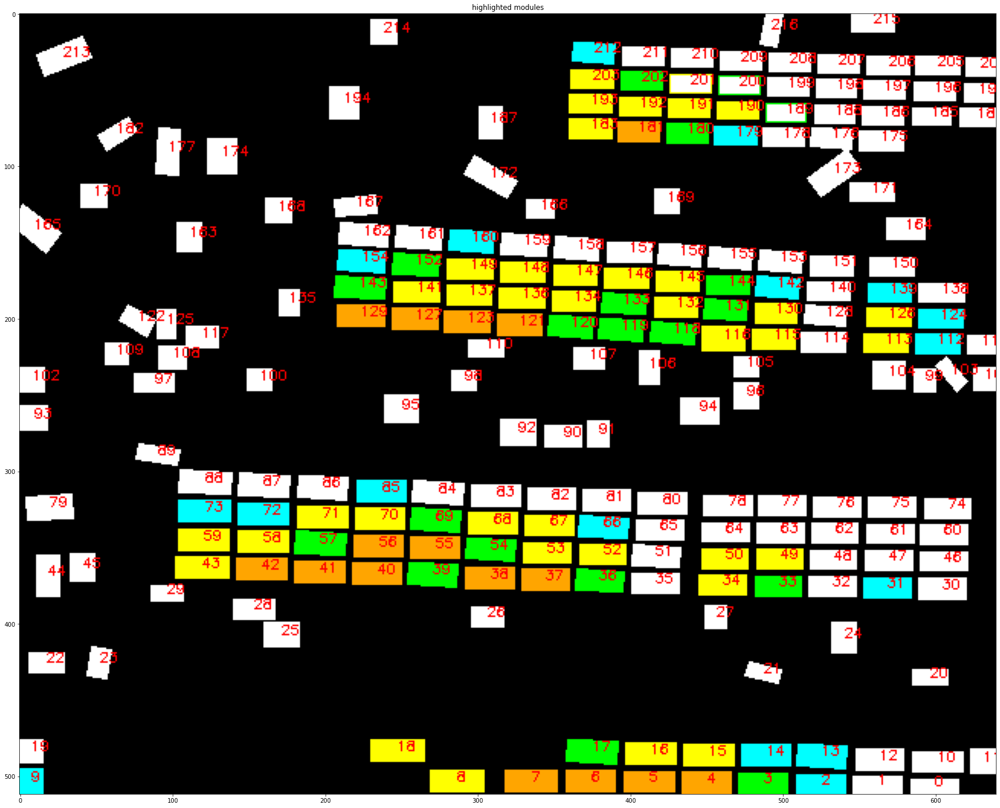

In [61]:
color_list = {
    "Single-Hotspot": (0,255,255), # aqua
    "Multi-Hotspots": (0,255,0), # green
    "Cluster-Anomaly": (255,255,0), # yellow
    "Module-Anomaly": (255,165,0), # orange
}
img_target_index = modules.get_img_contours(img_org, index=False)
for k, v in anomaly_contours.items():
    if k == "Normal":
        continue
    else:
        img_target_index = modules.get_img_target_contours(
            img_target_index, v, index=True, color=color_list[k])
module_extraction.show_img(
    {"highlighted modules":img_target_index}, cmap="gray", figsize=(30,30)
)

In [65]:
string_anomaly_labels = modules.get_string_anomaly_labels(anomaly_contours["Module-Anomaly"])

In [66]:
img_string_index = modules.get_img_target_contours(
    modules.get_img_contours(img_org, index=False),
    anomaly_contours["Module-Anomaly"][string_anomaly_labels>=0], 
    index=True, color=(238,130,238)) # violet

/Users/tnozawa/afterFIT/work/rule_based_anomaly_detection/module_extraction.py:58: UserWarning: Matplotlib is currently using module://ipykernel.pylab.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()


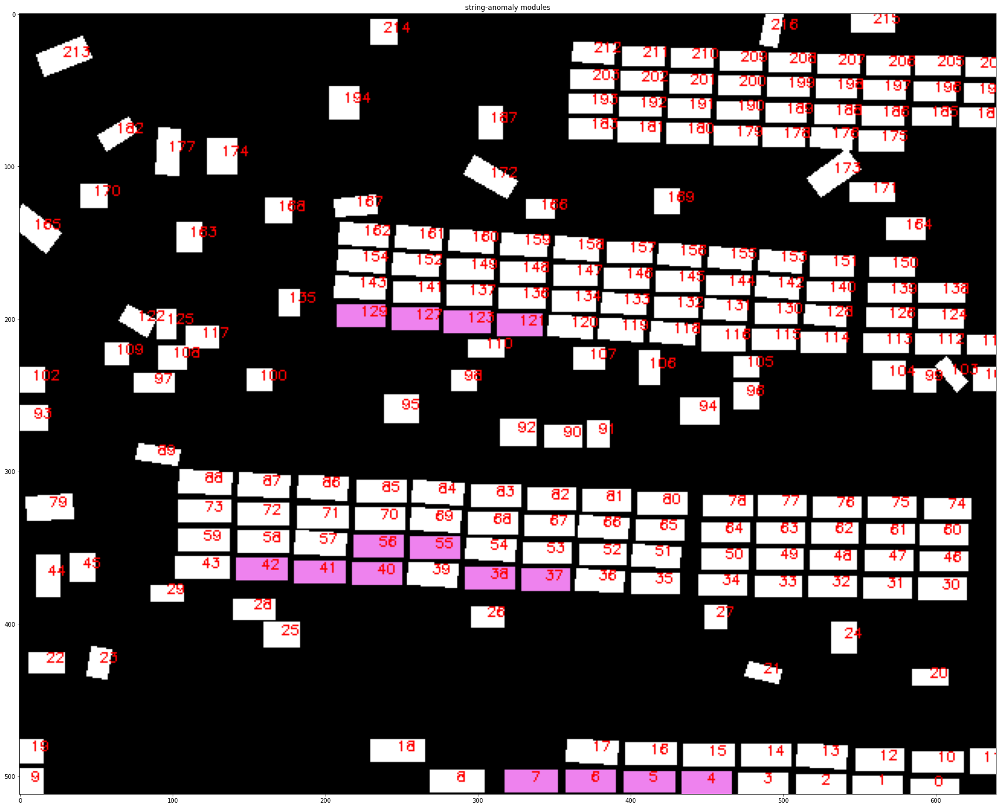

In [67]:
module_extraction.show_img({"string-anomaly modules":img_string_index},cmap="gray",figsize=(30,30))

In [ ]:
#ToDo
## 異常部分へのマーキング（赤で囲む）
## 分類モデルの改良